## Funciones

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# función para obtener analisis de los datos
def analisis_univariable(data, columna):
  count = data[columna].count()
  nans = data[columna].isna().sum()
  q1 = data[columna].quantile(.25)
  median = data[columna].quantile(.5)
  q3 = data[columna].quantile(.75)
  mean = data[columna].mean()
  min = data[columna].min()
  max = data[columna].max()
  std = data[columna].std()
  rango = data[columna].max() - data[columna].min()
  skew = data[columna].skew()

  print(f"ANÁLISIS DE LA COLUMNA {columna}")
  print()
  print("CANTIDAD DE DATOS Y VALORES NANS")
  print(f"- Cantidad de datos     : {count}")
  print(f"- Cantidad de Nans      : {nans}")
  print("---"*30)
  print("CUARTILES")
  print(f"- Primer Cuartil (25%)  : {q1}")
  print(f"- Mediana        (50%)  : {median}")
  print(f"- Tercer Cuartil (75%)  : {q3}")
  print("---"*30)
  print("PROMEDIO Y DESVIACIÓN STANDARD")
  print(f"- Promedio              : {mean}")
  print(f"- Desviación Estándard  : {std}")
  print("---"*30)
  print("VALORES MINIMOS, MAXIMOS Y RANGO")
  print(f"- Valor Mínimo          : {min}")
  print(f"- Valor Máximo          : {max}")
  print(f"- Rango                 : {rango}")
  print("---"*30)
  print("DISTRIBUCIÓN DE LOS DATOS Y BOXPLOT")
  print(f"- Skew                  : {round(skew, 3)}", end="   - ")

  if skew > 0.75:
    print("Distribución está sesgada a la derecha")
  elif skew >= 0 and skew <= 0.75:
    print("Distribución aproximadamente simétrica")
  else:
    print("Distribución está sesgada a la izquierda")

  print("---"*30)
  print("GRÁFICOS")

  # subgráficos para mostrar histograma y boxplot juntos
  fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 fila, 2 columnas

  # Histograma
  sns.histplot(data=data, x=columna, bins=50, ax=axes[0])
  axes[0].set_title(f'Histograma de {columna}')

  # Boxplot
  sns.boxplot(data=data, x=columna, ax=axes[1])
  axes[1].set_title(f'Boxplot de {columna}')

  plt.tight_layout()
  plt.show()

In [71]:
from matplotlib.patches import Patch

def grafico_por_cuartiles(df, columna_agrupacion, columna_promedio, width=12, heigh=6, loc='upper right'):
  agrupacion = df.groupby(columna_agrupacion)[columna_promedio].mean().round(1).sort_values(ascending=False)

  # Definir los cuartiles
  q1 = df[columna_promedio].quantile(0.25)
  q2 = df[columna_promedio].quantile(0.50)
  q3 = df[columna_promedio].quantile(0.75)

  # Asignar colores según el cuartil
  colors = []
  for temp in agrupacion:
      if temp < q1:
          colors.append('slateblue')     # < 25%
      elif q1 <= temp < q2:
          colors.append('seagreen')      # 25% - 50%
      elif q2 <= temp < q3:
          colors.append('sandybrown')    # 50% - 75%
      else:
          colors.append('salmon')        # > 75%

  legend_patches = [
      Patch(color='salmon', label=f'Alta (> {q3})'),
      Patch(color='sandybrown', label=f'Media-alta ({q2} - {q3})'),
      Patch(color='seagreen', label=f'Media-baja ({q1} - {q2})'),
      Patch(color='slateblue', label=f'Baja (< {q1})'),
  ]

  plt.figure(figsize=(width, heigh))
  agrupacion.plot(kind='bar', color=colors)

  for i, v in enumerate(agrupacion):
      plt.text(i, v, str(v), ha='center', va='bottom')

  plt.title(f'Promedio de {columna_promedio} por {columna_agrupacion}')
  plt.xlabel(f'{columna_agrupacion}')
  plt.ylabel(f'Promedio de {columna_promedio}')
  plt.legend(handles=legend_patches, title=f'Rangos de {columna_promedio}', loc=loc)
  plt.tight_layout()
  plt.show()

# Fase 1: Entendiendo el Negocio

---



## Introducción

***CONTEXTO CASO***

Australia, el continente más seco y llano del planeta, presenta una gran diversidad climática, que abarca desde zonas tropicales en el norte hasta regiones desérticas en el centro y áreas templadas en el sureste y suroeste. Su vasta extensión territorial (7.741.220 km²) y características geográficas únicas, como la Gran Cordillera Divisoria y la cuenca del Murray-Darling, influyen significativamente en su clima y distribución poblacional. El país experimenta fenómenos meteorológicos extremos, como sequías, inundaciones y ciclones, lo que lo convierte en un caso de estudio relevante para el análisis de datos climáticos.

En este contexto, se presentan los siguientes datos:



***Descripción del DataSet:***

El dataset contiene registros meteorológicos diarios de múltiples ubicaciones en Australia, con variables que describen condiciones climáticas y mediciones atmosféricas.

**1. Identificadores y Temporales**

- **Fecha:** *Día de la observación.*

- **Ubicación:** *Nombre de la estación meteorológica.*

**2. Variables Climáticas Principales**

- **MinTemp:** *Temperatura mínima del día.*

- **MaxTemp:** *Temperatura máxima del día.*

- **Lluvia:** *Cantidad de precipitación registrada.*

- **Evaporacion:** *Evaporación medida en 24 horas.*

- **Sol:** *Horas de sol brillante en el día.*

**3. Mediciones de Viento**

- **DirRafaga:** *Dirección de la ráfaga de viento más fuerte.*

- **VelRafaga:** *Velocidad máxima del viento.*

- **Dir9am / Dir3pm:** *Dirección del viento a las 9:00 y 15:00 horas.*

- **Vel9am / Vel3pm:** *Velocidad del viento a las 9:00 y 15:00 horas.*

**4. Humedad y Presión Atmosférica**

- **Hum9am / Hum3pm:** *Porcentaje de humedad a las 9:00 y 15:00 horas.*

- **Pres9am / Pres3pm:** *Presión atmosférica a nivel del mar en esos horarios.*

**5. Nubosidad y Temperatura Horaria**

- **Nub9am / Nub3pm:** *Cobertura nubosa.*

- **Temp9am / Temp3pm:** *Temperatura a las 9:00 y 15:00 horas.*

**6. Variables Objetivas**
- **LluviaHoy:** *Binaria (booleana).*

- **RISK_MM:** *Cantidad de lluvia al día siguiente, usada como medida de riesgo.*

- **RainTomorrow:** *Binaria (booleana)*

### **Definición de KPIS**
En este apartado se encuentran definidos los KPIS junto con su objetivo en el mismo.

**1. Precisión de la predicción de lluvia (RainTomorrow)**

- *Exactitud por modelo (Accuracy).*

- **Objetivo:** *Medir qué tan bien el modelo predice si lloverá o no al día siguiente.*


**2. Tasa de verdaderos positivos (Sensitivity / Recall)**

- *Proporción de días lluviosos correctamente identificados.*

- **Objetivo:** *Asegurar que los días con lluvia no pasen desapercibidos.*

**3. Tasa de falsos positivos**

- *Porcentaje de predicciones de lluvia erróneas (cuando en realidad no llovió).*

- **Objetivo:** *Minimizar alarmas innecesarias.*


**4. Importancia de variables predictoras**

- *Relevancia por variable en el modelo.*

- **Objetivo:** *Determinar qué factores meteorológicos influyen más en la predicción.*


**5. Distribución del riesgo (RISK_MM)**

- *Promedio y desviación estándar de RISK_MM en días con y sin lluvia.*

- **Objetivo:** *Validar si RISK_MM es un buen indicador de la intensidad esperada de lluvia.*


**6. Cobertura de datos geográficos**

- Cantidad de ubicaciones meteorológicas cubiertas.
- **Objetivo:** *Evaluar que tan representativo es geograficamente el modelo.*


**7. Calidad y completitud de los datos**

- Porcentaje de valores faltantes o imputados.

- **Objetivo:** *Asegurar la integridad del conjunto de datos para una buena calidad predictiva.*

### Hipótesis

**1. Tipo de Predicción:**

- Dado el contexto climático diverso de Australia se plantea que el problema de análisis debe abordarse mediante un enfoque mixto de predicción.

- El problema de análisis requiere un enfoque mixto: **clasificación** para predecir si lloverá RainTomorrow y **regresión** para estimar la cantidad de lluvia RISK_MM.

- La naturaleza binaria de RainTomorrow y continua de RISK_MM justifican el uso de modelos distintos pero complementarios.

- Dada la **diversidad climática y geográfica de Australia**, se plantea que la precisión del modelo puede variar por región, por lo que se considera útil segmentar el análisis por zonas.


**2. Predicción del Modelo de Regresión:**

- Las variables de humedad, nubosidad y lluvia del día actual son consideradas factores clave para predecir la cantidad de lluvia (RISK_MM).

- La evaporación y las temperaturas extremas también influyen en los niveles de humedad, afectando la precisión del modelo de regresión.

- Se anticipa menor precisión del modelo en regiones áridas, debido a la alta variabilidad y baja frecuencia de precipitaciones.

**3. Predicción del Modelo de Clasificación:**

- El modelo de **clasificación** para predecir RainTomorrow se espera más efectivo en **zonas costeras y tropicales**, donde las lluvias son más frecuentes y predecibles.

- Variables como **humedad (Hum3pm)**, **nubosidad (Nub3pm)** y **lluvia del día actual (LluviaHoy)** son altamente predictivas.

- En **regiones áridas**, se anticipa una **mayor tasa de falsos positivos** debido a la irregularidad de las precipitaciones.

----------------------------------------------------------------------------------------

### Carga de datos
Procedemos a Iniciar el análisis importanda las librerias que usaremos y cargando los datos.

In [1]:
!pip install "numpy<2"

In [3]:
import datetime as dt
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [7]:
data_original = pd.read_csv("../data/weatherAUS.csv", sep=",")
data_original.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


Hacemos una copia de los datos originales para poder trabajar sin alterar los datos originales.

In [9]:
df = data_original.copy()

## Entendiendo el Dataset

Iniciaremos analizando la estructura del dataset.

### Cantidad Registros

In [11]:
print(f'El dataset cuenta con {df.shape[0]} registros')
print(f'El dataset cuenta con {df.shape[1]} columnas')

El dataset cuenta con 142193 registros
El dataset cuenta con 24 columnas


### Tipos de datos

Revisamos las variables categóricas y numéricas del dataset

In [13]:
df.dtypes.value_counts()

float64    17
object      7
Name: count, dtype: int64

In [15]:
categorical = df.select_dtypes(include='object')
categorical

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,W,W,WNW,No,No
1,2008-12-02,Albury,WNW,NNW,WSW,No,No
2,2008-12-03,Albury,WSW,W,WSW,No,No
3,2008-12-04,Albury,NE,SE,E,No,No
4,2008-12-05,Albury,W,ENE,NW,No,No
...,...,...,...,...,...,...,...
142188,2017-06-20,Uluru,E,ESE,E,No,No
142189,2017-06-21,Uluru,E,SE,ENE,No,No
142190,2017-06-22,Uluru,NNW,SE,N,No,No
142191,2017-06-23,Uluru,N,SE,WNW,No,No


In [17]:
numerical = df.select_dtypes(include='number')
numerical

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,0.0
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,0.0
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,0.0
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,1.0
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142188,3.5,21.8,0.0,NaN,NaN,31.0,15.0,13.0,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,0.0
142189,2.8,23.4,0.0,NaN,NaN,31.0,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,0.0
142190,3.6,25.3,0.0,NaN,NaN,22.0,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,0.0
142191,5.4,26.9,0.0,NaN,NaN,37.0,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,0.0


Ahora, revisamos la cantidad de dimensiones que posee nuestro dataset, en este caso contamos con 142.193 filas y 17 columnas...

### Datos Nulos

A continuación, se presentan la cantidad de nulos (NANs) por cada variable:

In [19]:
list_nans = [[col, df[col].isna().sum()] for col in df.columns if df[col].isna().sum() > 0]
list_nans_df = pd.DataFrame(list_nans, columns=['Columna', 'Cantidad de nans'])
list_nans_df.sort_values(by='Cantidad de nans', ascending=False)

,Columna,Cantidad de nans
4,Sunshine,67816
3,Evaporation,60843
16,Cloud3pm,57094
15,Cloud9am,53657
13,Pressure9am,14014
14,Pressure3pm,13981
7,WindDir9am,10013
5,WindGustDir,9330
6,WindGustSpeed,9270
8,WindDir3pm,3778


In [21]:
total_nans = list_nans_df['Cantidad de nans'].sum()
print(f"Cantidad total de NaNs: {total_nans}")

Cantidad total de NaNs: 316559


De acuerdo a lo visto anteriormente, tenemos un total de 316.559 de NANs en nuestro dataset.

## Variables categoricas

### Localidades

Hay 49 localidades en el dataset

In [25]:
nro_localidades = df['Location'].nunique()
print(f'Hay {nro_localidades} localidades en el dataset')

Hay 49 localidades en el dataset


Ahora, creamos un grafico de barras con las 10 localidades con mas registro de datos.

En este caso Canberra, Sydney y Perth son las 3 localidades que poseen una mayor cantidad de registros, La primera mencionada, cuenta con un total de 3.418 registros, siendo la mayor, mientras que AliceSprings cuenta con 3.031 registros vigentes, siendo esta ultima, la menor de todas.

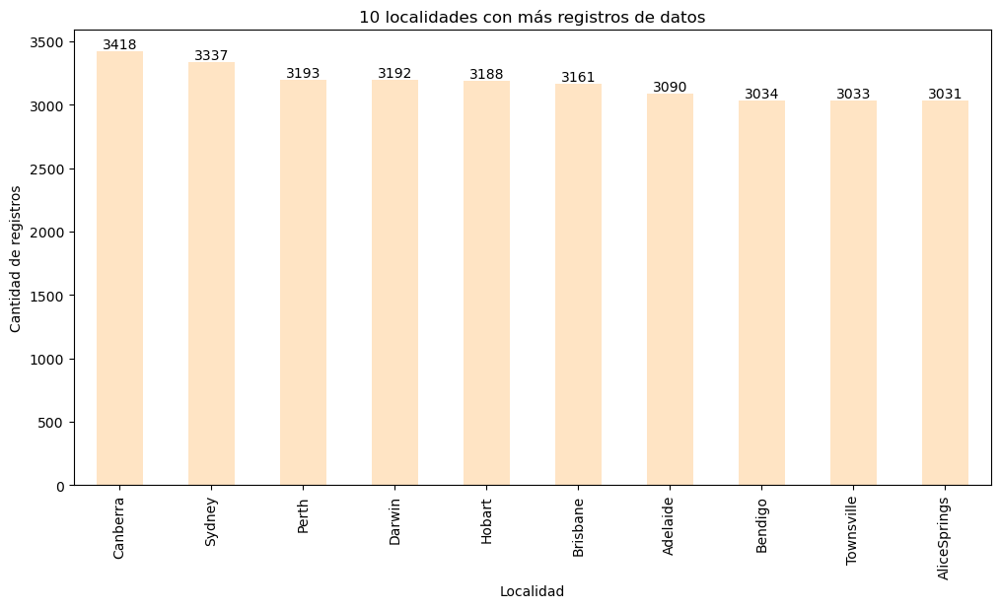

In [27]:
plt.figure(figsize=(12, 6))
ciudades_con_mas_datos = df['Location'].value_counts().head(10)

ciudades_con_mas_datos.plot(kind='bar', color='#FFE4C4')

for i, v in enumerate(ciudades_con_mas_datos):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.title('10 localidades con más registros de datos')
plt.xlabel('Localidad')
plt.ylabel('Cantidad de registros')
plt.show()

### Fechas

Iniciamos el analisis respecto a este grafico referente a la "Cantidad de Registros por año":
- Se observa una clara disminución en la cantidad de registros a medida que avanzan los años, desde más de 17,500 registros en los primeros años hasta solo 61 en el último año mostrado.
- Hay un año (posiblemente el más reciente) con solo 61 registros, lo que representa una anomalía significativa comparado con los demás.
- Los primeros 3 años muestran volúmenes muy similares (entre 17,400-17,508), seguidos por una caída gradual.
- Los años con mayor cantidad de registros (primeros años) proporcionarán resultados más confiables para este análisis. Lo que podría indicar que el año con solo 61 registros probablemente no sea representativo y podría considerarse excluirlo del análisis.



In [29]:
# transformar la columna Date a tipo datetime
df['Date'] = pd.to_datetime(df['Date'])

In [31]:
# agregar una nueva columna que contenga los años
df['year'] = df['Date'].dt.year

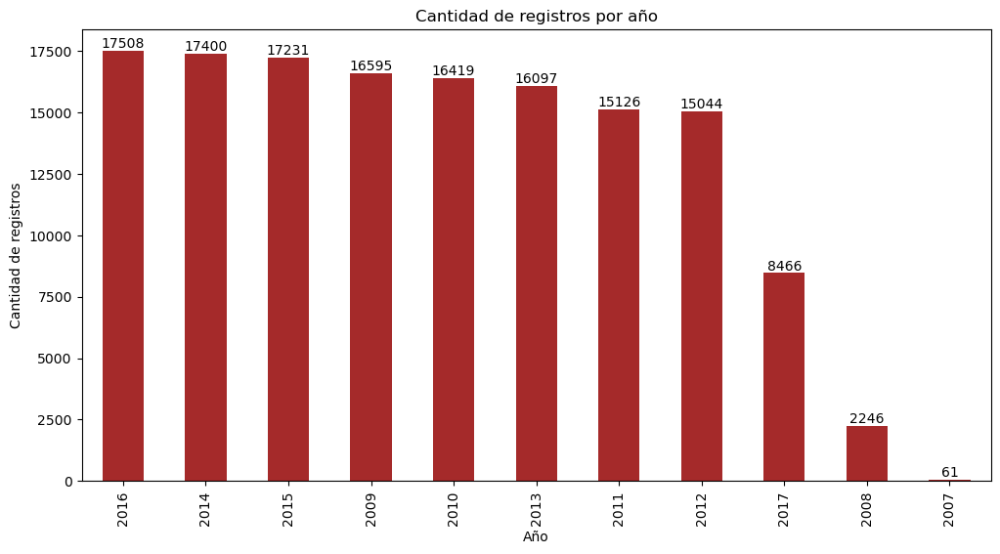

In [33]:
# graficar la cantidad de registros por año
plt.figure(figsize=(12, 6))
register_per_year = df['year'].value_counts()

register_per_year.plot(kind='bar', color='#A52A2A')

for i, v in enumerate(register_per_year):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.title('Cantidad de registros por año')
plt.xlabel('Año')
plt.ylabel('Cantidad de registros')
plt.show()

A continuación, mostramos el análisis de la "Cantidad de registros por meses":

- Mayo (13,055) y marzo (13,036) son los meses con más registros, mientras febrero (10,525) tiene la menor recolección.
- La distribución no sigue una tendencia estacional esperada (verano vs. invierno austral), lo que indica que la recolección de datos podría estar influenciada por factores externos
- La disparidad en los registros exige validar la consistencia de los datos por mes y considerar estrategias de balanceo para evitar sesgos en modelos predictivos, especialmente si se analizan fenómenos estacionales.

In [35]:
# agregar una nueva columna que contenga los meses y el nombre del mes
df['month'] = df['Date'].dt.month
df['month_name'] = df['Date'].dt.month_name()

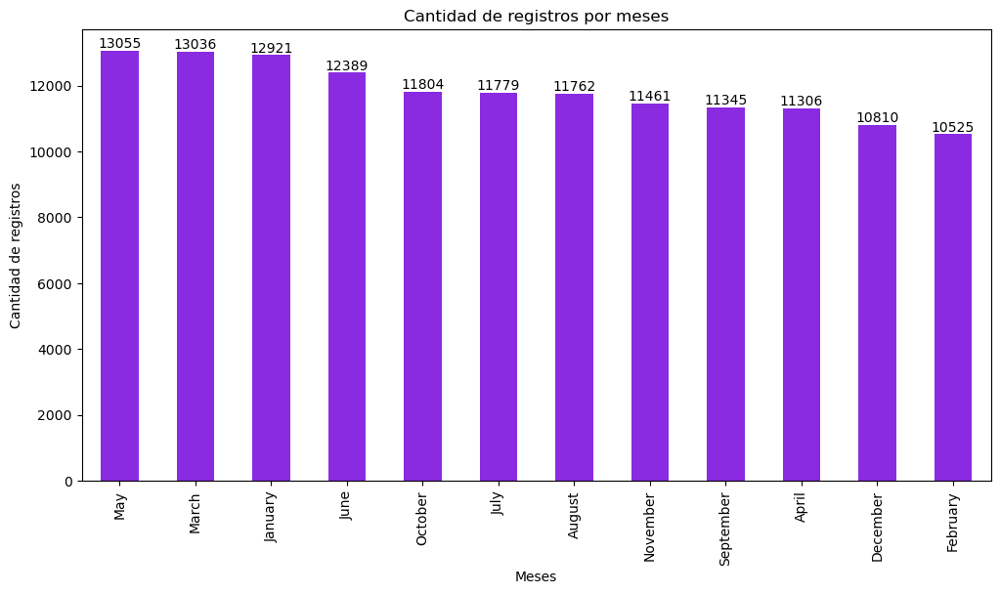

In [37]:
# graficar la cantidad de registros por meses
plt.figure(figsize=(12, 6))
register_per_month = df['month_name'].value_counts()

register_per_month.plot(kind='bar', color='#8A2BE2')

for i, v in enumerate(register_per_month):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.title('Cantidad de registros por meses')
plt.xlabel('Meses')
plt.ylabel('Cantidad de registros')
plt.show()

### Estación del año

En este apartado encontraremos el desglose de gráficos correspondientes a la estacion del año.

In [39]:
def estaciones(mes):
  if mes in [12, 1, 2]:
    return 'Verano'
  elif mes in [3, 4, 5]:
    return 'Otoño'
  elif mes in [6, 7, 8]:
    return 'Invierno'
  else:
    return 'Primavera'

df['Estacion'] = df['month'].apply(estaciones)
df['Estacion'].value_counts()

Estacion
Otoño        37397
Invierno     35930
Primavera    34610
Verano       34256
Name: count, dtype: int64

A continuación, se muestra el análisis del grafico "Promedio de T° maxima por año y estacion":

- Tiene consistentemente el promedio de temperatura máxima más alto entre todas las estaciones, con una tendencia ligeramente creciente con el tiempo.


In [41]:
estacion_year_temp = df.groupby(['Estacion', 'year'])['MaxTemp'].mean().reset_index()

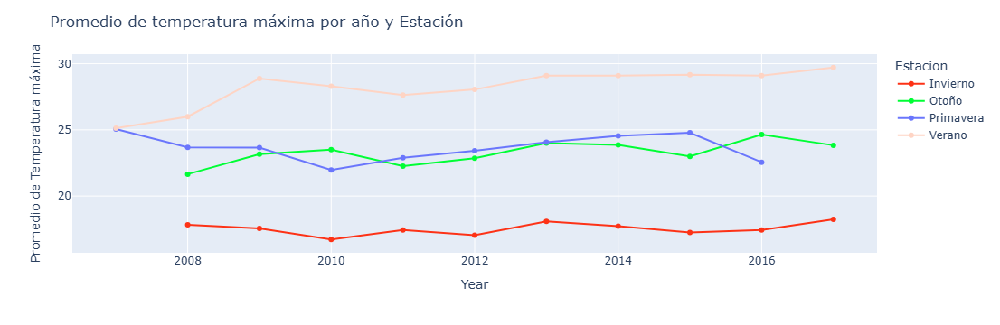

In [43]:
fig = px.line(estacion_year_temp, x='year', y = "MaxTemp", color = "Estacion", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de temperatura máxima por año y Estación",
    xaxis_title="Year",
    yaxis_title="Promedio de Temperatura máxima")
fig.show()

A continuación, mostramos el analisis del grafico "Promedio de lluvia por año y estación":
- Los valores de lluvia presentan rangos entre 0.5 y 2.5, lo que sugiere diferencias significativas entre estaciones o años
- El valor de 2.5 destaca como posible máximo, lo que podría asociarse a eventos de lluvia intensa, monzones o influencias geográficas

In [45]:
estacion_year_rain = df.groupby(['Estacion', 'year'])['Rainfall'].mean().reset_index()

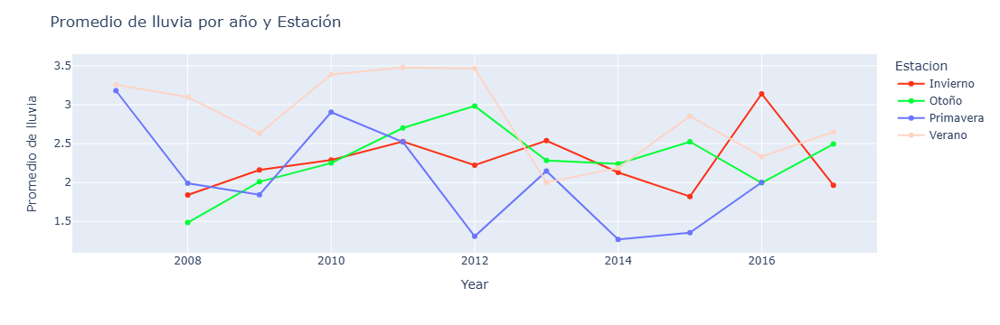

In [47]:
fig = px.line(estacion_year_rain, x='year', y = "Rainfall", color = "Estacion", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de lluvia por año y Estación",
    xaxis_title="Year",
    yaxis_title="Promedio de lluvia")
fig.show()

### Dirección del viento

A continuación, se pressenta el análisis del Gráfico "Dirección del Viento":

- Los vientos más frecuentes provienen del sureste (SE) y este (E), con más de 8,000 registros cada uno.
- Las direcciones menos comunes son noreste (NE) y noroeste (NWV), con menos de 2,000 registros.
- Existe una clara asimetría en la distribución, mostrando preferencia por ciertas orientaciones.
- Podría relacionarse con fenómenos locales como brisas marinas o sistemas de presión recurrentes.



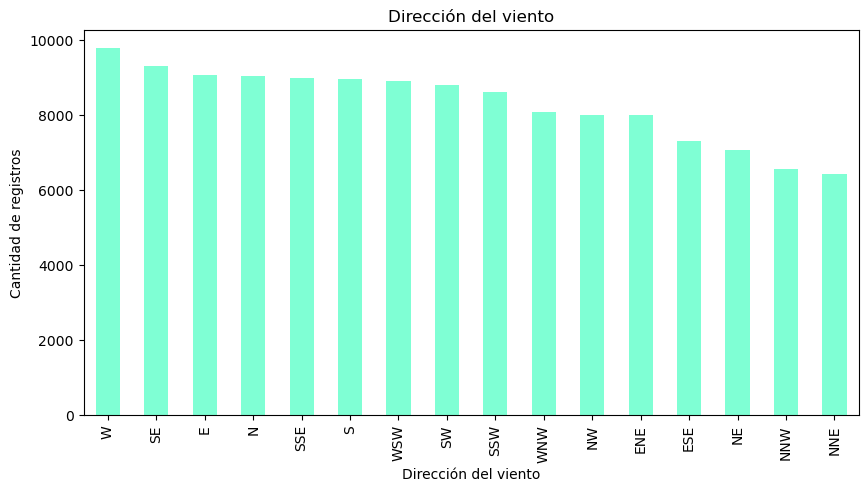

In [49]:
plt.figure(figsize=(10, 5))
df['WindGustDir'].value_counts().plot(kind='bar', color='aquamarine')
plt.title('Dirección del viento')
plt.xlabel('Dirección del viento')
plt.ylabel('Cantidad de registros')
plt.show()

A continuación, exponemos al inferencias del grafico "Dirección del viento 9am" a partir del análisis respectivo:

- Las direcciones SE (Sureste) y E (Este) son las más frecuentes, superando claramente al resto. Esto sugiere un patrón de vientos matutinos recurrentes desde el cuadrante este-sureste.
- Vientos del Noroeste (NWV) y Oeste (W) son los menos registrados, indicando que son direcciones atípicas a esta hora del día.
- La casi ausencia de vientos del oeste (W, SW) sugiere que estos son más frecuentes en otros horarios o bajo condiciones específicas.

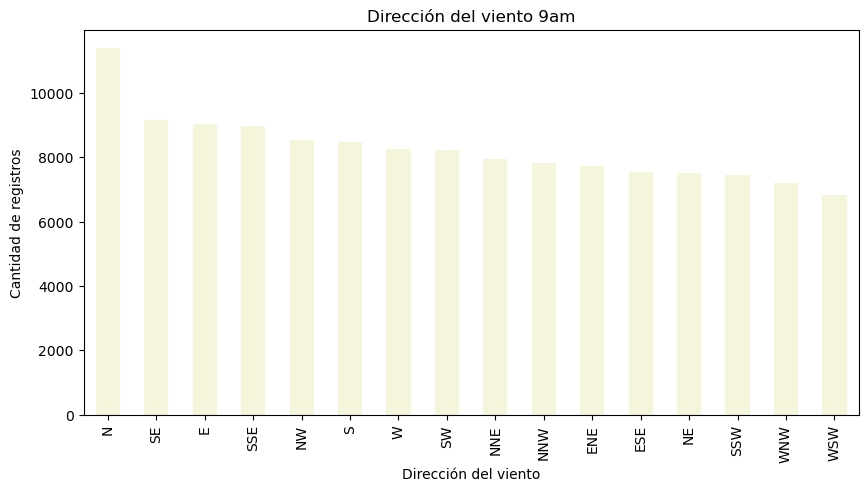

In [51]:
plt.figure(figsize=(10, 5))
df['WindDir9am'].value_counts().plot(kind='bar', color='#F5F5DC')
plt.title('Dirección del viento 9am')
plt.xlabel('Dirección del viento')
plt.ylabel('Cantidad de registros')
plt.show()

A continuación, exponemos al inferencias del grafico "Dirección del viento 3pm" a partir del análisis respectivo:
- Mientras en la mañana dominaban los vientos del SE/E, por la tarde el SE mantiene frecuencia, pero aparece con fuerza el Oeste (W) y Suroeste (SW).
- Las direcciones menos comunes (NWV, NME) son casi inexistentes, similar a lo observado a las 9am.
- La persistencia del SE en ambos horarios indica vientos dominantes de gran escala.

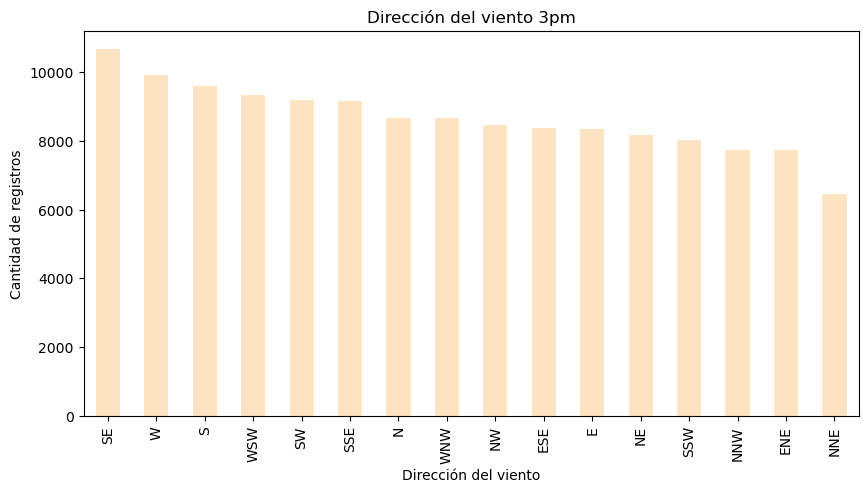

In [53]:
plt.figure(figsize=(10, 5))
df['WindDir3pm'].value_counts().plot(kind='bar', color='#FFE4C4')
plt.title('Dirección del viento 3pm')
plt.xlabel('Dirección del viento')
plt.ylabel('Cantidad de registros')
plt.show()

### Pronostico de lluvia

Ahora, exponemos el analisis del gráfico "Pronóstico de lluvia hoy":
- El gráfico muestra una comparación entre días con lluvia ("Yes") y sin lluvia ("No"), aunque los valores exactos no son visibles.
- Se aprecia una clara diferencia en la altura de las barras, lo que sugiere que los días sin lluvia son mucho más frecuentes que los días con lluvia.
- La gran diferencia entre ambas categorías indica que el conjunto de datos podría estar desbalanceado

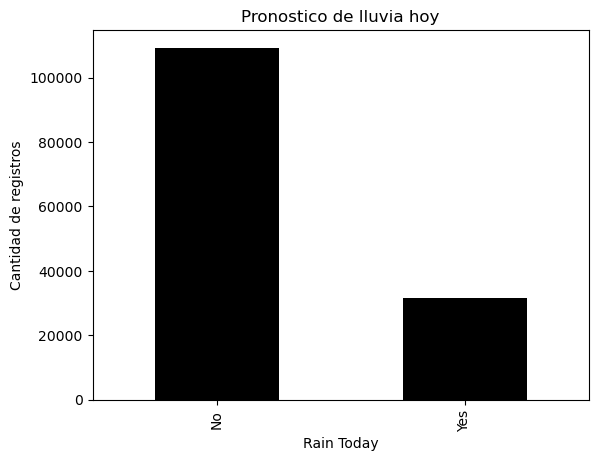

In [55]:
df['RainToday'].value_counts().plot(kind='bar', color='#000000')
plt.title('Pronostico de lluvia hoy')
plt.xlabel('Rain Today')
plt.ylabel('Cantidad de registros')
plt.show()

De acuerdo al Grafico de "Pronóstico de lluvia mañana", se presenta el siguiente análisis:

- Similar al gráfico de "RainToday", se observa una marcada diferencia entre días con lluvia y sin lluvia al día siguiente.
- Los días sin lluvia son significativamente más frecuentes que los días con lluvia.
- Esto refleja el clima predominantemente seco de Australia, donde los días sin precipitaciones son la norma.

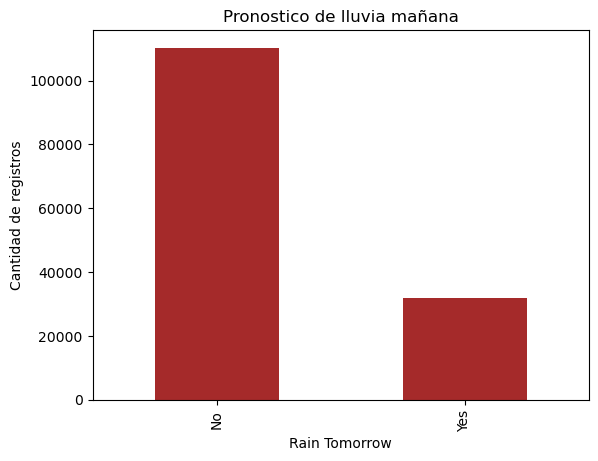

In [57]:
df['RainTomorrow'].value_counts().plot(kind='bar', color='#A52A2A')
plt.title('Pronostico de lluvia mañana')
plt.xlabel('Rain Tomorrow')
plt.ylabel('Cantidad de registros')
plt.show()

### Categoria de nubosidad

Fracción del cielo cubierto por nubes a las 9am. Se mide en "octavos", de
manera que un valor 0 indica cielo totalmente despejado y 8, cielo totalmente
cubierto.

Análisis de "Nubosidad 9am":
- Se observa que los extremos (cielo muy despejado o muy nublado) son menos frecuentes que los valores intermedios.
- Los valores centrales parecen ser los más comunes, lo que sugiere que las mañanas típicas en Australia tienen nubosidad parcial.
- El peak más alto probablemente corresponde a condiciones de "medio nublado"

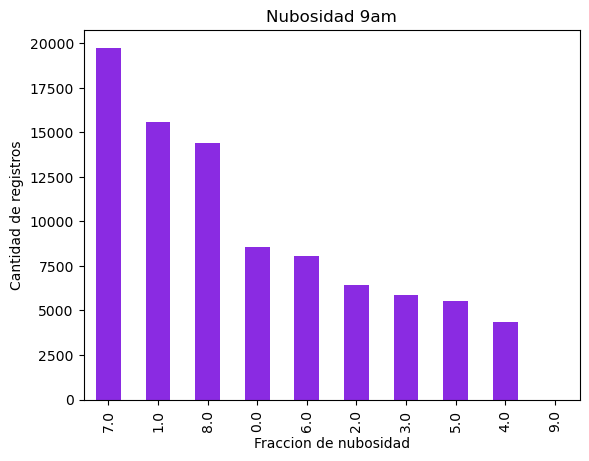

In [59]:
df['Cloud9am'].astype('category').value_counts().plot(kind='bar', color='#8A2BE2')
plt.title('Nubosidad 9am')
plt.xlabel('Fraccion de nubosidad')
plt.ylabel('Cantidad de registros')
plt.show()

Análisis de "Nubosidad 3pm":
- Los valores extremos 7.0 y 1.0 son los más frecuentes, lo que indica que por la tarde predominan condiciones muy nubladas o casi despejadas.
- La presencia de 9.0 sugiere un posible error en los datos.
- Los picos en 7.0 y 8.0 podrían correlacionar con lluvias tardías, alineandose con la variable 'RainTomorrow'.

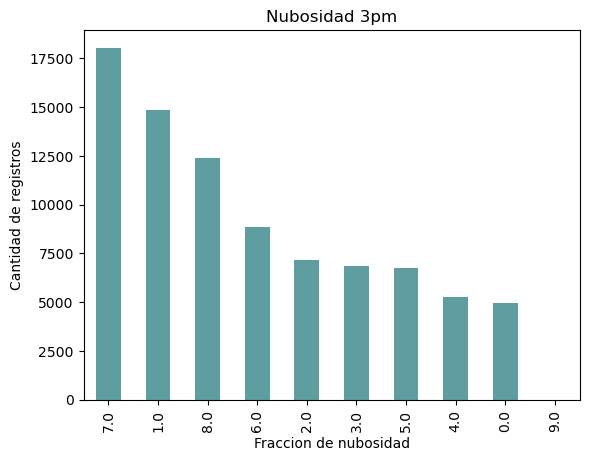

In [61]:
df['Cloud3pm'].astype('object').value_counts().plot(kind='bar', color='#5F9EA0')
plt.title('Nubosidad 3pm')
plt.xlabel('Fraccion de nubosidad')
plt.ylabel('Cantidad de registros')
plt.show()

Analisis del DataFrame que se encuentra a continuación:
- Todos los registros cumplen con que al menos uno de los valores de nubosidad (mañana o tarde) es el máximo (9.0). Esto indica cielos completamente nublados.
- Es interesante: a pesar de la nubosidad máxima, el modelo o la observación no anticipa lluvia al día siguiente.
- No hay relación evidente entre la nubosidad atípica y la lluvia (todos los casos terminaron en RainTomorrow = No).



In [63]:
cloud_9 = df[(df['Cloud3pm'] == 9.0) | (df['Cloud9am'] == 9.0)]
cloud_9

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
30097,2009-09-23,Sydney,17.0,21.8,4.4,11.2,8.0,NaN,NaN,W,...,3.0,17.3,20.9,Yes,0.0,No,2009,9,September,Primavera
45981,2012-05-27,Canberra,0.6,14.5,0.0,NaN,7.8,SW,30.0,NNW,...,NaN,4.4,14.2,No,0.0,No,2012,5,May,Otoño
104342,2012-11-02,Woomera,10.6,24.6,0.2,11.6,11.4,SSE,39.0,SE,...,9.0,14.8,23.7,No,0.0,No,2012,11,November,Primavera


## Analisis de la temperatura máxima

In [65]:
df['MaxTemp'].describe()

count    141871.000000
mean         23.226784
std           7.117618
min          -4.800000
25%          17.900000
50%          22.600000
75%          28.200000
max          48.100000
Name: MaxTemp, dtype: float64

A continuación, se presenta el análisis del gráfico "Promedio de MaxTemp por Localidad":
- El rango más bajo (17.9) sugiere ubicaciones con climas muy fríos, mientras que el rango medio (12.6 a 28.2) indica climas templados. El rango alto (29.2 a 34.9).
- La locación que lleva la temperatura máximas mas alta es "Katherine", mientras que el mas bajo, se lo lleva la localidad "MountGinini".

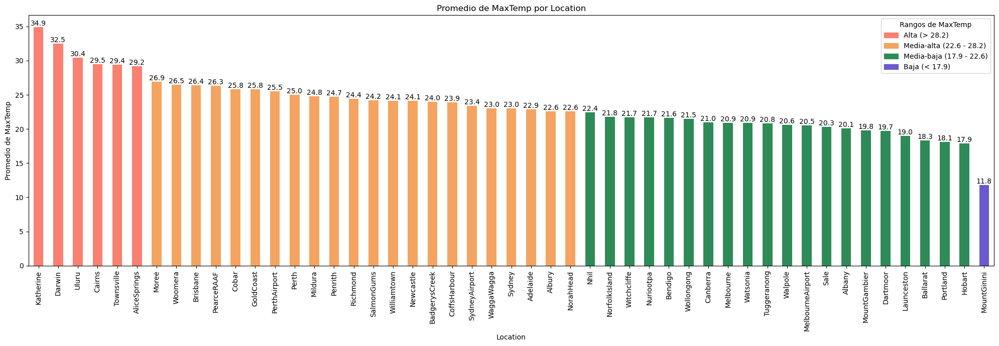

In [73]:
grafico_por_cuartiles(df, 'Location', 'MaxTemp', 20, 7)

Ahora, analizaremos el gráfico correspondiente al "Promedio de MaxTemp por Estacion":
- Tanto en invierno como en verano hay una temperatura diferencial, siendo verano la estacion con mayor tempratura (28.7), mientras que en invierno una temperatura baja (17.4).

- El segundo conjunto sugiere transiciones masa templadas, alcanzando los 23.5 grados tanto en otoño como en primavera.

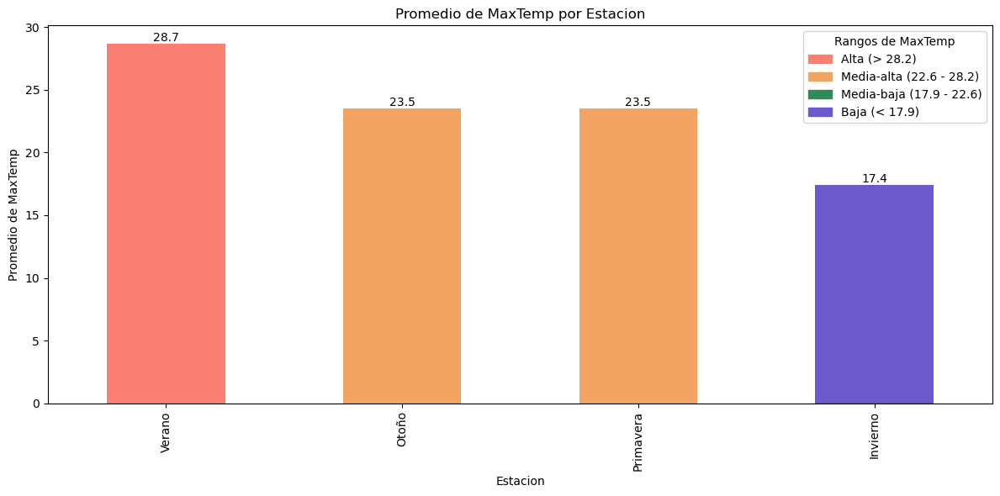

In [75]:
grafico_por_cuartiles(df, 'Estacion', 'MaxTemp')

Análisis del gráfico "Promedio de MaxTemp por mes":
- Enero y febrero registran las temperaturas más altas, cercanas a los 30°C, lo que sugiere que corresponden a la época de verano en esta región.

- Junio y julio presentan las temperaturas más bajas, con promedios alrededor de 18°C, lo que indicaría una temporada invernal moderada
-  Marzo, abril, septiembre, octubre, noviembre y diciembre muestran temperaturas medias-altas (20°C a 26°C), típicas de primavera y otoño.


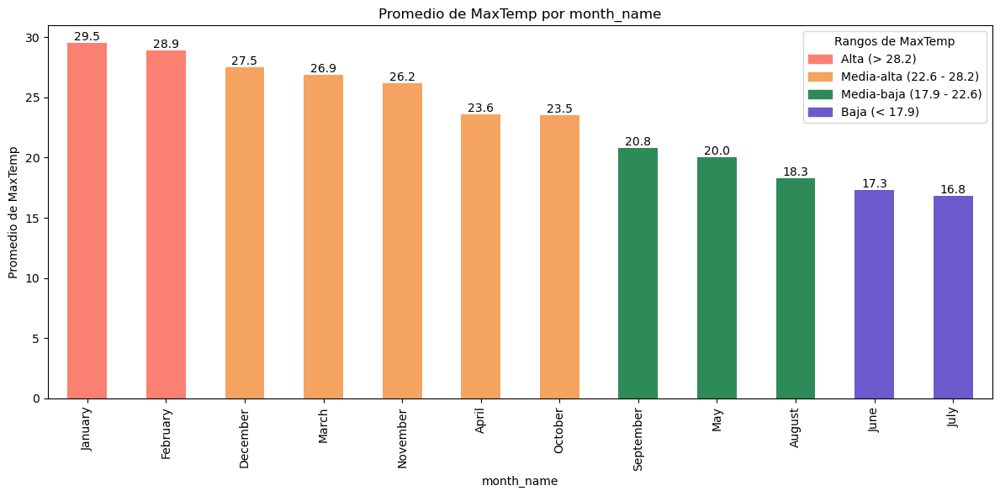

In [77]:
grafico_por_cuartiles(df, 'month_name', 'MaxTemp')

Análisis del gráfico "Promedio de MaxTemp por año":
- Las temperaturas máximas anuales se mantuvieron estables entre 22.4°C y 25.1°C desde 2007 hasta 2017.
- Ningún año superó los 28.2°C, lo que indica que no hubo años extremadamente calurosos.
- Los años más cálidos rondaron 25°C, pero no hay un aumento claro de temperatura con el tiempo.

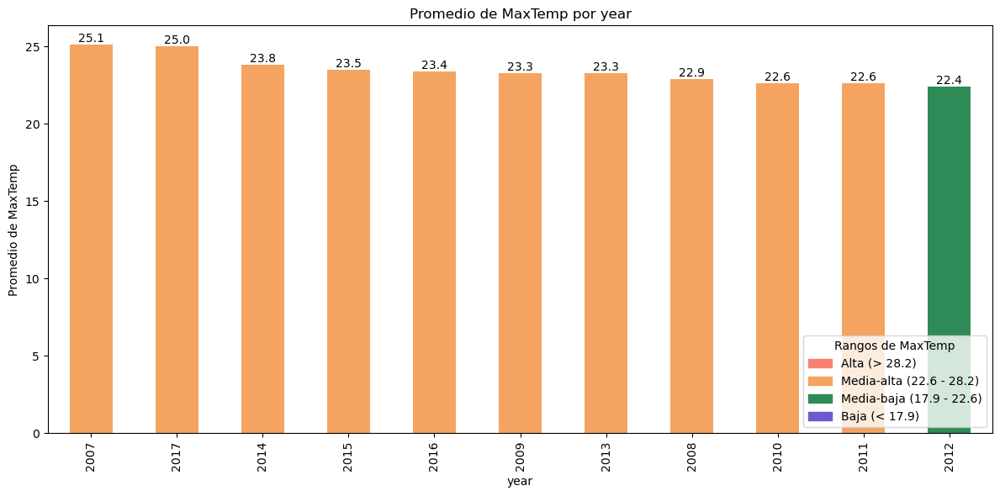

In [79]:
grafico_por_cuartiles(df, 'year', 'MaxTemp', loc='lower right')

El año 2007 es el más caluroso dentro de los promedios dado que este año solo tiene registros de los meses de noviembre y diciembre. Esto puede explicar el porque se muestra como el año mas caluroso en promedio.

In [81]:
df[df['year'] == 2007]['month_name'].value_counts()

month_name
December    31
November    30
Name: count, dtype: int64

El año 2017 tambien posee menos cantidad de meses registrados. Teniendo registros solo desde enero a junio. Lo que puede ser el año mas caluroso a pesar de los meses restantes por registrar

In [83]:
df[df['year'] == 2017]['month_name'].value_counts()

month_name
May         1501
January     1492
March       1480
April       1451
February    1345
June        1197
Name: count, dtype: int64

## Analisis ciudades importantes

Ahora, continuamos con el análisis del siguiete Dataframe, que contiene Patrones Climáticos tanto en las ciudades como la estación del año, en este caso se destaca Syndey y Perth, desatacando lo siguiente:

Sydney (Verano - Febrero 2008):
- **Altas temperaturas:** Máximas entre 22.4°C y 25.7°C, mínimas alrededor de 19.5°C-21.6°C.

- **Lluvias intensas:** Días con 6.0mm a 77.4mm de precipitación (Rainfall), todos marcados como "RainToday=Yes".

Perth (Invierno - Junio 2017):
- **Temperaturas más bajas:** Máximas entre 16.8°C y 19.9°C, mínimas de 6.3°C a 13.3°C.

- **Menos lluvia:** Solo un día con 61.2mm, seguido de días secos "RainToday=No".

In [87]:
important_cities = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane','Perth', 'Adelaide', 'Canberra'])]
important_cities.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
29497,2008-02-01,Sydney,19.5,22.4,15.6,6.2,0.0,NaN,NaN,S,...,8.0,20.7,20.9,Yes,6.0,Yes,2008,2,February,Verano
29498,2008-02-02,Sydney,19.5,25.6,6.0,3.4,2.7,NaN,NaN,W,...,7.0,22.4,24.8,Yes,6.6,Yes,2008,2,February,Verano
29499,2008-02-03,Sydney,21.6,24.5,6.6,2.4,0.1,NaN,NaN,ESE,...,8.0,23.5,23.0,Yes,18.8,Yes,2008,2,February,Verano
29500,2008-02-04,Sydney,20.2,22.8,18.8,2.2,0.0,NaN,NaN,NNE,...,8.0,21.4,20.9,Yes,77.4,Yes,2008,2,February,Verano
29501,2008-02-05,Sydney,19.7,25.7,77.4,NaN,0.0,NaN,NaN,NNE,...,8.0,22.5,25.5,Yes,1.6,Yes,2008,2,February,Verano


### Temperatura por ciudad y año

Análisis del gráfico "Promedio de MaxTemp por año y ciudad":

- La temperatura más alta registrada fue 32°C (2011 y 2016), y la más baja 24°C (2010).
-  Brisbane es la ciudad con temperaturas máximas promedio más altas en general (26 y 28°C).
- Perth y Brisbane son las ciudades más cálidas y relativamente estables a lo largo de los años.
- Canberra y Melbourne suelen tener las temperaturas máximas más bajas (entre 19 y 24 °C).


In [89]:
temp_by_city = important_cities.groupby(['year', 'Location'])['MaxTemp'].mean().reset_index(name='MaxTemp_mean').round(1)

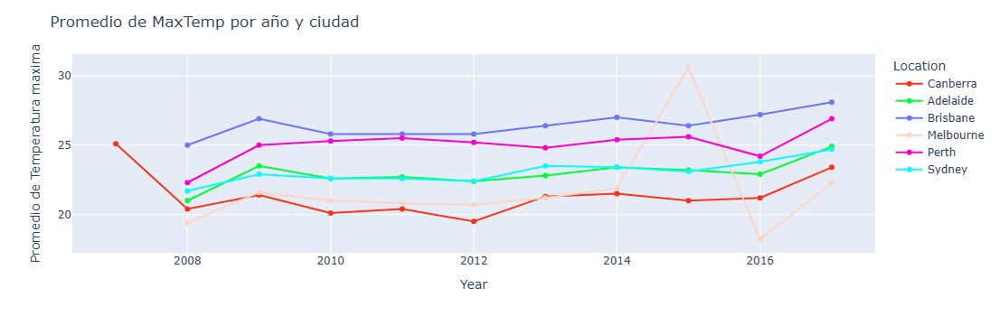

In [91]:
fig = px.line(temp_by_city, x='year', y = "MaxTemp_mean", color = "Location", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de MaxTemp por año y ciudad",
    xaxis_title="Year",
    yaxis_title="Promedio de Temperatura maxima")
fig.show()

En la ciudad de Melbourne en el año 2015 hay pocos registros. Todos ellos son del mes de enero (verano) y se registran temperaturas maximas muy altas, lo que explica el salto tan agresivo del promedio de la temperatura maxima.

In [93]:
important_cities[(important_cities['Location'] == 'Melbourne') & (important_cities['year'] == 2015)]

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
67753,2015-01-01,Melbourne,14.0,27.3,0.0,7.6,10.3,SSE,37.0,SSW,...,NaN,17.6,23.7,No,0.0,No,2015,1,January,Verano
67754,2015-01-02,Melbourne,15.9,39.4,0.0,5.2,10.4,N,54.0,NE,...,5.0,20.8,37.7,No,0.0,No,2015,1,January,Verano
67755,2015-01-03,Melbourne,20.8,38.4,0.0,23.8,8.6,NNE,85.0,N,...,NaN,30.5,37.4,No,5.4,Yes,2015,1,January,Verano
67756,2015-01-04,Melbourne,16.4,23.9,5.4,16.8,7.8,N,70.0,S,...,NaN,16.8,21.8,Yes,0.2,No,2015,1,January,Verano
67757,2015-01-05,Melbourne,15.6,23.9,0.2,6.4,10.3,SSE,35.0,SSE,...,7.0,18.4,22.4,No,0.0,No,2015,1,January,Verano


### Temperaturas mínimas por ciudad y estación del año

El análisis de la temperatura mínima promedio revela una clara variación estacional y geográfica:

- Verano es consistentemente la estación con las temperaturas mínimas más altas en todas las ciudades, siendo Brisbane la ciudad más cálida (21.25 °C), seguida por Sydney (19.73 °C) y Perth (18.03 °C).

- Invierno, como era de esperar, presenta las temperaturas mínimas más bajas, con Canberra destacándose por registrar el valor más bajo del análisis: 0.91 °C, muy por debajo del resto de las ciudades. Las temperaturas mínimas en invierno en las demás ciudades oscilan entre los 7.95 °C y 11.25 °C.

- Otoño y primavera muestran un comportamiento intermedio. En promedio, otoño es ligeramente más frío que primavera en la mayoría de las ciudades, especialmente en Canberra y Melbourne. Esto sugiere una transición más abrupta hacia el invierno que hacia el verano.

- En términos generales, Brisbane y Sydney tienen las temperaturas mínimas más altas a lo largo del año, mientras que Canberra se destaca como la ciudad más fría en todas las estaciones, particularmente en invierno y otoño.

Este análisis refleja tanto la influencia del clima subtropical de ciudades como Brisbane y Sydney, como la exposición continental de Canberra, que experimenta mayores variaciones térmicas.

In [95]:
loc_est_temp = important_cities.groupby(['Location', 'Estacion'])['MinTemp'].mean().round(2)

In [97]:
loc_est_temp = loc_est_temp.unstack()

ordered_seasons = ['Verano', 'Otoño', 'Invierno', 'Primavera']
loc_est_temp = loc_est_temp[ordered_seasons]

In [99]:
loc_est_temp

Estacion,Verano,Otoño,Invierno,Primavera
Location,,,,
Adelaide,17.34,13.26,8.07,12.18
Brisbane,21.25,17.31,11.25,16.35
Canberra,13.27,6.76,0.91,6.44
Melbourne,15.75,12.66,7.95,11.41
Perth,18.03,13.81,8.22,12.09
Sydney,19.73,15.45,9.75,14.90


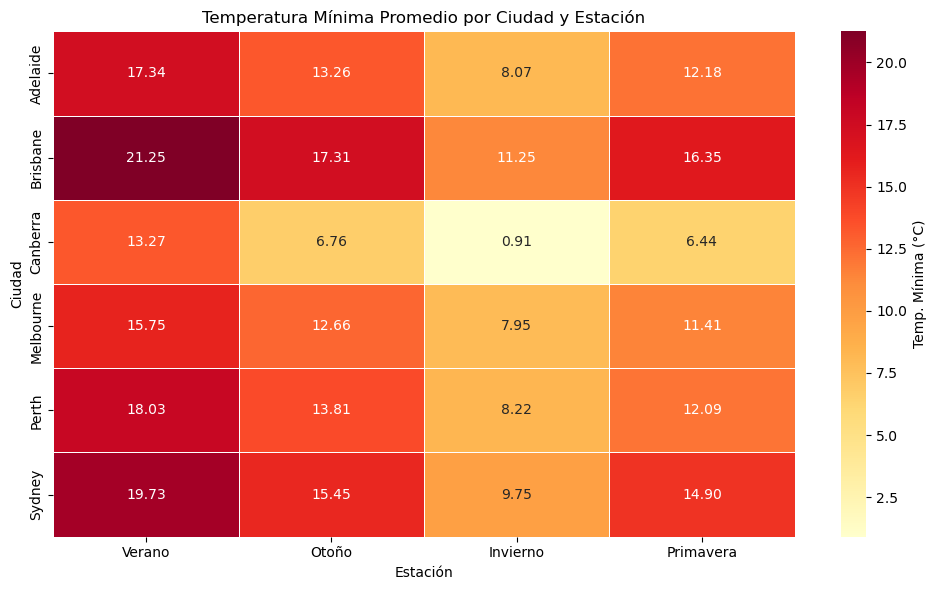

In [101]:
# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(loc_est_temp, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=.5, cbar_kws={'label': 'Temp. Mínima (°C)'})
plt.title("Temperatura Mínima Promedio por Ciudad y Estación")
plt.ylabel("Ciudad")
plt.xlabel("Estación")
plt.tight_layout()
plt.show()

In [103]:
max_temp_city = important_cities.groupby(['Location', 'Estacion'])['MaxTemp'].mean().round(2)

In [105]:
max_temp_city = max_temp_city.unstack()

ordered_seasons = ['Verano', 'Otoño', 'Invierno', 'Primavera']
max_temp_city = max_temp_city[ordered_seasons]

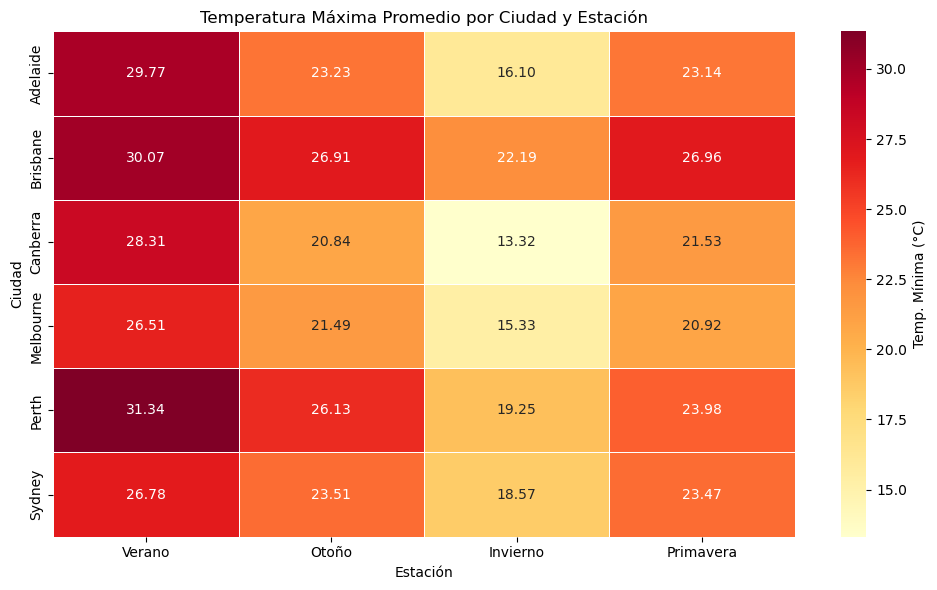

In [107]:
# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(max_temp_city, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=.5, cbar_kws={'label': 'Temp. Mínima (°C)'})
plt.title("Temperatura Máxima Promedio por Ciudad y Estación")
plt.ylabel("Ciudad")
plt.xlabel("Estación")
plt.tight_layout()
plt.show()

### Lluvia por ciudad y año

Por último, analizaremos este gráfico correspondiente al "Promedio de RainFall al año y ciudad":


- Sydney tiene los niveles de precipitación más altos de todas las ciudades.
- Brisbane también posee altos niveles de lluvia, pero alta variabilidad.
- Melbourne, Perth, Adelaide y Canberra Se mantienen relativamente estables con pequeñas fluctuaciones en sus años.


In [109]:
rain_by_city = important_cities.groupby(['year', 'Location'])['Rainfall'].mean().reset_index().round(1)

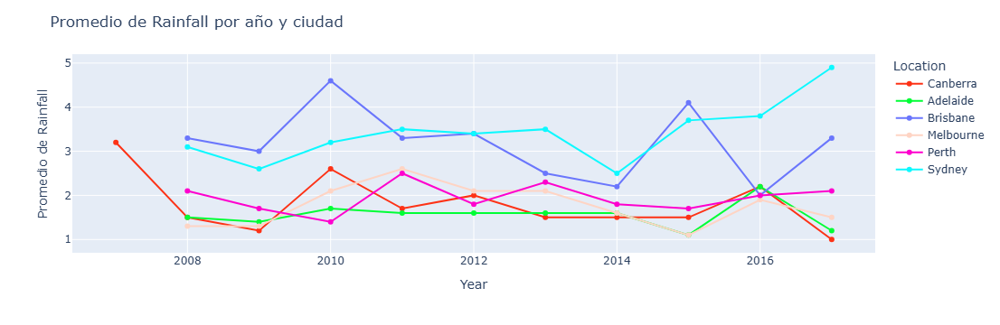

In [111]:
fig = px.line(rain_by_city, x='year', y = "Rainfall", color = "Location", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_traces(mode='markers+lines')
fig.update_layout(
    title="Promedio de Rainfall por año y ciudad",
    xaxis_title="Year",
    yaxis_title="Promedio de Rainfall")
fig.show()

### Lluvia por ciudad y estación del año

El análisis del promedio de precipitaciones por estación en seis ciudades importantes de Australia revela variaciones significativas según la ubicación geográfica y la estación del año.

En general, Brisbane se destaca por presentar el promedio de lluvias más alto en verano (5.39 mm), seguido por Sydney (3.28 mm), lo que indica una mayor concentración de lluvias estivales en la costa este. Por el contrario, ciudades como Adelaide (0.95 mm) y Perth (0.61 mm) tienen veranos considerablemente más secos.

Durante el invierno, Perth y Sydney registran los mayores niveles de precipitación (3.73 mm y 3.66 mm respectivamente), mientras que otras ciudades como Canberra y Melbourne muestran niveles más moderados (alrededor de 1.4 a 1.7 mm).

El otoño presenta altos promedios de lluvia en Sydney (3.99 mm) y Brisbane (3.52 mm), mientras que Canberra es la ciudad con menor lluvia en esa estación (1.35 mm).

En primavera, la distribución es más homogénea, aunque Melbourne y Brisbane tienen valores destacados (2.27 mm y 2.37 mm, respectivamente), en contraste con Adelaide (1.13 mm).

En resumen, se observa que:

- Brisbane y Sydney tienen los promedios más altos de lluvia en general, especialmente en verano y otoño.

- Perth tiene una marcada estacionalidad, con lluvias concentradas en invierno.

- Adelaide y Canberra son las ciudades más secas en la mayoría de las estaciones.

- La primavera tiende a ser una estación de precipitaciones moderadas y más equilibradas entre las ciudades.

Este patrón refleja la influencia del clima subtropical en la costa este y el clima mediterráneo en el suroeste del país.

In [129]:
loc_est_rain = important_cities.groupby(['Location', 'Estacion'])['Rainfall'].mean().round(2)

In [131]:
loc_est_rain = loc_est_rain.unstack()

ordered_seasons = ['Verano', 'Otoño', 'Invierno', 'Primavera']
loc_est_rain = loc_est_rain[ordered_seasons]

In [133]:
loc_est_rain

Estacion,Verano,Otoño,Invierno,Primavera
Location,,,,
Adelaide,0.95,1.63,2.56,1.13
Brisbane,5.39,3.52,1.60,2.37
Canberra,2.22,1.35,1.45,1.94
Melbourne,1.70,1.64,1.70,2.27
Perth,0.61,1.60,3.73,1.57
Sydney,3.28,3.99,3.66,2.31


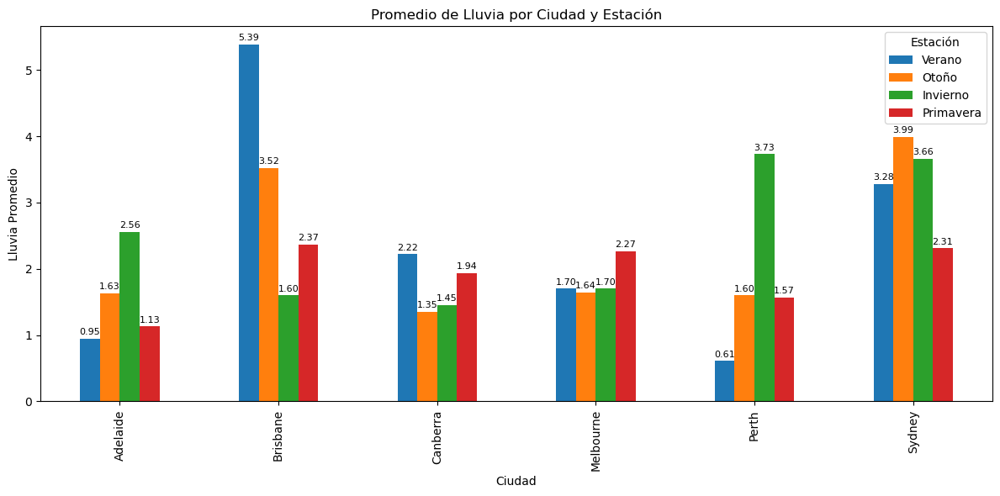

In [135]:
ax = loc_est_rain.plot(kind='bar', figsize=(12, 6))
plt.title('Promedio de Lluvia por Ciudad y Estación')
plt.xlabel('Ciudad')
plt.ylabel('Lluvia Promedio')
plt.legend(title='Estación')
plt.tight_layout()

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=2, fontsize=8)

plt.show()

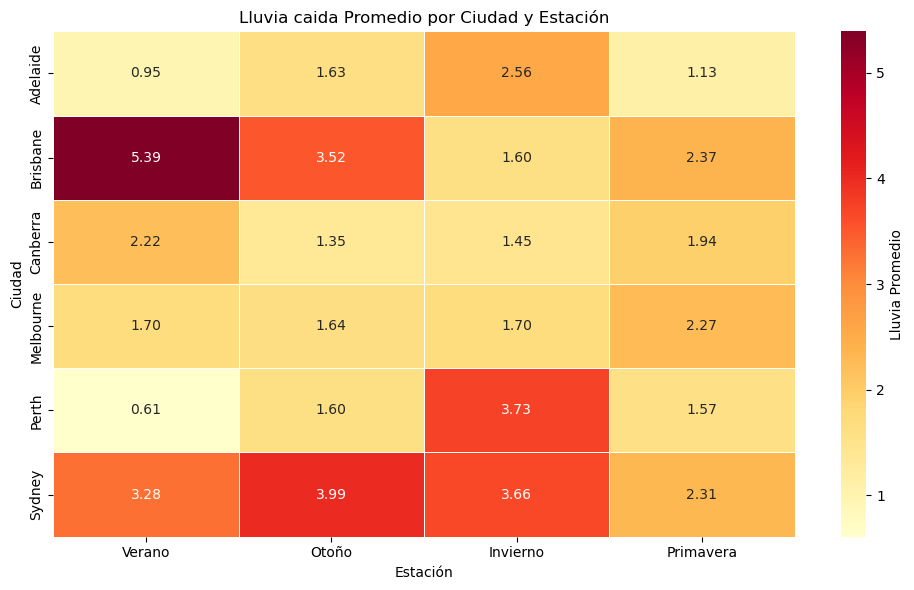

In [137]:
# Mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(loc_est_rain, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=.5, cbar_kws={'label': 'Lluvia Promedio'})
plt.title("Lluvia caida Promedio por Ciudad y Estación")
plt.ylabel("Ciudad")
plt.xlabel("Estación")
plt.tight_layout()
plt.show()

### Gráfico del mapa de Australia

Para finalizar el análisis de las ciudades importantes, visualizaremos un mapa de Australia mostrando las ciudades importantes, su posición gregráfica y su promedio de lluvia.

In [149]:
mapa = important_cities.groupby('Location')['Rainfall'].mean().round(2).reset_index()

In [151]:
mapa

,Location,Rainfall
0,Adelaide,1.57
1,Brisbane,3.16
2,Canberra,1.74
3,Melbourne,1.84
4,Perth,1.91
5,Sydney,3.33


In [153]:
# Coordenadas aproximadas por ciudad
coords = {
    'Adelaide': (-34.9285, 138.6007),
    'Brisbane': (-27.4698, 153.0251),
    'Canberra': (-35.2809, 149.1300),
    'Melbourne': (-37.8136, 144.9631),
    'Perth': (-31.9505, 115.8605),
    'Sydney': (-33.8688, 151.2093)
}

# Agregar columnas de latitud y longitud
mapa['Latitude'] = mapa['Location'].map(lambda x: coords[x][0])
mapa['Longitude'] = mapa['Location'].map(lambda x: coords[x][1])

In [155]:
mapa

,Location,Rainfall,Latitude,Longitude
0,Adelaide,1.57,-34.9285,138.6007
1,Brisbane,3.16,-27.4698,153.0251
2,Canberra,1.74,-35.2809,149.1300
3,Melbourne,1.84,-37.8136,144.9631
4,Perth,1.91,-31.9505,115.8605
5,Sydney,3.33,-33.8688,151.2093


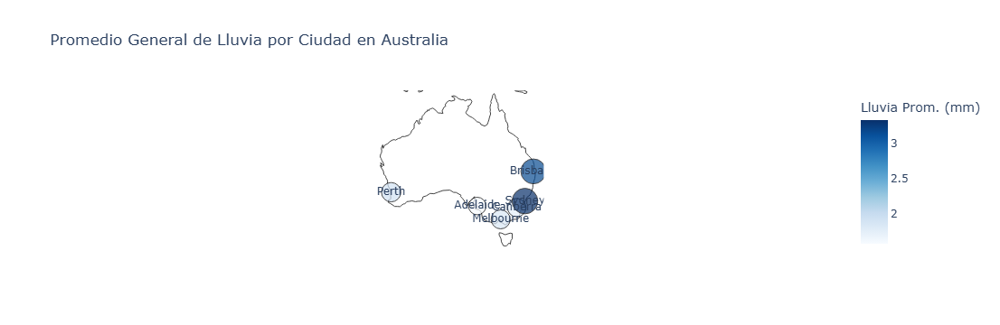

In [157]:
# Crear el mapa
fig = px.scatter_geo(
    mapa,
    lat='Latitude',
    lon='Longitude',
    text='Location',
    color='Rainfall',
    color_continuous_scale='Blues',
    size='Rainfall',
    projection='natural earth',
    title='Promedio General de Lluvia por Ciudad en Australia',
    hover_name='Location',
    hover_data={'Rainfall': ':.2f', 'Latitude': False, 'Longitude': False}
)

# Mejorar estilo del mapa
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_geos(
    lataxis_range=[-45, -10],
    lonaxis_range=[110, 155],
    visible=False,
    showcountries=True,
    showsubunits=True
)
fig.update_layout(coloraxis_colorbar=dict(title='Lluvia Prom. (mm)'))

fig.show()

## Conclusiones Fase 1

Después de haber realizado un análisis exhaustivo del dataset, y considerando tanto los gráficos como el contexto geográfico y climático del país, se pueden sacar las siguientes conclusiones respecto a las hipótesis planteadas:

- El uso de un enfoque mixto (clasificación y regresión) es completamente válido. La variable RainTomorrow es binaria, lo que justifica el uso de modelos de clasificación, mientras que RISK_MM, al ser continua, requiere modelos de regresión. Esta combinación permite abordar el problema de forma más precisa.

- La segmentación por región es acertada. Las diferencias observadas entre ciudades como Sydney (más húmeda) y Perth (más seca) demuestran que los modelos pueden comportarse de forma distinta según la zona.

- Para el modelo de regresión (RISK_MM): Se comprobó que variables como la humedad, la nubosidad y la lluvia actual son altamente influyentes. Además, factores como la evaporación y las temperaturas extremas afectan directamente la precisión, especialmente en climas más secos como el de Alice Springs.

- En cuanto al modelo de clasificación (RainTomorrow): Este resulta más efectivo en regiones costeras y tropicales, donde los patrones de lluvia son más estables. Variables como Hum3pm, Nub3pm y RainToday demostraron ser claves. Sin embargo, en zonas áridas pueden presentarse falsos positivos, ya que la nubosidad no siempre implica lluvia.

# Fase 2: Comprendiendo los Datos

Estos proximos analisis se centran en entender cómo se relacionan entre sí las diferentes variables de nuestro dataset. El objetivo de analizar estas correlaciones es identificar qué variables están más fuertemente ligadas a nuestra variable objetivo (la lluvia del día siguiente) y también entender las relaciones entre las variables predictoras. Esta información es crucial para seleccionar las variables más relevantes para nuestros modelos y para comprender mejor la dinámica del clima en Australia.

Comenzamos esta fase con una matriz de graficos en donde cada gráfico en esta gran cuadrícula nos muestra cómo se relacionan dos variables diferentes de nuestro dataset. en esta encontramos:

* Si miramos los gráficos que comparan "MinTemp" con "MaxTemp", "Temp9am" y "Temp3pm", o "MaxTemp" con las otras temperaturas, probablemente veremos una nube de puntos que se parece bastante a una línea recta que sube. Esto confirma visualmente la fuerte relación positiva que vimos en los números. Cuando una temperatura es alta, la otra también tiende a ser alta.

* Si buscamos la fila o columna de "RainToday", los gráficos de dispersión con otras variables (como la humedad o la nubosidad) nos muestran patrones interesantes.

*  Si miramos el histograma de "Rainfall" o "RISK_MM" en la diagonal, probablemente veremos algo parecido a lo que vimos en nuestros análisis anteriores: muchas barras apiladas cerca del cero (días sin lluvia o con poca lluvia) y una cola larga que se extiende hacia valores más altos (días de mucha lluvia).

## Correlaciones

In [ ]:
sns.pairplot(df)

Analizamos tambien la matriz de correlaciones detallando las relaciones entre cada par de variables, visualizando la intensidad y dirección de las correlaciones entre las variables de nuestro dataset, permitiendo identificar patrones y relaciones rápidamente.

* Los números entre "MinTemp", "MaxTemp", "Temp9am" y "Temp3pm" son muy cercanos a 1 (0.91 entre "MinTemp" y "Temp9am", y 0.90 entre "MaxTemp" y "Temp3pm"). Esto confirma que las temperaturas en diferentes momentos del día y las temperaturas extremas del día están muy, muy conectadas. Si una sube, las otras casi seguro que también lo hacen.

* El valor (0.31) entre "RainToday" y "RainTomorrow" nos dice que si llovió hoy, hay una tendencia moderada a que también llueva mañana. No es una predicción segura, pero sí una señal a tener en cuenta.

* Las relaciones entre la presión ("Pressure9am" y "Pressure3pm") y la lluvia ("Rainfall" y "RISK_MM") son negativas pero más débiles (alrededor de -0.2). Esto sugiere una ligera tendencia a que cuando la presión es más baja, haya más lluvia, tanto la registrada como la esperada para el día siguiente. Aunque no es una regla de oro, es una pista que los modelos podrían usar.

In [ ]:
mat_corr = numerical.corr()

for i in range(mat_corr.shape[0]):
  mat_corr.iloc[i, i] = 0.0

mat_corr

Aquí tenemos un mapa de calor que nos muestra cómo se relacionan entre sí las diferentes variables de nuestro dataset! Cada cuadrito de color nos dice qué tan fuerte es la relación entre dos variables. Los colores más rojizos o anaranjados indican una relación positiva (cuando una variable sube, la otra también tiende a subir), y los colores más oscuros o azulados indican una relación negativa (cuando una variable sube, la otra tiende a bajar). Los números dentro de cada cuadrito nos dan una idea más precisa de qué tan fuerte es esa relación (más cercano a 1 o -1 es una relación más fuerte, cercano a 0 es una relación débil).

* Vemos un color rojo intenso y números cercanos a 1 entre "MinTemp", "MaxTemp", "Temp9am" y "Temp3pm". Esto tiene mucho sentido, ya que las temperaturas mínimas, máximas y las temperaturas en diferentes momentos del día tienden a ir de la mano.

* Vemos un color rojizo y números positivos entre "Cloud9am" y "Cloud3pm" (0.52). Esto indica que si hay muchas nubes por la mañana, es probable que también haya muchas nubes por la tarde.

*Vemos colores más oscuros y números negativos entre "Pressure9am" y "Rainfall" (-0.23), y también entre "Pressure3pm" y "Rainfall" (-0.17). Esto sugiere que cuando la presión atmosférica es más baja, tiende a haber más lluvia.

In [ ]:
plt.figure(figsize=(20, 15))
sns.heatmap(mat_corr, annot=True, fmt=".2f")
plt.show()

## Analisis univariable

En este apartado analizaremos 12 variables de nuestro interes, describiendo y resumiendo las caracteristicas de cada una por separado, proporcionandonos una comprension mejor de cada una y mencionando los datos mas interesantes según nuestro criterio.

Este análisis nos da un resumen de los valores que encontramos en la columna "MinTemp". Nos dice cuántos datos tenemos en total, cuántos de esos datos faltan (Nans), y luego nos muestra algunas medidas importantes para entender cómo se distribuyen esas temperaturas mínimas.

- Se registraron temperaturas mínimas por debajo de cero (-8.5 grados), lo que nos indica que en algunas zonas de Australia hace bastante frío en ciertos momentos.
- La diferencia entre la temperatura mínima más baja y la más alta es bastante grande (42.4 grados), lo que subraya la diversidad climática del país.
- La temperatura mínima promedio (12.19 grados) está bastante cerca de la mediana (12.0 grados) y el skew es bajo, lo que sugiere que la mayoría de las temperaturas mínimas se agrupan alrededor de este valor central.

In [ ]:
analisis_univariable(df, 'MinTemp')

Similar al análisis de "MinTemp", este nos da un resumen de los valores de la temperatura máxima diaria. Nos indica la cantidad total de datos, cuántos valores faltan (Nans), y luego nos presenta medidas estadísticas clave sobre cómo se distribuyen estas temperaturas máximas.

* Se registraron temperaturas máximas por debajo de cero (-4.8 grados), lo cual es sorprendente y podría indicar eventos climáticos extremos o quizás errores en los datos que habría que investigar.

* Se alcanzaron temperaturas máximas muy altas (48.1 grados), lo que refleja el calor extremo que se puede experimentar en algunas regiones de Australia.

* Aunque la distribución es aproximadamente simétrica, el ligero sesgo positivo indica que hay más días con temperaturas máximas ligeramente por encima del promedio que significativamente por debajo.

In [ ]:
analisis_univariable(df, 'MaxTemp')

Este resumen nos muestra cómo se distribuyen las cantidades de lluvia en nuestro dataset. Nos dice cuántos registros tenemos, cuántos valores faltan (Nans) y nos da algunas medidas estadísticas importantes.

* La mediana y los cuartiles bajos en (0.0) y (0.8) nos dicen que la mayoría de los días tuvieron muy poca o ninguna lluvia.

* El valor máximo (371.0) revela que ocurrieron eventos de lluvia muy intensa en algunos días, lo cual es importante para entender los riesgos de inundación.

* El fuerte sesgo a la derecha nos confirma que los días de lluvia significativa son relativamente raros en comparación con los días secos o con poca lluvia.

In [ ]:
analisis_univariable(df, 'Rainfall')

Este resumen nos muestra cómo se distribuyen las velocidades del viento a las 9 de la mañana en nuestros registros. Nos dice cuántas mediciones tenemos, cuántas nos faltan (Nans), y nos da algunos números importantes para entender la fuerza del viento a esa hora.

* La mediana (13) y el tercer cuartil (19) sugieren que en la mayoría de los días el viento a las 9 am no es demasiado fuerte.

* La velocidad máxima (130) revela la ocurrencia de vientos muy intensos en algunos momentos, lo que podría estar asociado a tormentas o condiciones climáticas particulares.

* El sesgo a la derecha nos dice que son más comunes los días con velocidades de viento bajas o medias a las 9 am, y menos frecuentes los días con vientos muy fuertes.

In [ ]:
analisis_univariable(df, 'WindSpeed9am')

Este resumen nos muestra cómo se distribuyen las velocidades del viento durante la tarde en nuestros datos. Nos dice cuántas veces se midió, cuántas mediciones nos faltan (Nans), y nos da algunos números importantes para entender la fuerza del viento a esa hora.

* La mediana (19) a las 3 pm es más alta que la mediana (13) a las 9 am, lo que sugiere que el viento tiende a ser más fuerte durante la tarde.

* La velocidad máxima (87.0) es alta, pero no tan extrema como la máxima (130) registrada a las 9 am.

* Al igual que con la velocidad del viento matutina, hay más días con velocidades de viento bajas o medias por la tarde, y menos días con vientos muy fuertes.

In [ ]:
analisis_univariable(df, 'WindSpeed3pm')

Este resumen nos muestra cómo se distribuyen las mediciones de la presión atmosférica a las 9 de la mañana en nuestros registros. Nos dice cuántas mediciones tenemos, cuántas nos faltan (Nans), y nos da algunos números importantes para entender la presión a esa hora.

* El promedio (1017.65) y la mediana (1017.6)están muy cerca, lo que sugiere que la presión atmosférica a las 9 am tiende a centrarse alrededor de este valor.

* A pesar de la desviación estándar relativamente baja, el rango de presiones (60.5) muestra que ha habido variaciones importantes en la presión atmosférica matutina.

* Los valores mínimo (980.5) y máximo (1041.0) indican la ocurrencia de condiciones atmosféricas extremas, aunque poco frecuentes.

In [ ]:
analisis_univariable(df, 'Pressure9am')

Este resumen nos muestra cómo se distribuyen las mediciones de la presión atmosférica a las 3 de la tarde en nuestros registros. Nos dice cuántas mediciones tenemos, cuántas nos faltan (Nans), y nos da algunos números importantes para entender la presión a esa hora.

* El promedio (1015.26) a las 3 pm es un poco más bajo que el promedio (1017.65) a las 9 am, lo que nos dice que hay tendencia a la baja de la presión durante el día.

* Los valores mínimo y máximo de la presión vespertina son cercanos a los de la mañana, sugiriendo que los eventos de presión muy alta o muy baja ocurren en ambos momentos del día.

* Al igual que con la presión matutina, la distribución de la presión vespertina muestra una ligera tendencia hacia valores un poco más bajos que el promedio.

In [ ]:
analisis_univariable(df, 'Pressure3pm')

Este resumen nos muestra cómo se distribuyen los niveles de humedad a las 9 de la mañana en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan (Nans), y nos da algunos números importantes para entender qué tan húmedo suele estar el aire a esa hora.

* La mediana (70) y el tercer cuartil (83) sugieren que en la mayoría de los días el aire está bastante húmedo a las 9 de la mañana.

* Los valores extremos (0) (100) muestran que se han dado todas las condiciones posibles de humedad a esa hora.

* La desviación estándar (19.05) nos dice que la humedad matutina puede cambiar bastante de un día para otro.

In [ ]:
analisis_univariable(df, 'Humidity9am')

Este resumen nos muestra cómo se distribuyen los niveles de humedad durante la tarde en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan (Nans), y nos da algunos números importantes para entender qué tan húmedo suele estar el aire a esa hora.

* La mediana (52) a las 3 pm es más baja que la mediana (70) a las 9 am, lo que sugiere que el aire tiende a ser más seco durante la tarde.

* La desviación estándar (20.79) es parecida a la de la mañana (19.05), indicando que la humedad puede cambiar bastante a lo largo del día.

*  A diferencia de la mañana, la distribución de la humedad por la tarde es más simétrica, con una cantidad similar de días con niveles de humedad altos y bajos.

In [ ]:
analisis_univariable(df, 'Humidity3pm')

Este resumen nos muestra cómo se distribuyen las temperaturas a las 9 de la mañana en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan, y nos da algunos números importantes para entender qué tan frío o caluroso suele estar a esa hora.

* La mediana (16.7) sugiere que la temperatura a las 9 de la mañana suele ser agradable.

*Los valores extremos (-7.2 y 40.2) muestran que se han dado condiciones de frío intenso y calor significativo a esa hora.

* La desviación estándar (6.49) nos indica que la temperatura matutina no varía drásticamente de un día para otro.

In [ ]:
analisis_univariable(df, 'Temp9am')

Este resumen nos muestra cómo se distribuyen las temperaturas durante la tarde en nuestros registros. Nos dice cuántas veces se midió, cuántas mediciones nos faltan, y nos da algunos números importantes para entender qué tan frío o caluroso suele estar a esa hora.

* La mediana (21.1) a las 3 pm es más alta que la mediana (16.7) a las 9 am, lo que sugiere que la tarde suele ser más cálida que la mañana.

* El valor mínimo (-0.4) indica que incluso por la tarde se pueden dar temperaturas bajo cero, aunque seguramente no sean lo más común.

* La diferencia entre la temperatura más baja y la más alta (52.1) muestra que las tardes pueden ser muy frías o muy calurosas.

In [ ]:
analisis_univariable(df, 'Temp3pm')

Este resumen nos muestra cómo se distribuyen las cantidades de lluvia pronosticadas para el día siguiente en nuestros registros. Nos dice cuántas predicciones tenemos y nos da algunos números importantes para entender qué tanta lluvia se espera normalmente.

*  La mediana y los cuartiles (0.0) nos dicen que en la mayoría de los casos, no se pronostica lluvia para el día siguiente.

* La desviación estándar (8.4779) y el rango (371,0) muestran que la cantidad de lluvia que se espera para el día siguiente varía muchísimo.

* El fuerte sesgo a la derecha nos confirma que las predicciones de lluvia significativa son poco comunes en comparación con las predicciones de días secos o con poca lluvia.

In [ ]:
analisis_univariable(df, 'RISK_MM')

## Conclusiones Fase 2

Nuestros análisis nos han proporcionado una visión detallada de las variables meteorológicas en el dataset australiano, confirmando varios aspectos de nuestras hipótesis iniciales y revelando patrones interesantes:

*  Hemos confirmado visualmente y a través de las estadísticas descriptivas la naturaleza binaria de "RainTomorrow" (no mostrado directamente en los análisis de esta fase, pero implícito en la necesidad de predicción) y la naturaleza continua de "RISK_MM". Esto respalda la necesidad de un enfoque mixto de modelado (clasificación y regresión) como se planteó en la hipótesis.

* Aunque no analizamos directamente la segmentación por región en estos análisis generales, las diferencias significativas encontradas en los rangos y distribuciones de variables como la temperatura y la lluvia (en fases anteriores) sugieren que el comportamiento de estas variables puede variar considerablemente entre ubicaciones, apoyando la idea de que la precisión del modelo podría depender de la región.

* Aunque no analizamos directamente "RainTomorrow" en estos gráficos, las correlaciones observadas con "RISK_MM" (que está fuertemente ligada a la probabilidad de lluvia al día siguiente) sugieren que variables como la lluvia del día actual, la humedad y la nubosidad probablemente serán predictores importantes también para el modelo de clasificación.

# Fase 3: Preparación de Datos

En esta fase se lleva a cabo la preparación del dataset, abordando tareas clave como la limpieza de datos, el tratamiento de valores nulos y duplicados, la detección y manejo de outliers, y el escalamiento de variables numéricas. Esta etapa es fundamental para asegurar la calidad de los datos antes del modelado.

Para la preparación de los datos, abordaremos el tratamiento de outliers, valores nulos (NaNs) y el balance de clases según la ubicación geográfica (Location) y la estación del año.

## Manejo de las variables de nubosidad

Antes de comenzar limpiaremos nuestro dataset de ciertas columnas que no usaremos desde aqui en adelante. Borraremos las columnas year, month y month_name. Dejaremos solo la variable Estacion (Estación del año).

In [159]:
del df['year']
del df['month']
del df['month_name']

Luego, filtraremos los datos de nubosidad que tengan 9, dado que la nubosidad Se mide en "octavos", de
manera que un valor 0 indica cielo totalmente despejado y 8, cielo totalmente
cubierto. sacaremos los datos de nubosidad 9 del detaset, dado que son registros con nubosidad erronea.

In [161]:
df.shape

(142193, 25)

Vemos que son 3 registros que filtraremos de nuestro dataset

In [163]:
cloud_9

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,year,month,month_name,Estacion
30097,2009-09-23,Sydney,17.0,21.8,4.4,11.2,8.0,NaN,NaN,W,...,3.0,17.3,20.9,Yes,0.0,No,2009,9,September,Primavera
45981,2012-05-27,Canberra,0.6,14.5,0.0,NaN,7.8,SW,30.0,NNW,...,NaN,4.4,14.2,No,0.0,No,2012,5,May,Otoño
104342,2012-11-02,Woomera,10.6,24.6,0.2,11.6,11.4,SSE,39.0,SE,...,9.0,14.8,23.7,No,0.0,No,2012,11,November,Primavera


In [165]:
df = df[(df['Cloud3pm'] != 9.0) & (df['Cloud9am'] != 9.0)]

Verificamos que se hayan filtrado los datos erroneos, quedando con un total de 142.190 registros, eliminando los 3 registros de nubosidad erronea

In [167]:
df.shape

(142190, 25)

## Tratamientos de duplicados

Observamos que no obtenemos registros duplicados

In [169]:
duplicados = df[df.duplicated()]
print(f"Cantidad de registros duplicados: {duplicados.shape[0]}")

Cantidad de registros duplicados: 0


Exportamos el csv limpio de datos erroneos de la nubosidad y limpio de datos duplicados

In [171]:
df.to_csv('../data/data_to_preparation.csv', index=False)

## Tratamiento de OUTLIERS por Location y Estacion del año

Ahora procemos a hacer transformaciones sobre el dataset. Partiremos con el tratamiento de outliers.

El tratamiento de OUTLIERS nos permite abordar aquellas observaciones que se alejan de manera considerable del patrón general del conjunto de datos, pudiendo perjudicar la validez del análisis y los resultados posteriores.

In [173]:
df_trans = pd.read_csv('../data/data_to_preparation.csv')

In [175]:
df_trans.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RISK_MM', 'RainTomorrow', 'Estacion'],
      dtype='object')

Seleccionamos solo las variables numéricas. Dejando afuera las variables 'RISK_MM' y 'Rainfall', ya que más adelante aplicaremos discretización sobre estas variables, es decir, las categorizaremos y las trataremos como variables categóricas. Además dejaremos afuera a las variables 'Cloud9am', 'Cloud3pm' ya que son variables categóricas que ya estan transformadas por defecto con un valor entre 0 y 8.

In [177]:
lista_num = df_trans.select_dtypes(include='number').columns.to_list()
lista_num = [col for col in lista_num if col not in ['RISK_MM', 'Rainfall', 'Cloud9am', 'Cloud3pm']]
lista_num

['MinTemp',
 'MaxTemp',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm']

In [179]:
len(lista_num)

13

Ahora visualizaremos los outliers de cada variable según su respectiva Locación y estación del año. Aplicaremos el tratamiento reemplazandolos por la mediana y finalmente volveremos a graficar los outliers para observar los cambios generados.

In [181]:
def boxes_facet(x, y, h, df, titulo="", r=90):
    g = sns.catplot(
        x=x, y=y, col=h, data=df,
        kind="box", col_wrap=2, height=5, aspect=2, sharey=False
    )
    g.set_xticklabels(rotation=r)
    g.fig.subplots_adjust(top=0.9)
    g.fig.suptitle(titulo, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


In [183]:
def tratar_outliers_por_grupo(df, columna, grupo1, grupo2):
    """
    Reemplaza los outliers de una columna numérica con la mediana del grupo al que pertenecen.
    El tratamiento se realiza por combinaciones únicas de dos columnas categóricas (por ejemplo, Location y Estacion).

    Parámetros:
    - df: DataFrame original.
    - columna: Nombre de la columna numérica a tratar.
    - grupo1: Primera columna categórica para agrupar (ej. 'Location').
    - grupo2: Segunda columna categórica para agrupar (ej. 'Estacion').

    Retorna:
    - DataFrame con los outliers reemplazados por la mediana del grupo correspondiente.
    """

    df_resultado = df.copy()

    # Iterar sobre cada grupo
    for (location, estacion), grupo_df in df.groupby([grupo1, grupo2]):
        Q1 = grupo_df[columna].quantile(0.25)
        Q3 = grupo_df[columna].quantile(0.75)
        IQR = Q3 - Q1
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        mediana = grupo_df[columna].median()

        # Identificar índices de outliers
        mask_outliers = (df_resultado[grupo1] == location) & \
                        (df_resultado[grupo2] == estacion) & \
                        ((df_resultado[columna] < limite_inferior) | (df_resultado[columna] > limite_superior))

        # Reemplazar outliers con la mediana
        df_resultado.loc[mask_outliers, columna] = mediana

    return df_resultado


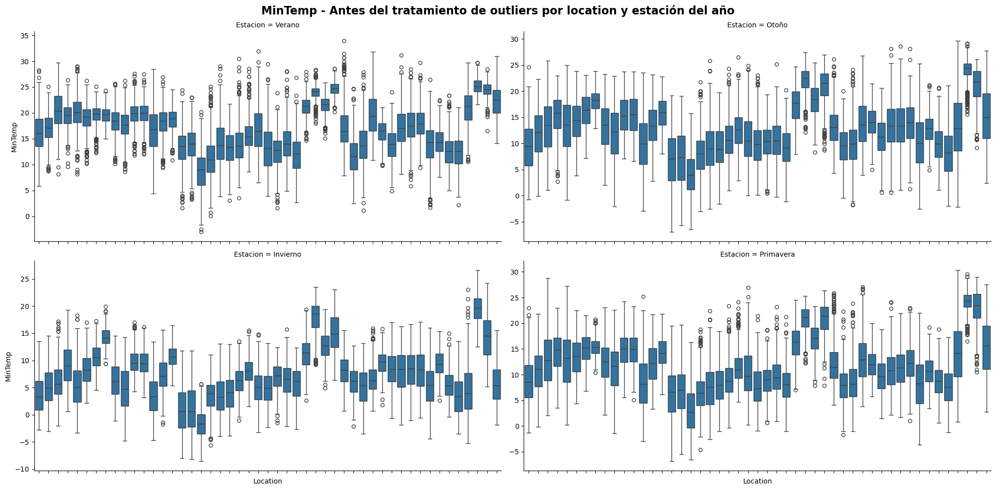

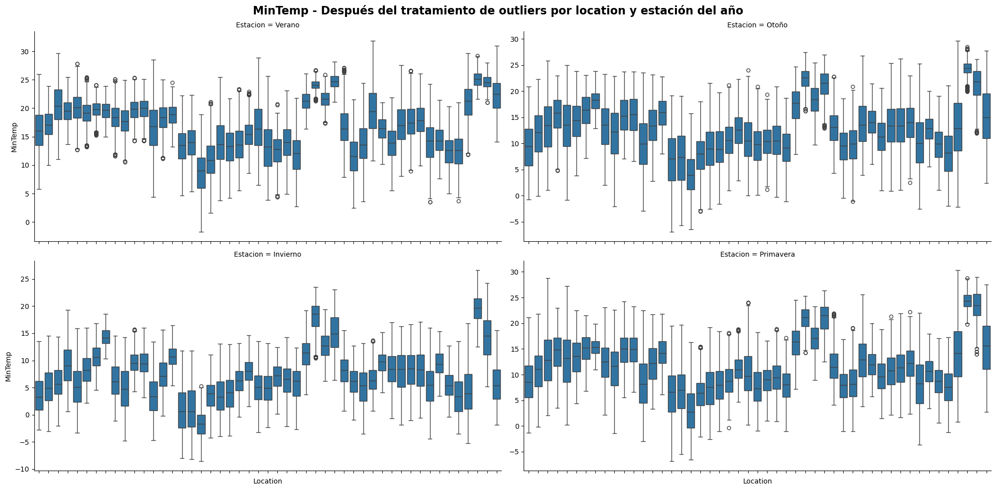

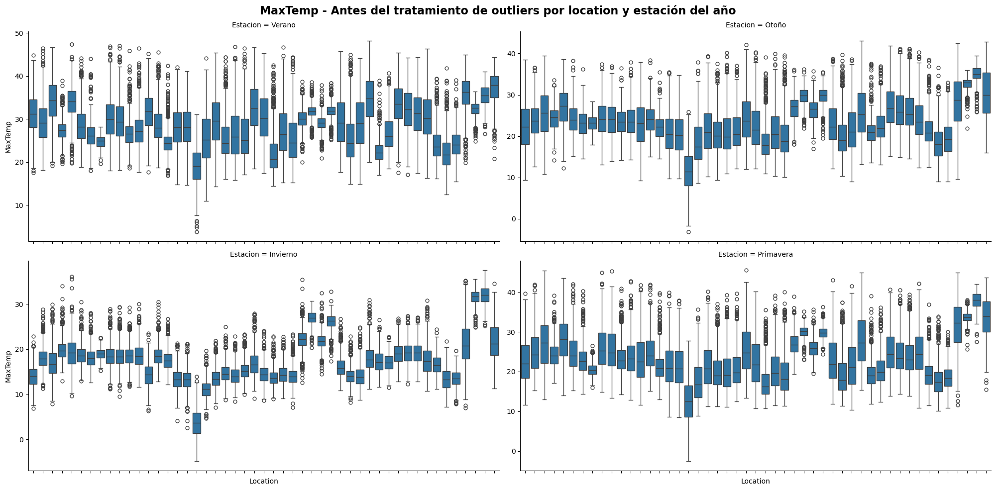

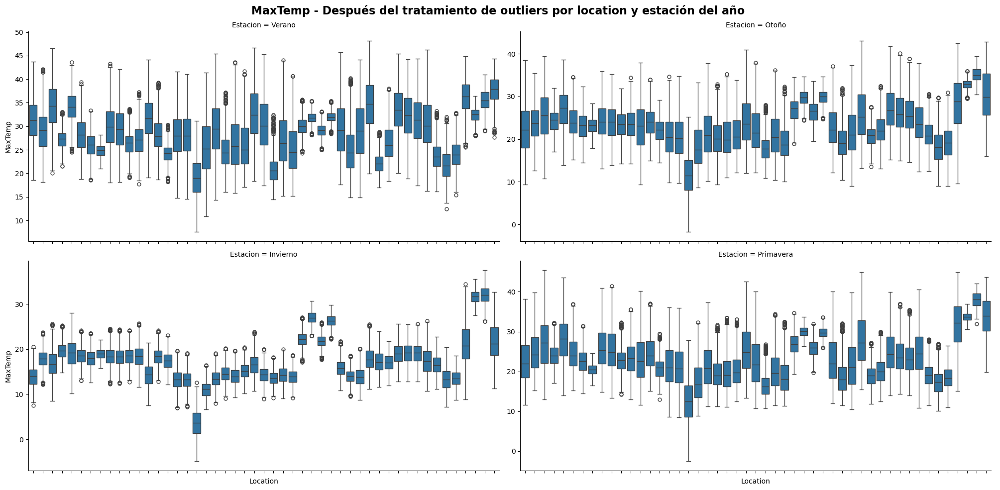

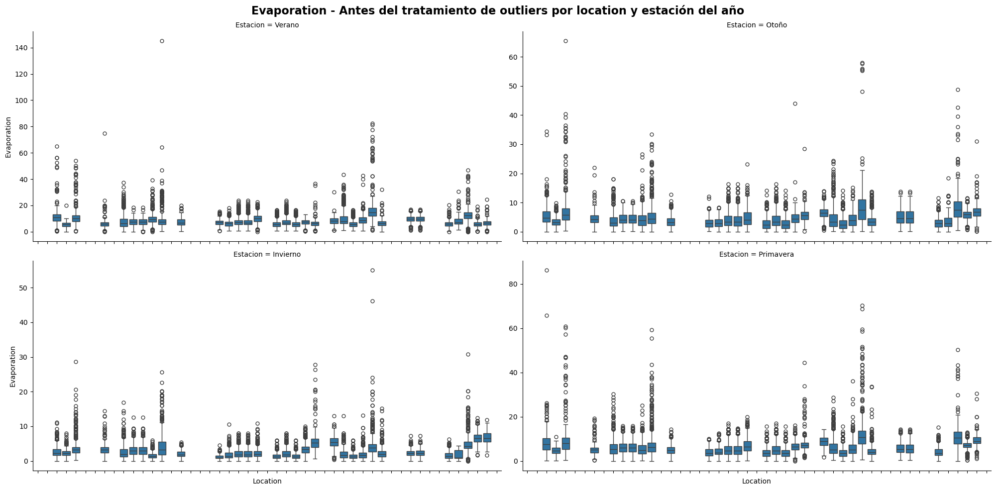

...

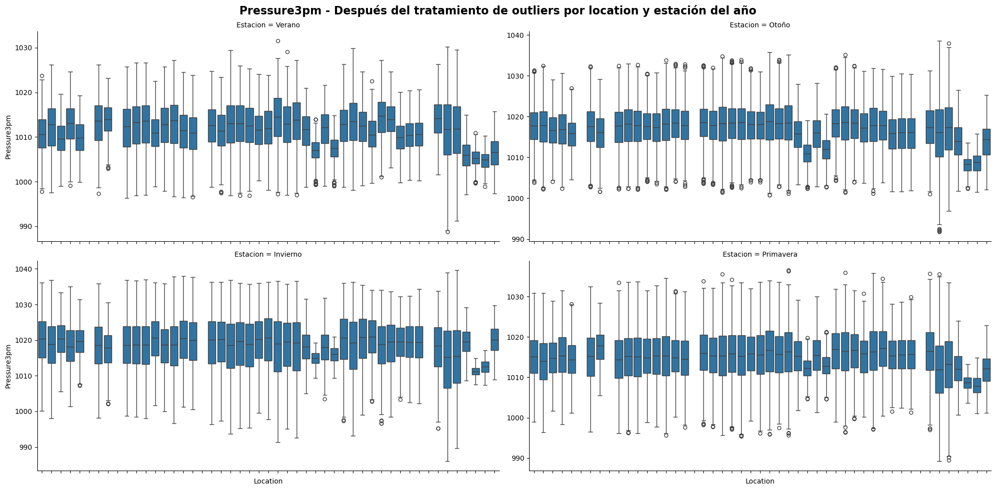

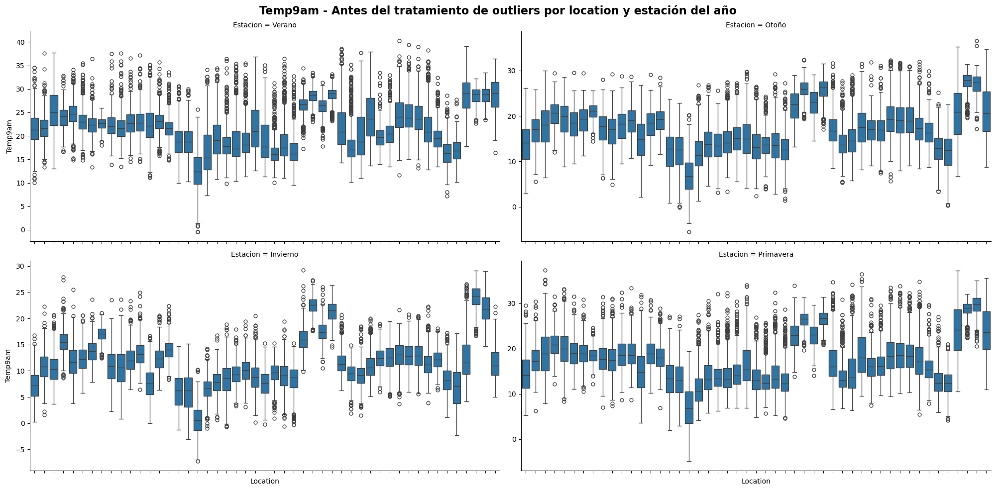

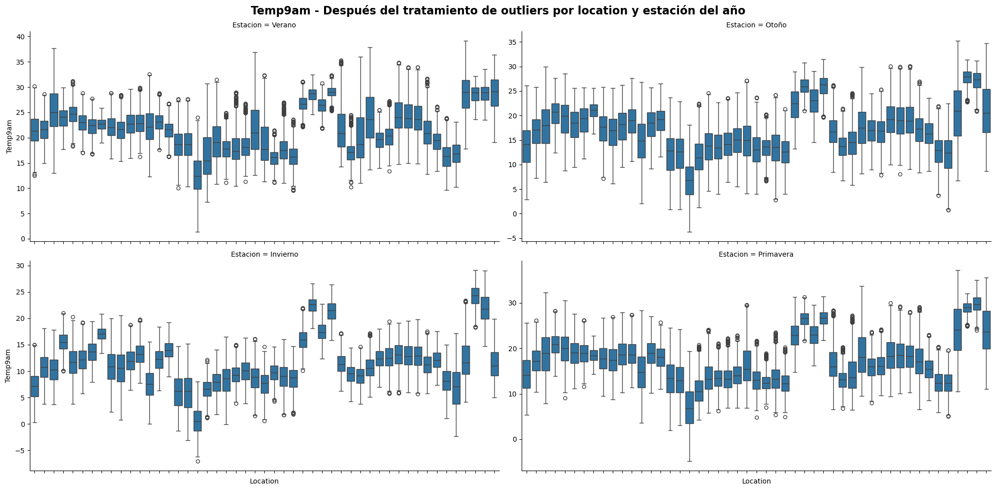

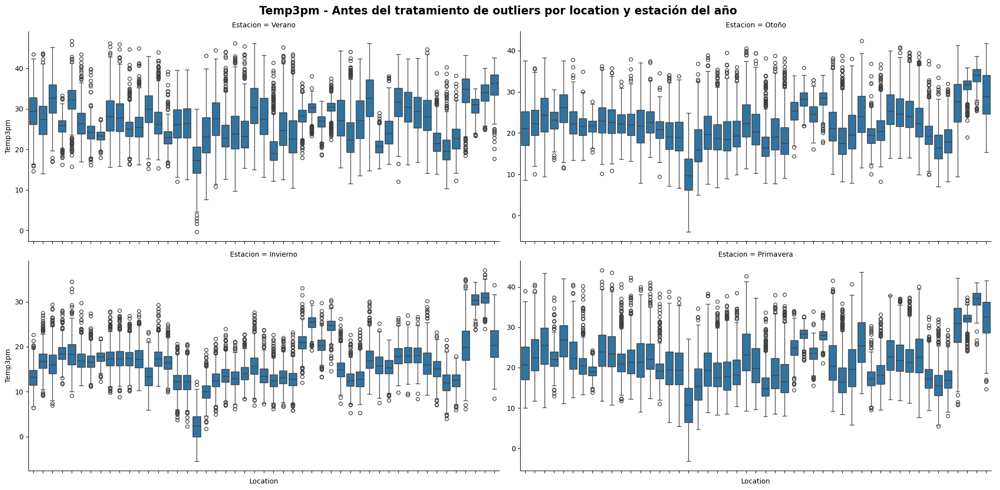

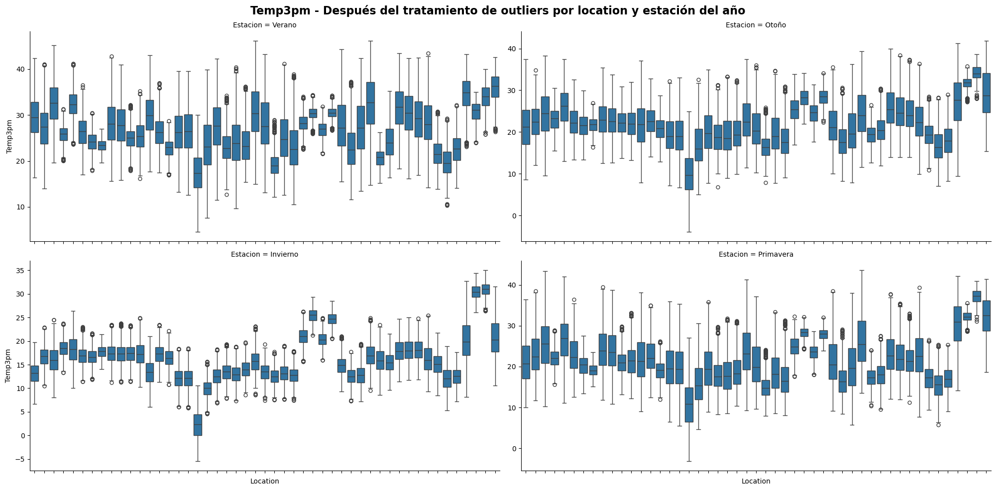

In [185]:
# Creamos una copia para no modificar el original
df_tratado = df_trans.copy()

for col in lista_num:
    # Mostramos los outliers antes de ser tratados
    boxes_facet("Location", col, "Estacion", df=df_tratado, titulo=f"{col} - Antes del tratamiento de outliers por location y estación del año")

    # Tratamos los datos Outliers por zona y Estacion
    df_tratado = tratar_outliers_por_grupo(df_tratado, col, 'Location', 'Estacion')

    # Mostramos los outliers después de ser tratados
    boxes_facet("Location", col, "Estacion", df=df_tratado, titulo=f"{col} - Después del tratamiento de outliers por location y estación del año")


Finalmente hacemos una visualización general del Tratamiento de OUTLIERS.

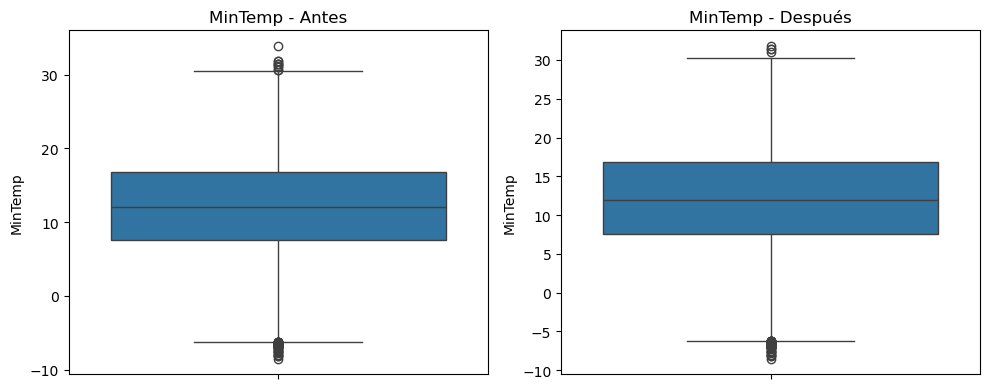

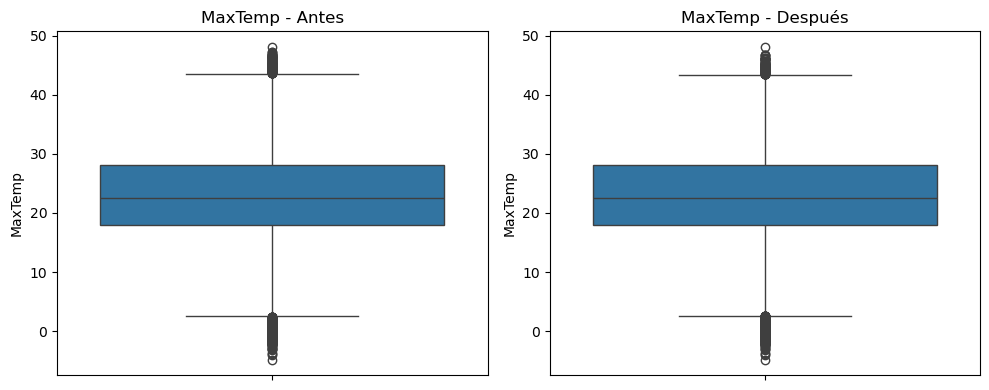

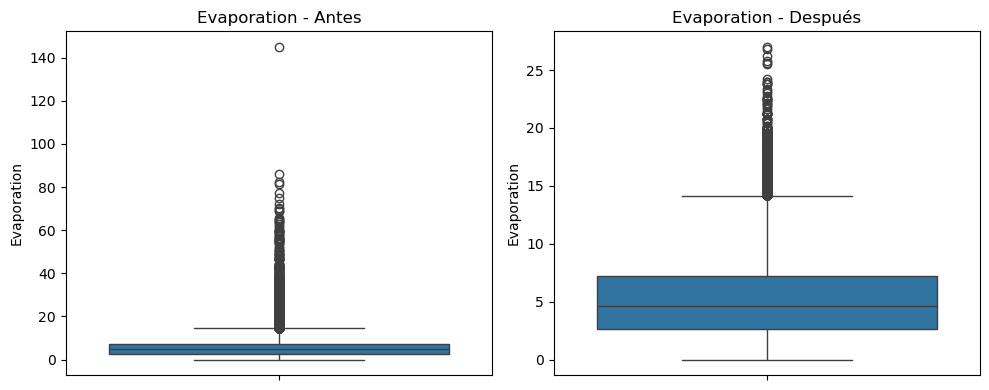

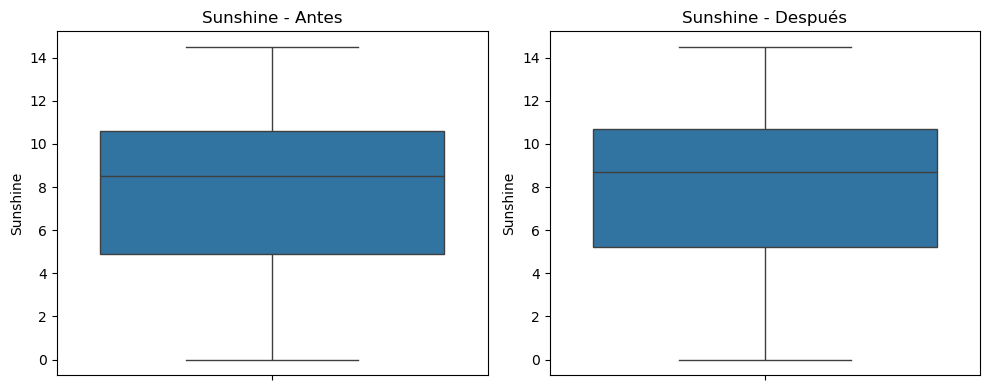

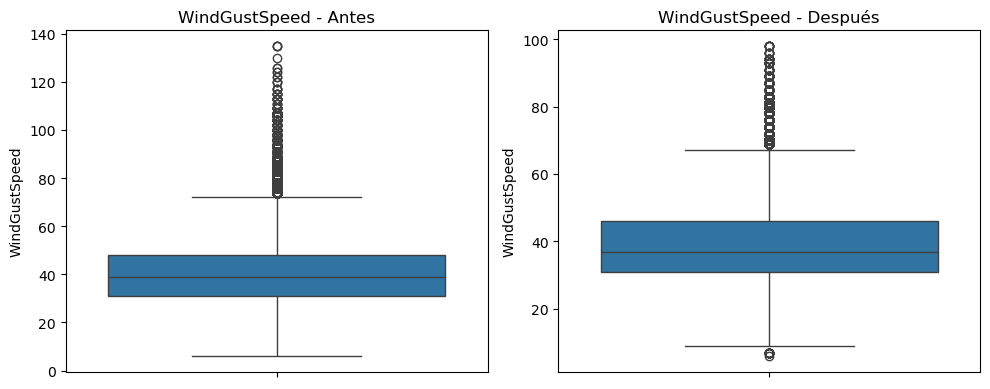

...

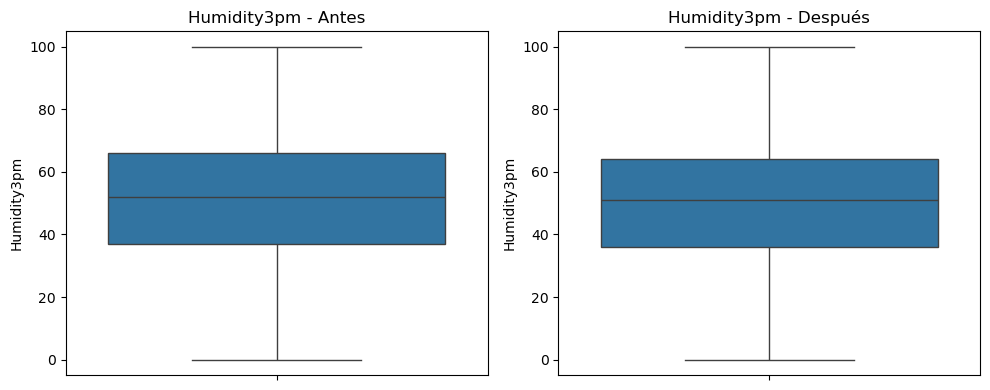

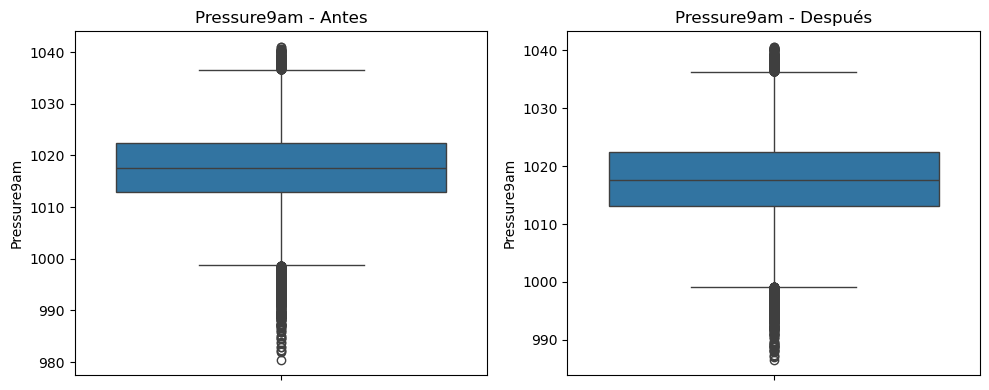

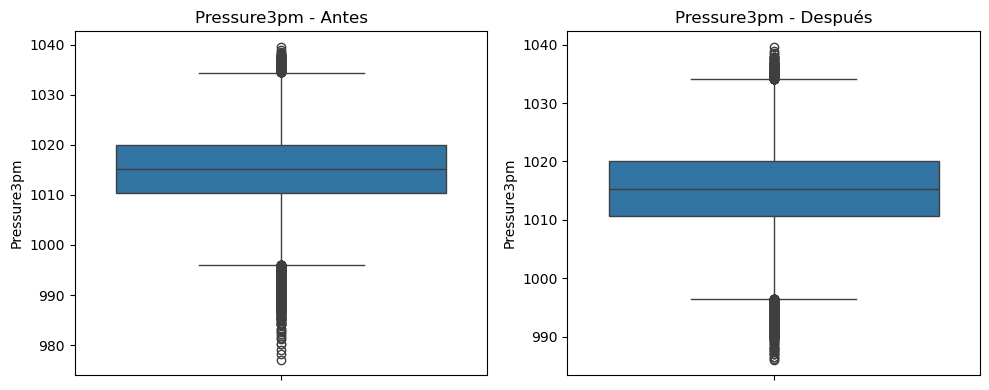

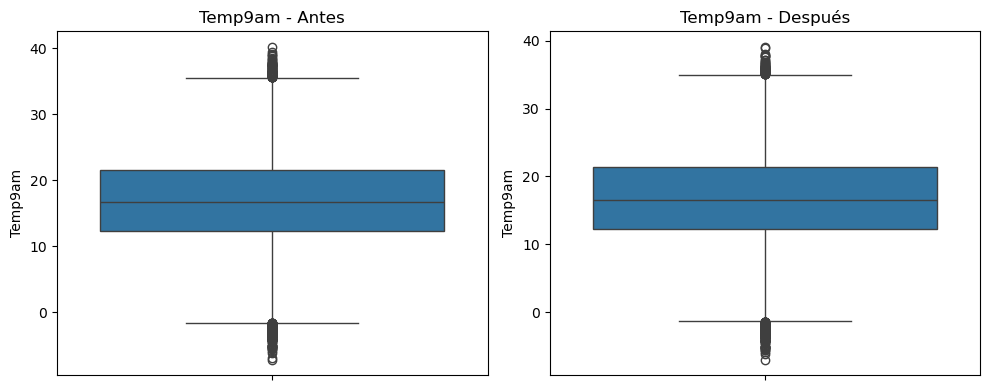

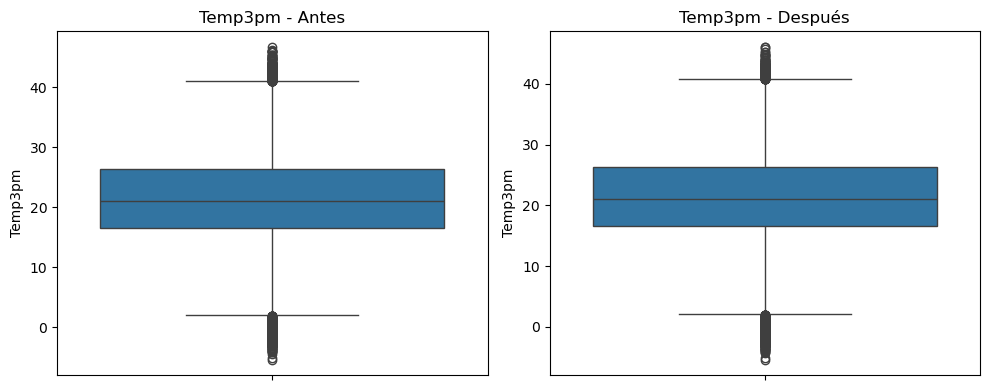

In [187]:
for col in lista_num:
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.boxplot(y=df[col])
    plt.title(f'{col} - Antes')

    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_tratado[col])
    plt.title(f'{col} - Después')

    plt.tight_layout()
    plt.show()


Finalmente exportamos nuestro dataset tratado de los outliers según locación y estacion del año

In [189]:
df_tratado.to_csv('../data/data_outliers_tratados.csv', index=False)

## Tratamiento Variables categóricas

Importamos el dataset con los outliers ya tratados

In [222]:
df_cat = pd.read_csv('../data/data_outliers_tratados.csv')

In [224]:
df_cat.shape

(142190, 25)

### Categorización de las variables RISK_MM y Rainfall

Ahora, procederemos a categorizar las variables de RISK_MM Y RAINFALL para su dicho proceso:

Por consiguiente, generamos un breve resumen estadístico respecto a la variable RISK_MM para evaluar la distribucion general del mismo.


In [226]:
df_cat['RISK_MM'].describe()

count    142190.000000
mean          2.360731
std           8.478052
min           0.000000
25%           0.000000
50%           0.000000
75%           0.800000
max         371.000000
Name: RISK_MM, dtype: float64

Categorizamos cada registro de lluvia caida y riesgo de lluvia en base a lo siguiente:

- 'Muy Baja'   : entre 0.0 y 10.0 mm (inclusive)
- 'Media Baja' : entre 10.0 y 50.0 mm
- 'Media Alta' : entre 50.0 y 100.0 mm
- 'Alta'       : mayor a 100.0 mm

In [230]:
def categorizar_lluvia(col):
  """
    Clasifica un valor numérico de precipitación en una categoría cualitativa.

    Parámetro:
    - col: Valor numérico de lluvia (en milímetros).

    Retorna:
    - Una cadena que representa el nivel de precipitación:
        - 'Muy Baja'   : entre 0.0 y 10.0 mm (inclusive)
        - 'Media Baja' : entre 10.0 y 50.0 mm
        - 'Media Alta' : entre 50.0 y 100.0 mm
        - 'Alta'       : mayor a 100.0 mm
  """
  if col >= 0.0 and col <= 10.0:
    return 'Muy Baja'
  elif col > 10.0 and col <= 50.0:
    return 'Media Baja'
  elif col > 50.0 and col <= 100.0:
    return 'Media Alta'
  else:
    return 'Alta'

df_cat['RISK_MM_cat']  = df_cat['RISK_MM'].apply(categorizar_lluvia)
df_cat['Rainfall_cat'] = df_cat['Rainfall'].apply(categorizar_lluvia)

df_cat.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Estacion,RISK_MM_cat,Rainfall_cat
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,8.0,NaN,16.9,21.8,No,0.0,No,Verano,Muy Baja,Muy Baja
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,NaN,NaN,17.2,24.3,No,0.0,No,Verano,Muy Baja,Muy Baja
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,NaN,2.0,21.0,23.2,No,0.0,No,Verano,Muy Baja,Muy Baja
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,NaN,NaN,18.1,26.5,No,1.0,No,Verano,Muy Baja,Muy Baja
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,7.0,8.0,17.8,29.7,No,0.2,No,Verano,Muy Baja,Muy Baja


Ordenamos la serie de mayor a menor y verificamos cuántas veces aparece cada categoría en la variable RISK_MM_cat

In [232]:
df_cat['RISK_MM_cat'].value_counts()

RISK_MM_cat
Muy Baja      132919
Media Baja      8472
Media Alta       648
Alta             151
Name: count, dtype: int64

Nuevamente, ordenamos la serie de mayor a menor, pero esta vez con la variable "Rainfall_cat" y verificamos cuántas veces aparece en cada categoría.

In [234]:
df_cat['Rainfall_cat'].value_counts()

Rainfall_cat
Muy Baja      131649
Media Baja      8349
Alta            1556
Media Alta       636
Name: count, dtype: int64

Verificamos por Location, Estacion y la categoria de lluvia caída

In [236]:
df_cat.groupby(['Location', 'Estacion'])['Rainfall_cat'].value_counts().unstack()

Rainfall_cat          Alta  Media Alta  Media Baja  Muy Baja
Location   Estacion                                         
Adelaide   Invierno   22.0         NaN        59.0     708.0
           Otoño      21.0         NaN        41.0     703.0
           Primavera  15.0         NaN        21.0     763.0
           Verano     12.0         3.0        12.0     710.0
Albany     Invierno    3.0         NaN        94.0     661.0
...                    ...         ...         ...       ...
Wollongong Verano     10.0         4.0        72.0     657.0
Woomera    Invierno    NaN         NaN         8.0     752.0
           Otoño       1.0         NaN        11.0     784.0
           Primavera   NaN         NaN         9.0     718.0
           Verano      5.0         2.0        11.0     688.0

[196 rows x 4 columns]

### Transformaciones de variables categóricos

Seguimos con las variables categóricas. Visualizamos todas las que tenemos que tratar

In [238]:
df_cat.select_dtypes(include='object').head()

,Date,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Estacion,RISK_MM_cat,Rainfall_cat
0,2008-12-01,Albury,W,W,WNW,No,No,Verano,Muy Baja,Muy Baja
1,2008-12-02,Albury,WNW,NNW,WSW,No,No,Verano,Muy Baja,Muy Baja
2,2008-12-03,Albury,WSW,W,WSW,No,No,Verano,Muy Baja,Muy Baja
3,2008-12-04,Albury,NE,SE,E,No,No,Verano,Muy Baja,Muy Baja
4,2008-12-05,Albury,W,ENE,NW,No,No,Verano,Muy Baja,Muy Baja


Eliminamos la variable Date

In [240]:
del df_cat['Date']

Ahora, transformamos las variables binarias de YES y NO a numeros 0 y 1

In [242]:
df_cat['RainToday']    = df_cat['RainToday'].map({'Yes': 1, 'No': 0})
df_cat['RainTomorrow'] = df_cat['RainTomorrow'].map({'Yes': 1, 'No': 0})

In [244]:
print(df_cat['RainToday'].value_counts())
print(df_cat['RainTomorrow'].value_counts())

RainToday
0.0    109330
1.0     31454
Name: count, dtype: int64
RainTomorrow
0    110313
1     31877
Name: count, dtype: int64


Finalmente, aplicaremos label encoder para las demás variables.

In [246]:
from sklearn.preprocessing import LabelEncoder

# Transformación de las columnas con Label Encoder
le = LabelEncoder()
df_cat['Location_le'] = le.fit_transform(df_cat['Location'])
df_cat['Risk_MM_cat_le'] = le.fit_transform(df_cat['RISK_MM_cat'])
df_cat['Rainfall_cat_le'] = le.fit_transform(df_cat['Rainfall_cat'])
df_cat['Estacion_le'] = le.fit_transform(df_cat['Estacion'])
df_cat['WindGustDir_le'] = le.fit_transform(df_cat['WindGustDir'])
df_cat['WindDir9am_le'] = le.fit_transform(df_cat['WindDir9am'])
df_cat['WindDir3pm_le'] = le.fit_transform(df_cat['WindDir3pm'])

# Eliminación de las columnas originales
df_cat.drop('Location', axis=1, inplace=True)
df_cat.drop('RISK_MM_cat', axis=1, inplace=True)
df_cat.drop('Rainfall_cat', axis=1, inplace=True)
df_cat.drop('Estacion', axis=1, inplace=True)
df_cat.drop('WindGustDir', axis=1, inplace=True)
df_cat.drop('WindDir9am', axis=1, inplace=True)
df_cat.drop('WindDir3pm', axis=1, inplace=True)

In [248]:
df_cat.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,...,0.0,0.0,0,2,3,3,3,13,13,14
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,...,0.0,0.0,0,2,3,3,3,14,6,15
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,...,0.0,0.0,0,2,3,3,3,15,13,15
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,...,0.0,1.0,0,2,3,3,3,4,9,0
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,...,0.0,0.2,0,2,3,3,3,13,1,7


Corroboramos que esten todas las columnas categoricas tratadas.

In [250]:
df_cat.dtypes.value_counts()

float64    18
int32       7
int64       1
Name: count, dtype: int64

Exportamos el dataset con los datos las columnas categoricas ya tratados

In [252]:
df_cat.to_csv('../data/data_categoricos_tratados.csv', index=False)

## Escalamiento de los datos

Ahora procederemos con el escalado de todas las columnas para que esten en un valor entre 0 y 1.

El escalamiento de los Datos, nos ayuda a poner las variables numéricas en una escala común, facilitando el análisis y mejorando el desempeño de muchos algoritmos estadísticos y modelado...

Importamos el dataset con los datos categoricos ya tratados.

In [254]:
df_esc = pd.read_csv('../data/data_categoricos_tratados.csv')
df_esc.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,...,0.0,0.0,0,2,3,3,3,13,13,14
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,...,0.0,0.0,0,2,3,3,3,14,6,15
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,...,0.0,0.0,0,2,3,3,3,15,13,15
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,...,0.0,1.0,0,2,3,3,3,4,9,0
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,...,0.0,0.2,0,2,3,3,3,13,1,7


Escalamos los datos entre 0 y 1 con minmaxescaler

In [256]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

df_scaled = df_esc.copy()

for col in df_scaled.columns:
    df_scaled[[col]] = scaler.fit_transform(df_scaled[[col]])

df_scaled.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
0,0.543424,0.523629,0.001617,NaN,NaN,0.413043,0.370370,0.421053,0.71,0.22,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8125,0.8125,0.8750
1,0.394541,0.565217,0.000000,NaN,NaN,0.413043,0.074074,0.385965,0.44,0.25,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8750,0.3750,0.9375
2,0.531017,0.576560,0.000000,NaN,NaN,0.434783,0.351852,0.456140,0.38,0.30,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.9375,0.8125,0.9375
3,0.439206,0.620038,0.000000,NaN,NaN,0.195652,0.203704,0.157895,0.45,0.16,...,0.0,0.002695,0.0,0.041667,1.0,1.0,1.0,0.2500,0.5625,0.0000
4,0.645161,0.701323,0.002695,NaN,NaN,0.380435,0.129630,0.350877,0.82,0.33,...,0.0,0.000539,0.0,0.041667,1.0,1.0,1.0,0.8125,0.0625,0.4375


Finalmente exportamos el dataset ya escalado

In [258]:
df_scaled.to_csv('../data/data_escalado.csv', index=False)

## Tratamientos de NANS por Location y Estación del año

El tratamiento de NaNs permite asegurar la consistencia, completitud y calidad de los datos, lo que es esencial para realizar un análisis confiable y construir modelos predictivos.

Importamos el dataset ya escalado entre 0 y 1.

In [260]:
df_to_clean = pd.read_csv('../data/data_escalado.csv')

In [262]:
df_to_clean.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
0,0.543424,0.523629,0.001617,NaN,NaN,0.413043,0.370370,0.421053,0.71,0.22,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8125,0.8125,0.8750
1,0.394541,0.565217,0.000000,NaN,NaN,0.413043,0.074074,0.385965,0.44,0.25,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8750,0.3750,0.9375
2,0.531017,0.576560,0.000000,NaN,NaN,0.434783,0.351852,0.456140,0.38,0.30,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.9375,0.8125,0.9375
3,0.439206,0.620038,0.000000,NaN,NaN,0.195652,0.203704,0.157895,0.45,0.16,...,0.0,0.002695,0.0,0.041667,1.0,1.0,1.0,0.2500,0.5625,0.0000
4,0.645161,0.701323,0.002695,NaN,NaN,0.380435,0.129630,0.350877,0.82,0.33,...,0.0,0.000539,0.0,0.041667,1.0,1.0,1.0,0.8125,0.0625,0.4375


Revisamos la cantidad de valores Nan por cada columna

In [264]:
list_nans = [[col, df_to_clean[col].isna().sum()] for col in df_to_clean.columns if df_to_clean[col].isna().sum() > 0]
list_nans_df = pd.DataFrame(list_nans, columns=['Columna', 'Cantidad de nans'])
list_nans_df.sort_values(by='Cantidad de nans', ascending=False)

,Columna,Cantidad de nans
4,Sunshine,67816
3,Evaporation,60842
13,Cloud3pm,57093
12,Cloud9am,53657
10,Pressure9am,14014
11,Pressure3pm,13981
5,WindGustSpeed,9269
9,Humidity3pm,3610
15,Temp3pm,2726
7,WindSpeed3pm,2630


Eliminaremos las columnas Sunshine y Evaporation, dado que más del **40%** de los datos son NANS.

In [266]:
print(df_to_clean['Sunshine'].isna().sum() > len(df_to_clean) * 0.4)
print(df_to_clean['Evaporation'].isna().sum() > len(df_to_clean) * 0.4)

True
True


In [268]:
del df_to_clean['Sunshine']
del df_to_clean['Evaporation']

Ahora, actualizamos las columnas del DataFrame que contienen valores nulos, y los ordenamos de mayor cantidad a menor cantidad.

In [270]:
list_nans = [[col, df_to_clean[col].isna().sum()] for col in df_to_clean.columns if df_to_clean[col].isna().sum() > 0]
list_nans_df = pd.DataFrame(list_nans, columns=['Columna', 'Cantidad de nans'])
list_nans_df.sort_values(by='Cantidad de nans', ascending=False)

,Columna,Cantidad de nans
11,Cloud3pm,57093
10,Cloud9am,53657
8,Pressure9am,14014
9,Pressure3pm,13981
3,WindGustSpeed,9269
7,Humidity3pm,3610
13,Temp3pm,2726
5,WindSpeed3pm,2630
6,Humidity9am,1774
2,Rainfall,1406


Hacemos una lista con el nombre de las columnas a imputar de nans

In [272]:
# Columnas a imputar
columnas_con_nans = list_nans_df['Columna'].tolist()
columnas_con_nans

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday']

Filtramos el dataset con la lista de las columnas a imputar

In [276]:
df_to_clean[columnas_con_nans].head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,0.543424,0.523629,0.001617,0.413043,0.370370,0.421053,0.71,0.22,0.390741,0.392523,1.000,NaN,0.518438,0.528155,0.0
1,0.394541,0.565217,0.000000,0.413043,0.074074,0.385965,0.44,0.25,0.444444,0.405607,NaN,NaN,0.524946,0.576699,0.0
2,0.531017,0.576560,0.000000,0.434783,0.351852,0.456140,0.38,0.30,0.388889,0.422430,NaN,0.25,0.607375,0.555340,0.0
3,0.439206,0.620038,0.000000,0.195652,0.203704,0.157895,0.45,0.16,0.574074,0.499065,NaN,NaN,0.544469,0.619417,0.0
4,0.645161,0.701323,0.002695,0.380435,0.129630,0.350877,0.82,0.33,0.448148,0.371963,0.875,1.00,0.537961,0.681553,0.0


Procedemos a imputar el dataset de los nans segun su Location y Estacion del año con KNN Imputer

In [278]:
from sklearn.impute import KNNImputer

def imputar_knn_por_grupo(df, columnas_imputar, grupo1, grupo2, n_neighbors=5):
    """
    Imputa valores faltantes (NaNs) en columnas numéricas utilizando KNNImputer,
    aplicando el proceso de imputación por grupos definidos por dos columnas categóricas.

    Parámetros:
    - df: DataFrame original.
    - columnas_imputar: Lista de nombres de columnas numéricas a imputar.
    - grupo1: Primera columna categórica para agrupar (por ejemplo, 'Location').
    - grupo2: Segunda columna categórica para agrupar (por ejemplo, 'Estacion').
    - n_neighbors: Número de vecinos a considerar para el algoritmo KNN (por defecto 5).

    Funcionamiento:
    - Divide el DataFrame en subgrupos según las combinaciones únicas de grupo1 y grupo2.
    - Para cada subgrupo, aplica KNNImputer solo si contiene valores faltantes.
    - Reemplaza los valores imputados en el DataFrame original manteniendo los índices.

    Retorna:
    - Una copia del DataFrame con los valores faltantes imputados en las columnas especificadas.
    """

    df_resultado = df.copy()

    for (location, estacion), grupo_df in df.groupby([grupo1, grupo2]):
        # Filtrar solo columnas válidas (no completamente vacías)
        sub_df = grupo_df[columnas_imputar]
        columnas_validas = sub_df.columns[sub_df.notna().any()].tolist()

        # Si hay menos de 2 columnas válidas, no se puede aplicar KNN
        if len(columnas_validas) < 2:
            print(f"Grupo ({location}, {estacion}) omitido por tener < 2 columnas válidas para KNN.")
            continue

        sub_df_valido = sub_df[columnas_validas]

        # Si hay NaNs en el subgrupo
        if sub_df_valido.isnull().any().any():
            try:
                imputer = KNNImputer(n_neighbors=n_neighbors)
                imputados = imputer.fit_transform(sub_df_valido)
                imputados_df = pd.DataFrame(imputados, columns=columnas_validas, index=sub_df_valido.index)

                # Reemplazar los valores imputados
                df_resultado.loc[sub_df_valido.index, columnas_validas] = imputados_df

            except ValueError as e:
                print(f"Error al imputar el grupo ({location}, {estacion}): {e}")

    return df_resultado

In [280]:
df_tratado = imputar_knn_por_grupo(df_to_clean, columnas_con_nans, 'Location_le', 'Estacion_le')

Verificamos que se hayan imputado correctamente

In [282]:
df_tratado[columnas_con_nans].isnull().sum()

MinTemp              0
MaxTemp              0
Rainfall             0
WindGustSpeed     5971
WindSpeed9am         0
WindSpeed3pm         0
Humidity9am          0
Humidity3pm          0
Pressure9am      11781
Pressure3pm      11781
Cloud9am         34034
Cloud3pm         34034
Temp9am              0
Temp3pm              0
RainToday            0
dtype: int64

En algunos casos, existen combinaciones de localidades y estaciones donde ciertas columnas contienen únicamente valores faltantes (NaN). Esto impide que el proceso de imputación basado en KNN por grupo funcione correctamente, ya que este método requiere datos válidos para calcular la similitud entre registros.

Como resultado, aún quedan columnas con datos faltantes incluso después de aplicar la imputación grupal. Para resolver esta situación y evitar eliminar datos potencialmente útiles, se optará por imputar estos valores restantes utilizando la mediana global de cada columna afectada. Esta estrategia es sencilla, robusta frente a valores atípicos y asegura la completitud del conjunto de datos antes de aplicar modelos de análisis o aprendizaje automático.

In [284]:
columnas_faltantes = ['WindGustSpeed', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm']

In [286]:
for col in columnas_faltantes:
    mediana = df_tratado[col].median()
    df_tratado[col] = df_tratado[col].fillna(mediana)

Revisamos que esten todas las columnas limpias de datos faltantes

In [288]:
df_tratado[columnas_con_nans].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
dtype: int64

Guardamos nuestro dataset listo para proceder a los modelados

In [290]:
df_tratado.to_csv('../data/data_limpia.csv', index=False)

## Análisis de la variable objetivo Regresión

Antes de proceder con la etapa de modelado, realizaremos un análisis exploratorio de los datos con el objetivo de identificar y comprender las variables que tienen mayor relevancia e influencia sobre nuestra variable objetivo de regresión, que en este caso es la temperatura máxima diaria (MaxTemp). Este paso es fundamental para asegurar que los modelos predictivos que desarrollemos más adelante estén construidos sobre una base sólida que puede mejorar significativamente su precisión y capacidad de generalización.

Durante este proceso, evaluaremos tanto la correlación lineal como otras posibles relaciones no lineales entre MaxTemp y las demás variables del conjunto de datos, prestando especial atención a aquellas que puedan aportar información clave para la predicción.

Elegimos utilizar MaxTemp como nuestra variable objetivo principal por varias razones fundamentadas. En primer lugar, se trata de una variable numérica continua, lo que la hace adecuada para aplicar modelos de regresión y facilita el análisis estadístico y predictivo. Esta característica permite no solo predecir valores puntuales, sino también entender la tendencia y variabilidad de la temperatura máxima en diferentes contextos. Además, MaxTemp refleja de manera representativa una condición climática clave que varía de forma significativa entre localidades, regiones y estaciones del año, lo que la convierte en un buen indicador para capturar patrones geográficos y estacionales.

Para visualizar las Localidades en el mapa de Australia nos ayudaremos de un dataset que contienen la Latitud y Longitud de cada Localidad

In [292]:
geo = pd.read_csv("../data/geo_australia.csv", sep=";")
geo.head()

,Location,Latitude,Longitude,Region
0,Albury,-36.065196,146.905038,Nueva Gales del Sur
1,BadgerysCreek,-33.878056,150.702950,Nueva Gales del Sur
2,Cobar,-31.497408,145.802708,Nueva Gales del Sur
3,CoffsHarbour,-30.308223,153.024945,Nueva Gales del Sur
4,Moree,-29.302457,149.117781,Nueva Gales del Sur


Ahora unimos ambos datasets para poder realizar las visualizaciones dentro del mapa.

In [294]:
df_geo = df.merge(geo, on='Location', how='left')
df_geo.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Estacion,Latitude,Longitude,Region
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,NaN,16.9,21.8,No,0.0,No,Verano,-36.065196,146.905038,Nueva Gales del Sur
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,NaN,17.2,24.3,No,0.0,No,Verano,-36.065196,146.905038,Nueva Gales del Sur
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,2.0,21.0,23.2,No,0.0,No,Verano,-36.065196,146.905038,Nueva Gales del Sur
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,NaN,18.1,26.5,No,1.0,No,Verano,-36.065196,146.905038,Nueva Gales del Sur
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,8.0,17.8,29.7,No,0.2,No,Verano,-36.065196,146.905038,Nueva Gales del Sur


**Ahora**, analizaremos la temperatura máxima promedio y lo visualizaremos en el mapa.

- Vemos que las ciudades más al norte y las más céntricas son las que poseen el promedio de temperatura máxima más alta.
- Mientras que las ciudades más al sur del país poseen un promedio de temperatura máxima menor

Agrupamos por Locacion, latitud y longitud y mostramos el promedio de la temperatura máxima por cada locación

In [296]:
datos_temp = df_geo.groupby(['Location', 'Latitude', 'Longitude'])['MaxTemp'].mean().reset_index()

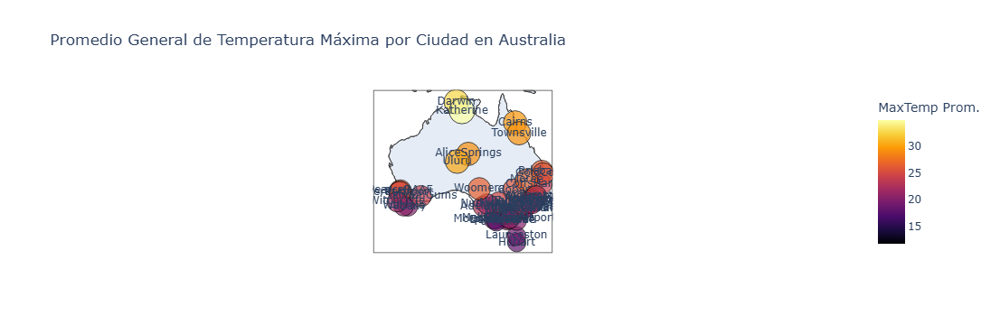

In [298]:
# Crear el mapa
fig = px.scatter_geo(
    datos_temp,
    lat='Latitude',
    lon='Longitude',
    text='Location',
    color='MaxTemp',
    color_continuous_scale='Inferno',
    size='MaxTemp',
    projection='natural earth',
    title='Promedio General de Temperatura Máxima por Ciudad en Australia',
    hover_name='Location',
    hover_data={'MaxTemp': ':.2f', 'Latitude': True, 'Longitude': True}
)

# Mejorar estilo del mapa
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_geos(
    lataxis_range=[-45, -10],
    lonaxis_range=[110, 155],
    visible=True,
    showcountries=True,
    showsubunits=True
)
fig.update_layout(coloraxis_colorbar=dict(title='MaxTemp Prom.'))

fig.show()

### Matriz de correlación sobre la variable objetivo de regresión

Ahora procedemos a buscar las posibles variables predictoras para nustra variable objetivo MaxTemp. Importamos los datos ya tratados

In [302]:
ds = pd.read_csv('../data/data_limpia.csv')
ds.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
0,0.543424,0.523629,0.001617,0.413043,0.370370,0.421053,0.71,0.22,0.390741,0.392523,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8125,0.8125,0.8750
1,0.394541,0.565217,0.000000,0.413043,0.074074,0.385965,0.44,0.25,0.444444,0.405607,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8750,0.3750,0.9375
2,0.531017,0.576560,0.000000,0.434783,0.351852,0.456140,0.38,0.30,0.388889,0.422430,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.9375,0.8125,0.9375
3,0.439206,0.620038,0.000000,0.195652,0.203704,0.157895,0.45,0.16,0.574074,0.499065,...,0.0,0.002695,0.0,0.041667,1.0,1.0,1.0,0.2500,0.5625,0.0000
4,0.645161,0.701323,0.002695,0.380435,0.129630,0.350877,0.82,0.33,0.448148,0.371963,...,0.0,0.000539,0.0,0.041667,1.0,1.0,1.0,0.8125,0.0625,0.4375


In [304]:
ds.shape

(142190, 24)

Calculamos la correlación entre todas las variables

In [306]:
mat_corr = ds.corr()

for i in range(mat_corr.shape[0]):
  mat_corr.iloc[i, i] = 0.0

mat_corr

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
MinTemp,0.000000,0.734612,0.104336,0.167558,0.178041,0.180584,-0.244820,-0.020429,-0.431672,-0.442845,...,0.056511,0.123368,0.081081,-0.005314,-0.117741,-0.069890,0.479298,-0.124923,-0.122358,-0.160780
MaxTemp,0.734612,0.000000,-0.064261,0.053976,0.035217,0.051618,-0.504395,-0.498517,-0.318520,-0.404342,...,-0.219097,-0.035626,-0.155631,-0.025736,0.031044,0.049534,0.529743,-0.209394,-0.239978,-0.187628
Rainfall,0.104336,-0.064261,0.000000,0.101514,0.055341,0.044992,0.206691,0.222649,-0.141004,-0.104766,...,0.501686,0.306961,0.238620,-0.003026,-0.266726,-0.605271,0.010981,0.044876,0.065145,0.048553
WindGustSpeed,0.167558,0.053976,0.101514,0.000000,0.554712,0.633746,-0.211224,-0.029235,-0.393452,-0.351767,...,0.137488,0.121045,0.195438,0.080247,-0.113841,-0.075971,0.168552,0.102795,-0.057434,0.111198
WindSpeed9am,0.178041,0.035217,0.055341,0.554712,0.000000,0.486073,-0.270160,-0.048278,-0.191667,-0.151666,...,0.079880,0.047397,0.072720,0.082525,-0.041970,-0.042462,0.123489,-0.027170,-0.173939,0.009980
WindSpeed3pm,0.180584,0.051618,0.044992,0.633746,0.486073,0.000000,-0.144495,0.033008,-0.250956,-0.216504,...,0.069788,0.029741,0.068854,0.062831,-0.019200,-0.033676,0.149715,0.045851,-0.026754,0.039124
Humidity9am,-0.244820,-0.504395,0.206691,-0.211224,-0.270160,-0.144495,0.000000,0.647080,0.145065,0.191889,...,0.338721,0.161501,0.251316,0.000413,-0.148202,-0.144441,-0.291275,0.075530,0.205494,0.045299
Humidity3pm,-0.020429,-0.498517,0.222649,-0.029235,-0.048278,0.033008,0.647080,0.000000,0.012934,0.088914,...,0.346370,0.239428,0.380215,0.015685,-0.221771,-0.156240,-0.193056,0.095492,0.181461,0.023594
Pressure9am,-0.431672,-0.318520,-0.141004,-0.393452,-0.191667,-0.250956,0.145065,0.012934,0.000000,0.944232,...,-0.165910,-0.147207,-0.220851,0.037325,0.142196,0.099116,-0.356595,-0.105399,0.029940,-0.115201
Pressure3pm,-0.442845,-0.404342,-0.104766,-0.351767,-0.151666,-0.216504,0.191889,0.088914,0.944232,0.000000,...,-0.089292,-0.144088,-0.198559,0.047329,0.142746,0.074035,-0.350050,-0.022202,0.101505,-0.028283


Graficamos un mapa de calor de la matriz obtenida del calculo de correlación

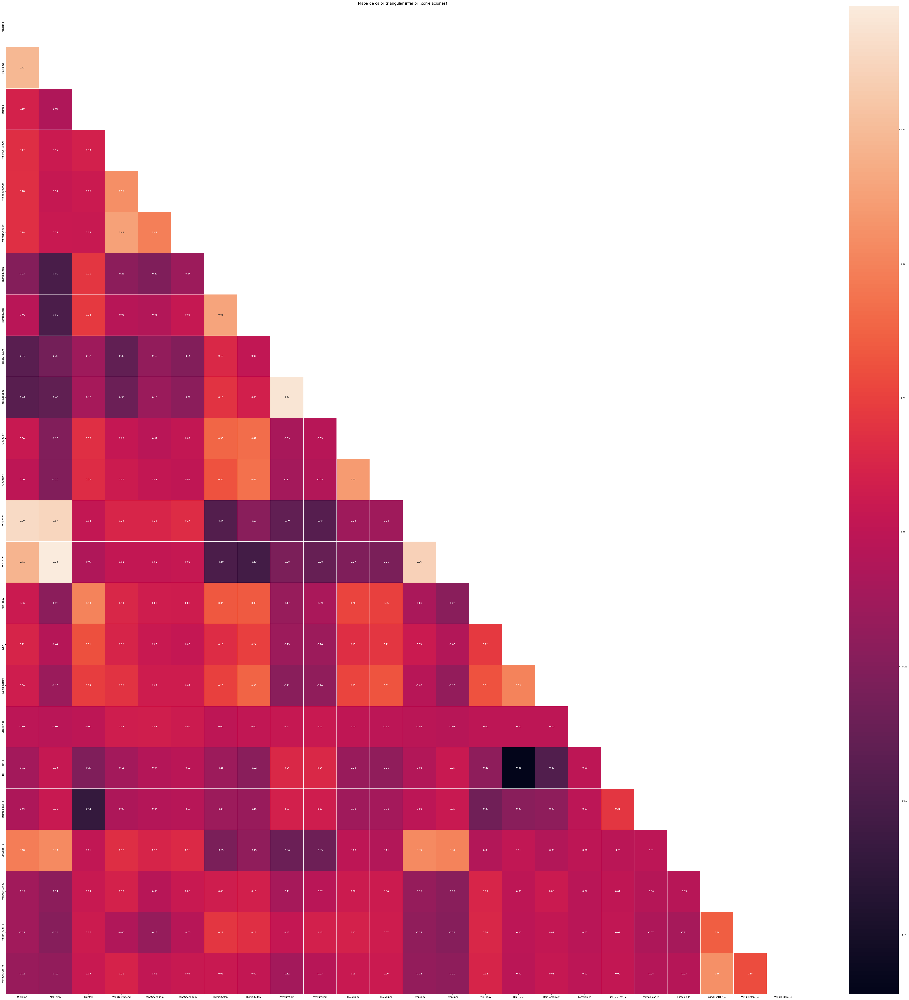

In [308]:
# Crear una máscara para ocultar la parte superior
mask = np.triu(np.ones_like(mat_corr, dtype=bool))

plt.figure(figsize=(60, 60))
sns.heatmap(mat_corr, mask=mask, annot=True, fmt=".2f", linewidths=0.5)
plt.title("Mapa de calor triangular inferior (correlaciones)", fontsize=16)
plt.tight_layout()
plt.show()

Mostramos las variables con las correlaciones más altas

In [310]:
# Obtener el triángulo superior de la matriz para evitar duplicados y la diagonal
mask = np.triu(np.ones_like(mat_corr, dtype=bool))
mat_corr_masked = mat_corr.where(~mask)

# Filtrar las correlaciones con valor absoluto mayor a 0.5
umbral = 0.5
correlaciones_altas = mat_corr_masked[mat_corr_masked.abs() > umbral]

# Descartar valores nulos y convertir a formato largo
correlaciones_altas = correlaciones_altas.stack().sort_values(ascending=False)

print(correlaciones_altas)


Temp3pm          MaxTemp           0.979601
Pressure3pm      Pressure9am       0.944232
Temp9am          MinTemp           0.898937
                 MaxTemp           0.874381
Temp3pm          Temp9am           0.855272
MaxTemp          MinTemp           0.734612
Temp3pm          MinTemp           0.714056
Humidity3pm      Humidity9am       0.647080
WindSpeed3pm     WindGustSpeed     0.633746
Cloud3pm         Cloud9am          0.600768
WindDir3pm_le    WindGustDir_le    0.561563
WindSpeed9am     WindGustSpeed     0.554712
Estacion_le      Temp9am           0.531193
                 MaxTemp           0.529743
                 Temp3pm           0.501704
RainToday        Rainfall          0.501686
RainTomorrow     RISK_MM           0.501484
Humidity9am      MaxTemp          -0.504395
Temp3pm          Humidity3pm      -0.531519
Rainfall_cat_le  Rainfall         -0.605271
Risk_MM_cat_le   RISK_MM          -0.860398
dtype: float64


### Variables predictoras seleccionadas

Finalmente mostramos las 10 variables más correlacionadas con la variable objetivo MaxTemp.

In [312]:
mat_corr['MaxTemp'].abs().sort_values(ascending=False).head(10)

Temp3pm        0.979601
Temp9am        0.874381
MinTemp        0.734612
Estacion_le    0.529743
Humidity9am    0.504395
Humidity3pm    0.498517
Pressure3pm    0.404342
Pressure9am    0.318520
Cloud3pm       0.260509
Cloud9am       0.257109
Name: MaxTemp, dtype: float64

##Análisis de la variable objetivo Clasificación

A continuación, procederemos a analizar nuestra variable objetivo para el problema de clasificación: RainTomorrow. Esta variable indica si se espera lluvia al día siguiente, y representa una excelente elección para un ejercicio de clasificación binaria, ya que sus valores posibles son claramente diferenciables (sí o no). Además, RainTomorrow capta de manera efectiva el comportamiento de las precipitaciones, el cual está estrechamente relacionado con factores como la ubicación geográfica, la estación del año y las características climáticas específicas de cada región del país.

La elección de esta variable no solo permite entrenar modelos que clasifiquen con base en condiciones meteorológicas actuales, sino que también refleja un fenómeno climático de gran interés práctico.

Ahora visualizamos el promedio de lluvia de cada localidad y vemos su posición dentro del mapa de Australia.

- Podemos notar a grandes rasgos que las zonas costeras son más lluviosas que las zonas interiores de Australia.

In [314]:
datos_rain = df_geo.groupby(['Location', 'Latitude', 'Longitude'])['Rainfall'].mean().reset_index()

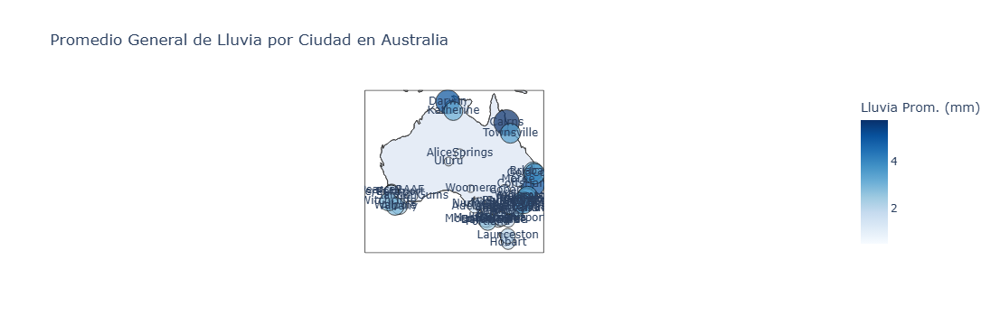

In [316]:
# Crear el mapa
fig = px.scatter_geo(
    datos_rain,
    lat='Latitude',
    lon='Longitude',
    text='Location',
    color='Rainfall',
    color_continuous_scale='Blues',
    size='Rainfall',
    projection='natural earth',
    title='Promedio General de Lluvia por Ciudad en Australia',
    hover_name='Location',
    hover_data={'Rainfall': ':.2f', 'Latitude': False, 'Longitude': False}
)

# Mejorar estilo del mapa
fig.update_traces(marker=dict(line=dict(width=1, color='black')))
fig.update_geos(
    lataxis_range=[-45, -10],
    lonaxis_range=[110, 155],
    visible=True,
    showcountries=True,
    showsubunits=True
)
fig.update_layout(coloraxis_colorbar=dict(title='Lluvia Prom. (mm)'))

fig.show()

### Balanceado de la variable objetivo de clasificación según Location y Estación del año

Procederemos a realizar el balanceado de la variable objetivo de clasificación RainTomorrow en base a Location y Estacion del año

In [318]:
balance = ds.groupby(['Location_le', 'Estacion_le'])['RainTomorrow'].value_counts().unstack()

In [320]:
balance['Total'] = balance.sum(axis=1)
balance['RainTomorrow_ratio'] = balance[1] / balance['Total']

Esta tabla presenta información sobre la variable RainTomorrow, que indica si lloverá al día siguiente (0.0 para no lluvia y 1.0 para lluvia).

Se organiza por estaciones codificadas en Location_le y Estacion_le, mostrando el número de registros donde no llueve (0.0) y donde sí llueve (1.0). La columna Total suma ambos valores, reflejando el número total de observaciones por ubicación.

La columna RainTomorrow_ratio indica la proporción de días con lluvia en cada estación, calculada como el número de días con lluvia dividido por el total de registros. Por ejemplo, en la primera Location_le (0.000000 en Estacion_le), aproximadamente 38.28% de los días tienen lluvia. En cambio, en la misma Location_le pero con la estación 1.00000, solo 11.67% de los días tienen lluvia.


In [322]:
balance

RainTomorrow             0.0  1.0  Total  RainTomorrow_ratio
Location_le Estacion_le                                     
0.000000    0.000000     487  302    789            0.382763
            0.333333     607  158    765            0.206536
            0.666667     657  142    799            0.177722
            1.000000     651   86    737            0.116689
0.020833    0.000000     398  360    758            0.474934
...                      ...  ...    ...                 ...
0.979167    1.000000     544  199    743            0.267833
1.000000    0.000000     707   53    760            0.069737
            0.333333     739   57    796            0.071608
            0.666667     678   49    727            0.067400
            1.000000     663   43    706            0.060907

[196 rows x 4 columns]

Definimos nuestras posibles variables predictoras, por ahora serían todas las variables menos la variable RainTomorrow

In [324]:
feature_cols = [col for col in ds.columns if col != 'RainTomorrow']

Aplicamos el algoritmo Smote agrupando por Location y Estacion del año

In [326]:
from imblearn.over_sampling import SMOTE


def aplicar_smote_por_grupo(df, feature_cols, target_col='RainTomorrow', group_cols=['Location_le', 'Estacion_le'], k_neighbors=1, random_state=42):
  """
    Aplica SMOTE de forma individual para cada grupo definido por group_cols.

    Parámetros:
    - df: DataFrame de entrada.
    - feature_cols: lista de columnas de entrada (features).
    - target_col: nombre de la columna objetivo (por defecto 'RainTomorrow').
    - group_cols: lista con las columnas de agrupamiento (por defecto ['Location_le', 'Estacion_le']).
    - k_neighbors: número de vecinos para SMOTE (por defecto 1).
    - random_state: semilla para reproducibilidad (por defecto 42).

    Retorna:
    - X_final: DataFrame con features reamuestrados.
    - y_final: Serie con etiquetas reamuestradas.
    - grupos_fallidos: lista de DataFrames con los grupos que no se pudieron reamuestrar.
  """

  X_resampled_list = []
  y_resampled_list = []

  grupos_fallidos = []

  grouped = df.groupby(group_cols)

  for group_keys, group in grouped:
      X_group = group[feature_cols]
      y_group = group[target_col]

      # Contar clases
      counts = y_group.value_counts()
      print(f"Grupo {group_keys} - Clases:\n{counts}\n")

      if len(counts) < 2 or counts.min() < 2:
          print(f"⚠️ Grupo con una sola muestra minoritaria: {group_keys}")
          grupos_fallidos.append(group)
          continue

      sm = SMOTE(random_state=random_state, k_neighbors=k_neighbors)
      try:
          X_res, y_res = sm.fit_resample(X_group, y_group)
          X_resampled_list.append(pd.DataFrame(X_res, columns=feature_cols))
          y_resampled_list.append(pd.Series(y_res, name=target_col))
      except ValueError as e:
          print(f"❌ SMOTE falló para {group_keys}: {e}")
          grupos_fallidos.append(group)
          continue

  # Concatenar resultados
  X_final = pd.concat(X_resampled_list, ignore_index=True)
  y_final = pd.concat(y_resampled_list, ignore_index=True)

  return X_final, y_final, grupos_fallidos

In [328]:
X_smote, y_smote, grupos_no_procesados = aplicar_smote_por_grupo(ds, feature_cols)

Grupo (0.0, 0.0) - Clases:
RainTomorrow
0.0    487
1.0    302
Name: count, dtype: int64

Grupo (0.0, 0.3333333333333333) - Clases:
RainTomorrow
0.0    607
1.0    158
Name: count, dtype: int64

Grupo (0.0, 0.6666666666666666) - Clases:
RainTomorrow
0.0    657
1.0    142
Name: count, dtype: int64

Grupo (0.0, 1.0) - Clases:
RainTomorrow
0.0    651
1.0     86
Name: count, dtype: int64

Grupo (0.0208333333333333, 0.0) - Clases:
RainTomorrow
0.0    398
1.0    360
Name: count, dtype: int64

Grupo (0.0208333333333333, 0.3333333333333333) - Clases:
RainTomorrow
0.0    560
1.0    227
Name: count, dtype: int64

Grupo (0.0208333333333333, 0.6666666666666666) - Clases:
RainTomorrow
0.0    513
1.0    214
Name: count, dtype: int64

Grupo (0.0208333333333333, 1.0) - Clases:
RainTomorrow
0.0    643
1.0    101
Name: count, dtype: int64

Grupo (0.0416666666666666, 0.0) - Clases:
RainTomorrow
0.0    525
1.0    234
Name: count, dtype: int64

Grupo (0.0416666666666666, 0.3333333333333333) - Clases:
RainTom

Varificamos que se haya aplicado el aumento de datos para balancear las clases segun location y Estacion

In [330]:
X_smote.shape

(218892, 23)

In [332]:
y_smote.shape

(218892,)

Durante el proceso de balanceo utilizando SMOTE, se identificaron dos combinaciones específicas de Location_le y Estacion_le para las cuales no fue posible aplicar la técnica, debido a que en cada una de ellas existía solo una muestra perteneciente a la clase minoritaria de la variable objetivo RainTomorrow. Esta situación impide el funcionamiento de SMOTE, ya que requiere al menos dos muestras de la clase minoritaria para poder generar instancias sintéticas a partir de sus vecinos.

Los grupos afectados son los siguientes:

- Location_le = 0.2708, Estacion_le = 0.0

- Location_le = 0.3333, Estacion_le = 0.0

Para estos casos particulares, se optará por aplicar RandomOverSampler, una técnica de sobre-muestreo que no depende de los vecinos y permite duplicar aleatoriamente las muestras de la clase minoritaria. De esta forma, se logrará balancear ambos grupos sin necesidad de descartar datos valiosos ni introducir sesgos significativos, asegurando así que todos los grupos sean tratados de forma equitativa en la etapa de entrenamiento del modelo.

Aplicamos RandomOverSampler

In [334]:
from imblearn.over_sampling import RandomOverSampler

X_fallidos = []
y_fallidos = []

for grupo in grupos_no_procesados:
    X_group = grupo[feature_cols]
    y_group = grupo['RainTomorrow']

    ros = RandomOverSampler(random_state=42)
    X_res, y_res = ros.fit_resample(X_group, y_group)

    X_fallidos.append(pd.DataFrame(X_res, columns=feature_cols))
    y_fallidos.append(pd.Series(y_res, name='RainTomorrow'))

# Concatenar resultados
X_fallidos_final = pd.concat(X_fallidos, ignore_index=True)
y_fallidos_final = pd.concat(y_fallidos, ignore_index=True)


Concatenamos los datos obtenidos de SMOTE con los de RandomOverSampler

In [336]:
X_completo = pd.concat([X_smote, X_fallidos_final], ignore_index=True)
y_completo = pd.concat([y_smote, y_fallidos_final], ignore_index=True)

Concatenamos en un dataset finalmente balanceado

In [338]:
ds_balanceado = pd.concat([X_completo, y_completo], axis=1)

Revisamos la cantidad de datos del dataset balanceado

In [340]:
ds_balanceado.shape

(221312, 24)

In [342]:
resumen = ds_balanceado.groupby(['Location_le', 'Estacion_le'])['RainTomorrow'].value_counts().unstack()

In [344]:
resumen['Total'] = resumen[0] + resumen[1]
resumen['RainTomorrow_ratio'] = resumen[1] / resumen['Total']

Por ultimo, como podemos ver en esta tabla, por cada Location y Estacion tenemos la misma probabilidad de clasificar a la variable RainTomorrow como 0 o como 1, es decir se ha balanceado correctamente el dataset por Location y Estacion.

In [346]:
resumen

RainTomorrow             0.0  1.0  Total  RainTomorrow_ratio
Location_le Estacion_le                                     
0.000000    0.000000     487  487    974                 0.5
            0.333333     607  607   1214                 0.5
            0.666667     657  657   1314                 0.5
            1.000000     651  651   1302                 0.5
0.020833    0.000000     398  398    796                 0.5
...                      ...  ...    ...                 ...
0.979167    1.000000     544  544   1088                 0.5
1.000000    0.000000     707  707   1414                 0.5
            0.333333     739  739   1478                 0.5
            0.666667     678  678   1356                 0.5
            1.000000     663  663   1326                 0.5

[196 rows x 4 columns]

In [348]:
resumen[resumen['RainTomorrow_ratio'] < 0.5]

,RainTomorrow,0.0,1.0,Total,RainTomorrow_ratio
Location_le,Estacion_le,,,,


Exportamos nuestro dataset balanceado

In [350]:
ds_balanceado.to_csv('../data/dataset_balanceado.csv', index=False)

## Conclusiones Fase 3
- Se confirmó la predominancia de días secos y patrones térmicos coherentes con las zonas templadas y áridas de Australia.

- Se identificaron limitaciones importantes, como la ausencia significativa de datos en variables críticas (como evaporación y horas de sol), las cuales fueron descartadas para garantizar la integridad del análisis.

- Se evidenció un fuerte desbalance en las variables objetivo relacionadas con la lluvia, especialmente en la variable RainTomorrow. Esto motivó la aplicación de técnicas avanzadas de balanceo de clases como SMOTE, ejecutadas a nivel de grupos definidos por Location_le y Estacion_le.

- Para los grupos donde SMOTE no fue aplicable debido a la escasez extrema de muestras minoritarias, se utilizó RandomOverSampler como alternativa para lograr el balance sin perder información relevante.

- Se implementó una estrategia de imputación por KNN dentro de cada grupo, lo que permitió preservar las relaciones locales entre variables. Posteriormente, para los valores aún faltantes, se aplicó imputación con la mediana global, asegurando un tratamiento completo y razonable de los valores nulos.

- Se realizó un análisis de correlación entre variables para detectar redundancias y problemas de colinealidad. Como resultado, se seleccionó la variable MaxTemp como candidata para modelos de regresión, descartando Temp3pm por su alta correlación (0.97) y evitar multicolinealidad.

- En conjunto, estas tareas permitieron dejar el dataset en condiciones óptimas para el desarrollo de modelos predictivos, tanto de clasificación como de regresión, asegurando consistencia, balance y calidad en los datos.



# Fase 4: Modeling

## Aprendizaje Supervisado - Regresión

Los modelos de regresión son técnicas estadísticas y de aprendizaje automático que permiten analizar la relación entre una variable dependiente (o variable de salida) y una o más variables independientes (o predictoras). Su objetivo principal es predecir el valor de la variable dependiente a partir de los valores conocidos de las variables independientes.

Cargamos el dataset ya preparado para los modelos.

In [352]:
ds_reg = pd.read_csv('../data/data_limpia.csv')
ds_reg.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,RainToday,RISK_MM,RainTomorrow,Location_le,Risk_MM_cat_le,Rainfall_cat_le,Estacion_le,WindGustDir_le,WindDir9am_le,WindDir3pm_le
0,0.543424,0.523629,0.001617,0.413043,0.370370,0.421053,0.71,0.22,0.390741,0.392523,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8125,0.8125,0.8750
1,0.394541,0.565217,0.000000,0.413043,0.074074,0.385965,0.44,0.25,0.444444,0.405607,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.8750,0.3750,0.9375
2,0.531017,0.576560,0.000000,0.434783,0.351852,0.456140,0.38,0.30,0.388889,0.422430,...,0.0,0.000000,0.0,0.041667,1.0,1.0,1.0,0.9375,0.8125,0.9375
3,0.439206,0.620038,0.000000,0.195652,0.203704,0.157895,0.45,0.16,0.574074,0.499065,...,0.0,0.002695,0.0,0.041667,1.0,1.0,1.0,0.2500,0.5625,0.0000
4,0.645161,0.701323,0.002695,0.380435,0.129630,0.350877,0.82,0.33,0.448148,0.371963,...,0.0,0.000539,0.0,0.041667,1.0,1.0,1.0,0.8125,0.0625,0.4375


In [354]:
ds_reg.shape

(142190, 24)

Filtramos el dataset con las variables más importantes para nuestra variable objetivo MaxTemp definidas en la Fase 3. Además agregamos las variables Location y Estacion.

In [356]:
ds_reg = ds_reg[['Temp3pm',
    'Temp9am',
    'MinTemp',
    'Humidity9am',
    'Humidity3pm',
    'Estacion_le',
    'Pressure3pm',
    'Location_le', 'MaxTemp']]

ds_reg

,Temp3pm,Temp9am,MinTemp,Humidity9am,Humidity3pm,Estacion_le,Pressure3pm,Location_le,MaxTemp
0,0.528155,0.518438,0.543424,0.71,0.22,1.0,0.392523,0.041667,0.523629
1,0.576699,0.524946,0.394541,0.44,0.25,1.0,0.405607,0.041667,0.565217
2,0.555340,0.607375,0.531017,0.38,0.30,1.0,0.422430,0.041667,0.576560
3,0.619417,0.544469,0.439206,0.45,0.16,1.0,0.499065,0.041667,0.620038
4,0.681553,0.537961,0.645161,0.82,0.33,1.0,0.371963,0.041667,0.701323
...,...,...,...,...,...,...,...,...,...
142185,0.510680,0.355748,0.297767,0.59,0.27,0.0,0.656075,0.854167,0.502836
142186,0.539806,0.370933,0.280397,0.51,0.24,0.0,0.639252,0.854167,0.533081
142187,0.580583,0.388286,0.300248,0.56,0.21,0.0,0.616822,0.854167,0.568998
142188,0.611650,0.422993,0.344913,0.53,0.24,0.0,0.573832,0.854167,0.599244


Revisamos la matriz de correlación entre nuestras variables con el fin de buscar posible multi-colinealidad.

- Podemos observar que las variables Temp3pm y Temp9am poseen una correlación muy alta entre ambas.
- Además, las variable Temp9am y MinTemp también poseen una correlación demasiado alta entre ellas.

Procederemos a dejar fuera de las variables predictoras a Temp9am y a Humidity9am.


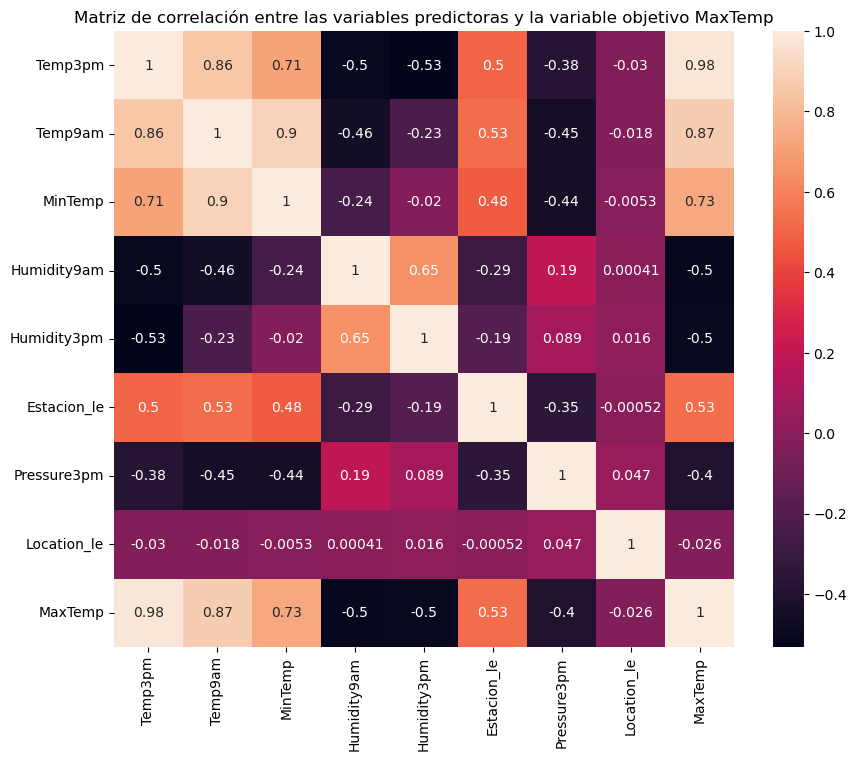

In [358]:
plt.figure(figsize=(10, 8))
sns.heatmap(ds_reg.corr(), annot=True)
plt.title('Matriz de correlación entre las variables predictoras y la variable objetivo MaxTemp')
plt.show()

Separamos las variables predictoras y la variable objetivo

In [362]:
target_regresion = 'MaxTemp'
features_regresion = [
    'MinTemp',
    'Temp3pm',
    'Humidity3pm',
    'Pressure3pm',
    'Estacion_le',
    'Location_le'
]

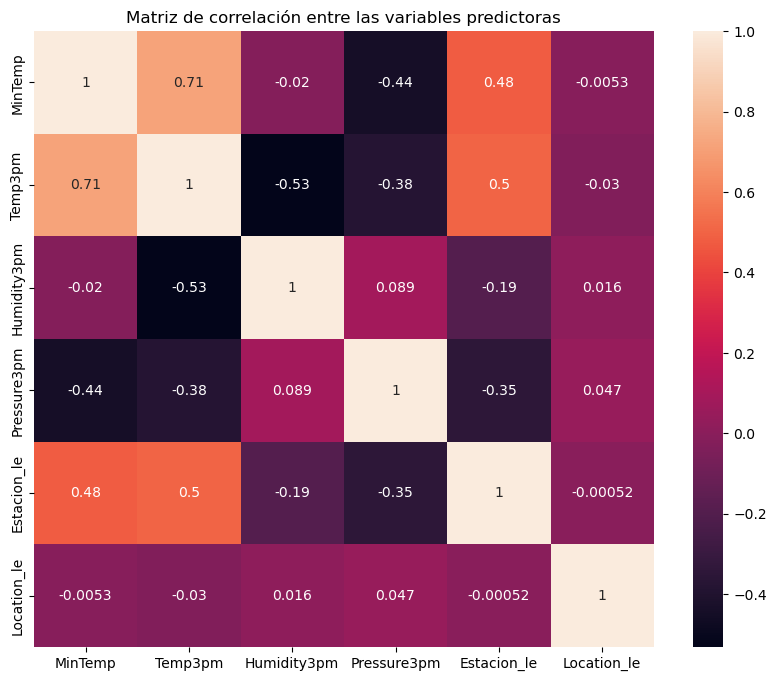

In [368]:
plt.figure(figsize=(10, 8))
sns.heatmap(ds_reg[features_regresion].corr(), annot=True)
plt.title('Matriz de correlación entre las variables predictoras')
plt.show()

Asignamos un "random state" para reproducibilidad

In [370]:
# Random State
rs = 123

Definimos nuestra X e Y

> Add blockquote



In [372]:
X_reg = ds_reg[features_regresion]
y_reg = ds_reg[target_regresion]

Revisamos como queda nuestra X con las variables predictoras

In [374]:
X_reg.head()

,MinTemp,Temp3pm,Humidity3pm,Pressure3pm,Estacion_le,Location_le
0,0.543424,0.528155,0.22,0.392523,1.0,0.041667
1,0.394541,0.576699,0.25,0.405607,1.0,0.041667
2,0.531017,0.555340,0.30,0.422430,1.0,0.041667
3,0.439206,0.619417,0.16,0.499065,1.0,0.041667
4,0.645161,0.681553,0.33,0.371963,1.0,0.041667


In [388]:
X_reg.skew()

MinTemp        0.017284
Temp3pm        0.232627
Humidity3pm   -0.011279
Pressure3pm    0.052929
Estacion_le    0.043427
Location_le    0.015692
dtype: float64

In [376]:
y_reg.head()

0    0.523629
1    0.565217
2    0.576560
3    0.620038
4    0.701323
Name: MaxTemp, dtype: float64

In [390]:
y_reg.skew()

0.22579429460729414

### Split de los datos en Train y Test

Separamos los datos en variables de train y test usando train_test_split de sklearn. Dejaremos un 30% de para nuestro dataset de testing.

In [378]:
from sklearn.model_selection import train_test_split

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_reg, test_size=0.3, random_state=rs)

Revisamos la cantidad de datos para cada variable de train y test

In [380]:
print("Tamaño de X_train_reg:", X_train_reg.shape)
print("Tamaño de y_train_reg:", y_train_reg.shape)
print("Tamaño de X_test_reg:", X_test_reg.shape)
print("Tamaño de y_test_reg:", y_test_reg.shape)

Tamaño de X_train_reg: (99533, 6)
Tamaño de y_train_reg: (99533,)
Tamaño de X_test_reg: (42657, 6)
Tamaño de y_test_reg: (42657,)


### Funciones auxiliares

Función para mostrar los resultados obtenidos en los modelos de regresion

In [382]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error

metricas_por_modelo = []

# Función para imprimir métricas obtenidas por el modelo
def metricas_regresion(X_test, y_test, X_train, y_train, y_pred, modelo_objeto, nombre_modelo="Regresión Lineal"):
    test_score = modelo_objeto.score(X_test, y_test)
    train_score = modelo_objeto.score(X_train, y_train)
    r2 = r2_score(y_true=y_test, y_pred=y_pred)
    mae = mean_absolute_error(y_true=y_test, y_pred=y_pred)
    mse = mean_squared_error(y_true=y_test, y_pred=y_pred)
    rmse = np.sqrt(mse)

    metricas_por_modelo.append([nombre_modelo, test_score, train_score, r2, mae, mse, rmse])

    print(f"🔎 Métricas para el modelo {nombre_modelo}:")
    print(f"- Test Score: {test_score:.4f}")
    print(f"- Train Score: {train_score:.4f}")
    print(f"- R²: {r2:.4f}")
    print(f"- MAE: {mae:.4f}")
    print(f"- MSE: {mse:.4f}")
    print(f"- RMSE: {rmse:.4f}\n")


Función para graficar los residuos obtenidos de nuestra modelo.

In [384]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_residuos(y_true, y_pred, nombre_modelo="Modelo"):
    residuos = y_true - y_pred

    plt.figure(figsize=(8, 5))
    sns.scatterplot(x=y_pred, y=residuos, alpha=0.7, color="teal")
    plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
    plt.title(f"Gráfico de residuos - {nombre_modelo}")
    plt.xlabel("Predicciones")
    plt.ylabel("Residuos (y_true - y_pred)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Función para graficar la regresión obtenida desde el modelo

In [386]:
def plot_regresion(y_true, y_pred, nombre):
  plt.figure(figsize=(8, 5))
  plt.scatter(y_true, y_pred, color="teal", alpha=0.7)
  plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], 'r--')
  plt.title(f'Gráfico de Regresión - {nombre}')
  plt.xlabel('Valores Reales')
  plt.ylabel('Predicciones')
  plt.tight_layout()
  plt.show()

In [448]:
import joblib
import os

def guardar_modelo(modelo, nombre_modelo):
    """
    Guarda el modelo serializado en formato .pkl en Google Drive.

    Parámetros:
    - modelo: objeto del modelo entrenado
    - nombre_modelo: nombre del archivo a guardar (sin extensión)
    """
    ruta_directorio = '../models_ML'
    ruta_modelo = os.path.join(ruta_directorio, f'{nombre_modelo}.pkl')

    # Crear carpeta si no existe
    os.makedirs(ruta_directorio, exist_ok=True)

    # Guardar el modelo
    joblib.dump(modelo, ruta_modelo)
    print(f"Modelo guardado exitosamente en: {ruta_modelo}")

### Regresión Lineal Simple Multivariable

La regresión lineal simple multivariable, también conocida como regresión lineal múltiple, es una técnica estadística que extiende la regresión lineal simple al considerar más de una variable independiente para predecir una variable dependiente. A diferencia de la regresión lineal simple, que analiza la relación entre una sola variable independiente y una dependiente, la regresión multivariable permite modelar escenarios más complejos donde múltiples factores influyen en el resultado.

Importamos el modelo de regresión lineal

In [392]:
from sklearn.linear_model import LinearRegression

Procedemos a entrenar el modelo

In [394]:
# Modelo
lr = LinearRegression()

# Entrenamos
lr.fit(X_train_reg, y_train_reg)

LinearRegression()

Los coeficientes obtenidos por cada variable predictora a partir del modelo de regresión lineal (lr.coef_) indican cuánto influye cada una en la predicción de la variable dependiente, manteniendo las demás constantes. En este caso, el array [0.05114073, 0.89846039, -0.00540711, -0.02426164, 0.01344959, 0.00121378] representa los pesos asignados a nuestras seis variables independientes.

Un coeficiente positivo, como el de la segunda variable (0.89846039), sugiere que al aumentar su valor, también lo hace el valor predicho. Por otro lado, un coeficiente negativo, como el cuarto (-0.02426164), indica una relación inversa con la variable dependiente. Además, la magnitud del coeficiente refleja la fuerza del impacto: coeficientes más grandes tienen mayor influencia en la predicción, mientras que los cercanos a cero, como el sexto (0.00121378), tienen un efecto muy leve. Estos valores ayudan a interpretar y entender el papel de cada variable predictora en el modelo.

In [396]:
# Coeficientes obtenidos por cada variable predictora
lr.coef_

array([ 0.05090051,  0.89904176, -0.00521736, -0.02421303,  0.01340219,
        0.00121986])

El intercepto (lr.intercept_) representa el valor de la variable dependiente cuando todas las variables predictoras son iguales a cero. Es el punto donde la recta de regresión cruza el eje vertical (eje y) en un modelo lineal. Este valor sirve como base sobre la cual se suman (o restan) los efectos de las variables independientes multiplicadas por sus respectivos coeficientes.

In [398]:
# Intercepto
lr.intercept_

0.038527308849463426

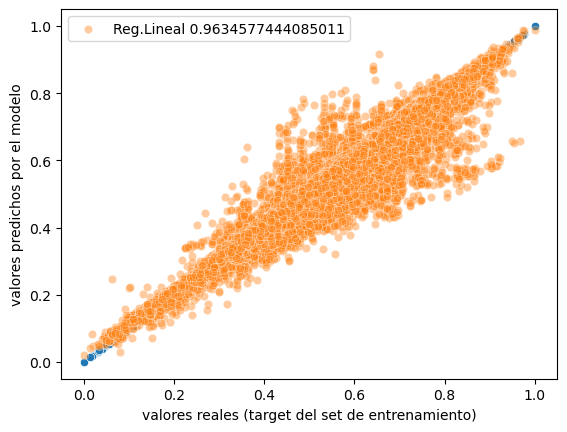

In [450]:
sns.scatterplot(x=y_train_reg, y=y_train_reg)
sns.scatterplot(x=y_train_reg, y=lr.predict(X_train_reg), alpha=.4,label=f'Reg.Lineal {lr.score(X_train_reg, y_train_reg)}')
plt.xlabel("valores reales (target del set de entrenamiento)")
plt.ylabel("valores predichos por el modelo")
plt.show()

Hacemos predicciones con el modelo

In [422]:
# Predecir con el modelo
predicted = lr.predict(X_test_reg)

Los resultados del modelo de regresión lineal indican un muy buen desempeño. El coeficiente de determinación R² de 0.9643 sugiere que el modelo explica aproximadamente el 96.43% de la variabilidad de la variable dependiente, lo cual es consistente tanto en los datos de entrenamiento (Train Score: 0.9634) como en los de prueba (Test Score: 0.9643), evidenciando buena generalización. Además, los errores son bajos: el MAE (error absoluto medio) es de 0.0153, el MSE (error cuadrático medio) es de 0.0006 y el RMSE (raíz del error cuadrático medio) es de solo 0.0250, lo que indica que las predicciones están muy cerca de los valores reales.

Imprimimos las métricas de evaluación del modelo de regresión.

In [424]:
# Imprimir métricas obtenidas
metricas_regresion(X_test_reg, y_test_reg, X_train_reg, y_train_reg, predicted, lr)

🔎 Métricas para el modelo Regresión Lineal:
- Test Score: 0.9644
- Train Score: 0.9635
- R²: 0.9644
- MAE: 0.0153
- MSE: 0.0006
- RMSE: 0.0250



El gráfico de residuos muestra los residuos (es decir, la diferencia entre los valores reales y las predicciones) en el eje vertical, y las predicciones en el eje horizontal. La línea roja discontinua representa el valor 0 de residuo, que sería el ideal si el modelo predijera perfectamente.

- Distribución centrada en 0: La mayoría de los residuos están distribuidos alrededor de la línea horizontal del 0, lo cual es una buena señal. Indica que el modelo no tiene un sesgo sistemático en sus predicciones.

- Varianza no constante (heterocedasticidad leve): Se observa una ligera forma de "embudo" o dispersión mayor en el centro del gráfico (aproximadamente entre 0.3 y 0.7 en predicciones). Esto sugiere que el error del modelo tiende a ser más grande en esa zona, lo que podría indicar heterocedasticidad, es decir, que el modelo comete errores de magnitud distinta según el rango de la predicción.

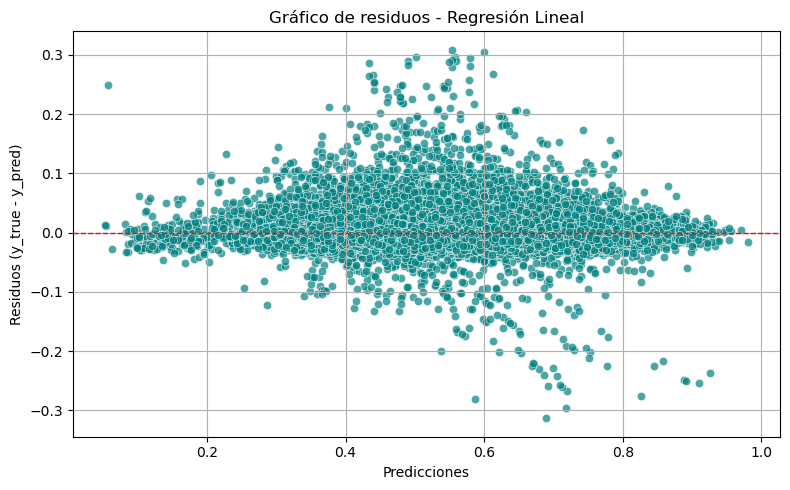

In [426]:
plot_residuos(y_test_reg, predicted, "Regresión Lineal")

Finalmente graficamos el comportamiento del modelo de regresión lineal



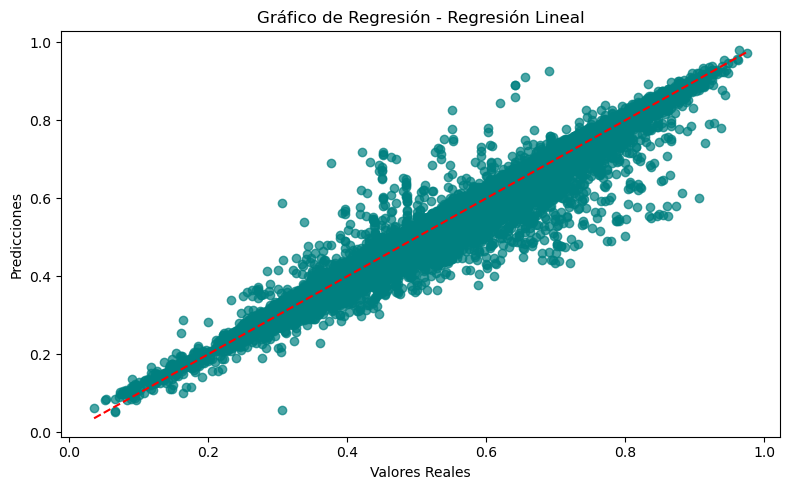

In [428]:
plot_regresion(y_test_reg, predicted, "Regresión Lineal")

### Regresión de Ridge (L2) con GridSearchCV

El modelo de regresión Ridge es una variante de la regresión lineal que incorpora una penalización (regularización L2) para reducir el sobreajuste y mejorar la generalización del modelo, especialmente cuando hay muchas variables predictoras o multicolinealidad. Esta penalización agrega un término al error cuadrático que castiga los coeficientes grandes, forzándolos a ser más pequeños y estables.

Al usar GridSearchCV, se automatiza la búsqueda del mejor valor del hiperparámetro de regularización (alpha), probando múltiples combinaciones en un proceso de validación cruzada. Esto permite seleccionar el modelo con el mejor rendimiento de forma más robusta y optimizada, evaluando el ajuste del modelo en diferentes subconjuntos de los datos para evitar el sobreajuste y mejorar la precisión en datos no vistos.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge

Usaremos valores de alpha desde 0.001 a 1000

In [ ]:
np.logspace(-3, 3, 7)

Ajustamos la grilla de parámetros a usar

In [ ]:
# Hiperparámetros a probar
param_grid = {
    'alpha': np.logspace(-3, 3, 7)  # valores de alpha: desde 0.001, 0.01, 1, 10, 100, 1000
}

Entrenamiento del modelo Ridge con GridSearchCV con 5 iteraciones de validación cruzada

In [ ]:
# Modelo
ridge = Ridge()

In [ ]:
# GridSearch con 5 folds de cross validation
grid_search = GridSearchCV(
    estimator=ridge,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Entrenamos
grid_search.fit(X_train_reg, y_train_reg)

Los resultados de GridSearchCV muestran que el mejor valor para el hiperparámetro de regularización alpha en el modelo Ridge fue 0.01, lo que indica un nivel bajo de penalización. El mejor desempeño del modelo durante la validación cruzada se obtuvo con un error cuadrático medio negativo (neg MSE) de -0.000648, lo que refleja un ajuste preciso. Al tomar la raíz cuadrada de este valor, se obtiene un RMSE (error cuadrático medio de validación) de aproximadamente 0.0255, lo que confirma que el modelo tiene una buena capacidad de predicción con errores bajos y consistentes.

In [ ]:
# Resultados de GridSearch
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor score (neg MSE):", grid_search.best_score_)
print("Mejor RMSE (CV):", np.sqrt(-grid_search.best_score_))

Usaremos el modelo con los mejores parámetros

In [ ]:
# Mejor modelo
best_model_ridge = grid_search.best_estimator_
best_model_ridge

Predecimos con el modelo de Ridge

In [ ]:
# Predecimos
y_pred_ridge = best_model_ridge.predict(X_test_reg)

Imprimimos los resultados del modelo de Ridge con GridSearchCV. Vemos que tenemos los mismos resultados que en la regresión lineal multivariable.

In [ ]:
# Imprimimos las métricas
metricas_regresion(
    X_test_reg,
    y_test_reg,
    X_train_reg,
    y_train_reg,
    y_pred_ridge,
    best_model_ridge,
    "Ridge GridSearchCV"
)

Revisamos el gráfico de residuos y confirmamos que es muy similar al de Regresión lineal simple multivariable.

In [ ]:
plot_residuos(y_test_reg, y_pred_ridge, "Ridge GridSearchCV")

Finalmente graficamos el comportamiento del modelo de regresión de Ridge.

In [ ]:
plot_regresion(y_test_reg, y_pred_ridge)

### Árbol de Decisión de regresión con GridSearchCV

Un Árbol de Decisión de regresión es un modelo de aprendizaje supervisado que divide los datos en ramas según sus características, con el objetivo de predecir un valor numérico continuo. A diferencia de los árboles de clasificación, que predicen categorías, en este caso el modelo estima un valor real, como la temperatura o el precio de una vivienda.

Para mejorar el rendimiento del modelo, se puede utilizar GridSearchCV, una técnica que permite buscar de manera exhaustiva la mejor combinación de hiperparámetros (como la profundidad máxima del árbol o el número mínimo de muestras por hoja). Esta búsqueda se realiza mediante validación cruzada, evaluando múltiples combinaciones y seleccionando aquella que produce el mejor resultado en términos de precisión o error en los datos de validación. Así, se logra optimizar el modelo y reducir el riesgo de sobreajuste.

Importamos el modelo de arbol de decisión de regresión

In [432]:
from sklearn.tree import DecisionTreeRegressor

Ajustamos la grilla de parámetros a ajustar con GridSearchCV.

In [434]:
# Hiperparámetros a probar
param_tree = {
    'splitter': ['best', 'random'],
    'max_depth': [5, 10, 20, 30, 40, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5, 10, 15],
    'max_features': ['sqrt', 'log2']
}

Entrenamos el modelo DecisionTreeRegressor con 5 iteraciones de validación cruzada.

In [436]:
# Modelo
tree = DecisionTreeRegressor(random_state=rs)

In [440]:
from sklearn.model_selection import GridSearchCV

# GridSearch con 5 folds de cross validation
grid_tree = GridSearchCV(
    estimator=tree,
    param_grid=param_tree,
    cv=5,
    n_jobs=-1
)

# Entrenamos
grid_tree.fit(X_train_reg, y_train_reg)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=123), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30, 40, None],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 5, 10, 15],
                         'min_samples_split': [2, 5, 10],
                         'splitter': ['best', 'random']})

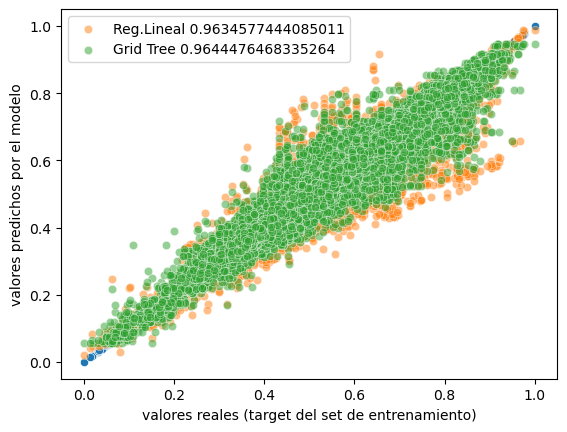

In [446]:
sns.scatterplot(x=y_train_reg, y=y_train_reg)
sns.scatterplot(x=y_train_reg, y=lr.predict(X_train_reg), alpha=.5,label=f'Reg.Lineal {lr.score(X_train_reg, y_train_reg)}')
sns.scatterplot(x=y_train_reg, y=grid_tree.predict(X_train_reg), alpha=.5,label=f'Grid Tree {grid_tree.score(X_train_reg, y_train_reg)}')
plt.xlabel("valores reales (target del set de entrenamiento)")
plt.ylabel("valores predichos por el modelo")
plt.show()

Los mejores parámetros encontrados para el modelo incluyen una profundidad máxima de 30, selección de características usando la raíz cuadrada (sqrt), un mínimo de 15 muestras por hoja, y un mínimo de 2 muestras para dividir un nodo, utilizando el mejor criterio de división (best). Con estos ajustes, el modelo logró un excelente desempeño durante la validación cruzada, con un score negativo de error cuadrático medio (neg MSE) de 0.9524 y un RMSE aproximado de 0.976, lo que indica predicciones bastante precisas y consistentes.

In [452]:
# Resultados de GridSearch
print("Mejores parámetros:", grid_tree.best_params_)
print("Mejor score (neg MSE):", grid_tree.best_score_)
print("Mejor RMSE (CV):", np.sqrt(grid_tree.best_score_))

Mejores parámetros: {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 2, 'splitter': 'best'}
Mejor score (neg MSE): 0.9530675761932145
Mejor RMSE (CV): 0.976251799585135


Predecimos con el mejor modelo obtenido desde el arbol de decision.



In [454]:
# Modelo con los mejores parámetros
best_tree = grid_tree.best_estimator_
best_tree

DecisionTreeRegressor(max_depth=30, max_features='sqrt', min_samples_leaf=10,
                      random_state=123)

In [456]:
# Predecimos con el modelo de mejor rendimiento
y_pred_tree = best_tree.predict(X_test_reg)

Imprimimos los resultados obtenidos en la predicción

In [458]:
# Imprimimos los resultados obtenidos
metricas_regresion(
    X_test_reg,
    y_test_reg,
    X_train_reg,
    y_train_reg,
    y_pred_tree,
    best_tree,
    "Árbol de decisión GridSearchCV"
)

🔎 Métricas para el modelo Árbol de decisión GridSearchCV:
- Test Score: 0.9482
- Train Score: 0.9644
- R²: 0.9482
- MAE: 0.0199
- MSE: 0.0009
- RMSE: 0.0302



Podemos ver en el grafico de residuos que hay un ajuste más pegado a la vertical 0. Sin embargo, sigue habiendo una dispersión mayor en el centro del gráfico (aproximadamente entre 0.4 y 0.7 en predicciones). Esto sugiere que el error del modelo tiende a ser más grande en esa zona.

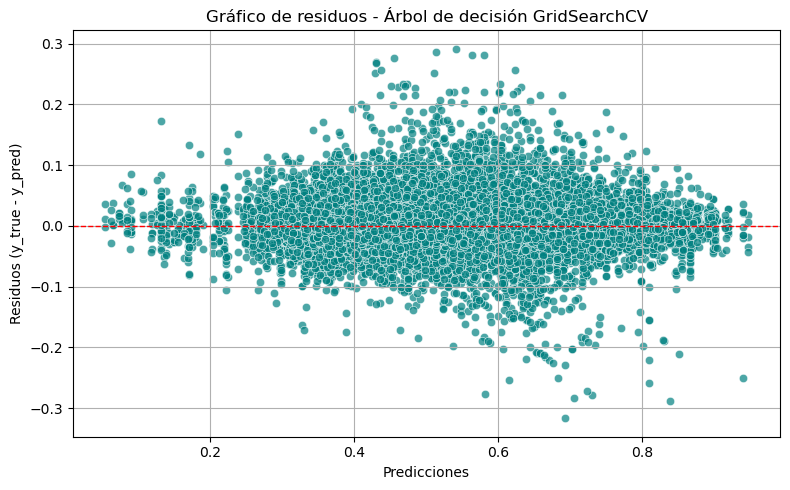

In [460]:
plot_residuos(y_test_reg, y_pred_tree, "Árbol de decisión GridSearchCV")

Finalmente graficamos el comportamiento del modelo de Arbol de decision de regresion.

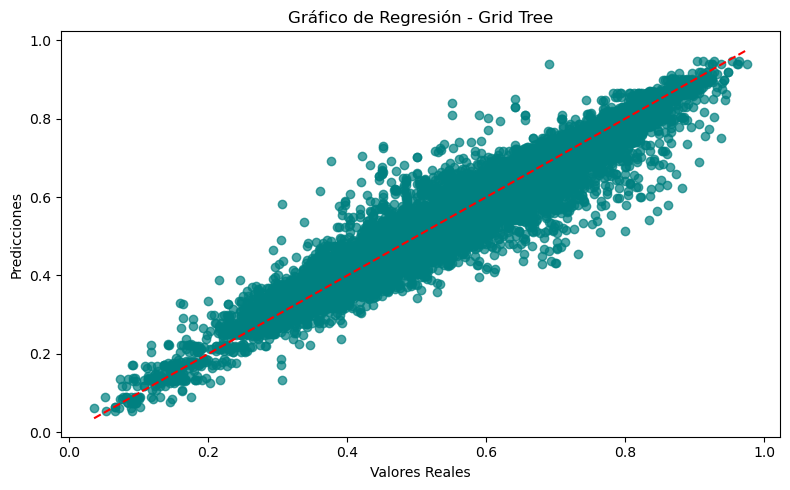

In [464]:
plot_regresion(y_test_reg, y_pred_tree, "Grid Tree")

In [470]:
from sklearn.ensemble import RandomForestRegressor

# Definir el modelo base
rf = RandomForestRegressor(random_state=rs)

rf_params = {
    'n_estimators': [100, 200, 300],         # número de árboles
    'max_depth': [10, 20, 30],               # profundidad máxima
    'min_samples_split': [2, 5, 10],         # mínimo de muestras para dividir un nodo
    'min_samples_leaf': [1, 2, 4],           # mínimo de muestras por hoja
    'max_features': ['auto', 'sqrt', 'log2'] # número de features consideradas en cada split
}

# Crear GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=rf_params,
                           cv=3, scoring='neg_mean_absolute_error', n_jobs=-1, verbose=2)


# Entrenar
grid_search.fit(X_train_reg, y_train_reg)

Fitting 3 folds for each of 243 candidates, totalling 729 fits


C:\Users\osesn\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


243 fits failed out of a total of 729.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
76 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\osesn\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\osesn\anaconda3\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\osesn\anaconda3\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\osesn\anaconda3\Lib\site-packag

GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=123), n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             scoring='neg_mean_absolute_error', verbose=2)

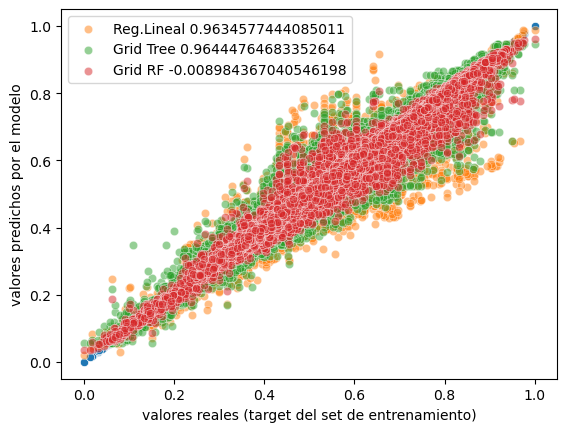

In [472]:
sns.scatterplot(x=y_train_reg, y=y_train_reg)
sns.scatterplot(x=y_train_reg, y=lr.predict(X_train_reg), alpha=.5,label=f'Reg.Lineal {lr.score(X_train_reg, y_train_reg)}')
sns.scatterplot(x=y_train_reg, y=grid_tree.predict(X_train_reg), alpha=.5,label=f'Grid Tree {grid_tree.score(X_train_reg, y_train_reg)}')
sns.scatterplot(x=y_train_reg, y=grid_search.predict(X_train_reg), alpha=.5,label=f'Grid RF {grid_search.score(X_train_reg, y_train_reg)}')
plt.xlabel("valores reales (target del set de entrenamiento)")
plt.ylabel("valores predichos por el modelo")
plt.show()

In [474]:
# Resultados de GridSearch
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor score (neg MSE):", grid_search.best_score_)
print("Mejor RMSE (CV):", np.sqrt(grid_search.best_score_))

Mejores parámetros: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Mejor score (neg MSE): -0.01477641702246517
Mejor RMSE (CV): nan


C:\Users\osesn\AppData\Local\Temp\ipykernel_18908\82892398.py:4: RuntimeWarning:

invalid value encountered in sqrt



In [478]:
# Modelo con los mejores parámetros
best_rf = grid_search.best_estimator_
best_rf

RandomForestRegressor(max_depth=20, max_features='sqrt', min_samples_leaf=2,
                      n_estimators=300, random_state=123)

In [480]:
# Predecimos con el modelo de mejor rendimiento
y_pred_rf = best_rf.predict(X_test_reg)

In [482]:
# Imprimimos los resultados obtenidos
metricas_regresion(
    X_test_reg,
    y_test_reg,
    X_train_reg,
    y_train_reg,
    y_pred_rf,
    best_rf,
    "Random Forest GridSearchCV"
)

🔎 Métricas para el modelo Random Forest GridSearchCV:
- Test Score: 0.9681
- Train Score: 0.9874
- R²: 0.9681
- MAE: 0.0146
- MSE: 0.0006
- RMSE: 0.0237



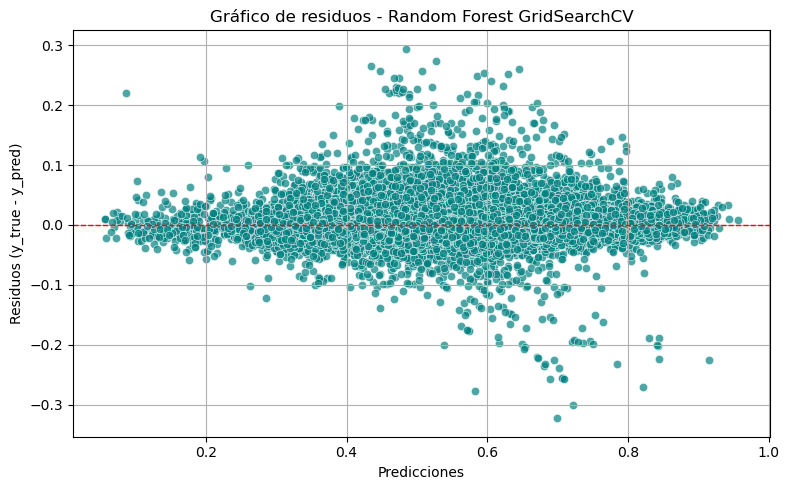

In [484]:
plot_residuos(y_test_reg, y_pred_rf, "Random Forest GridSearchCV")

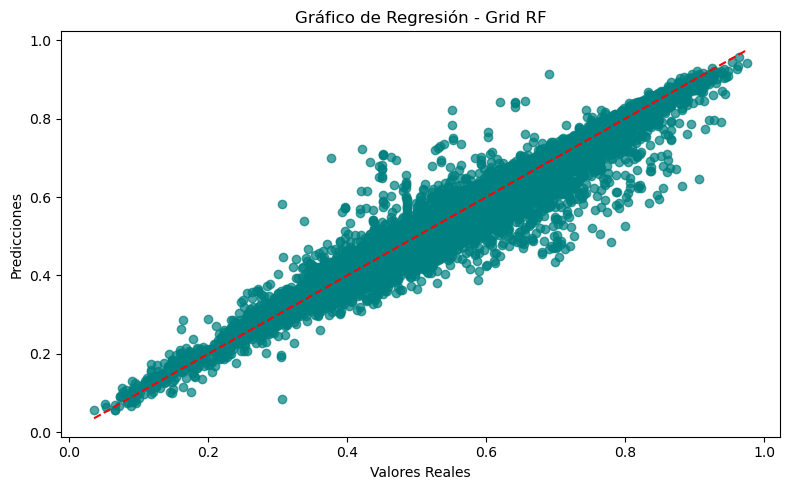

In [486]:
plot_regresion(y_test_reg, y_pred_rf, "Grid RF")

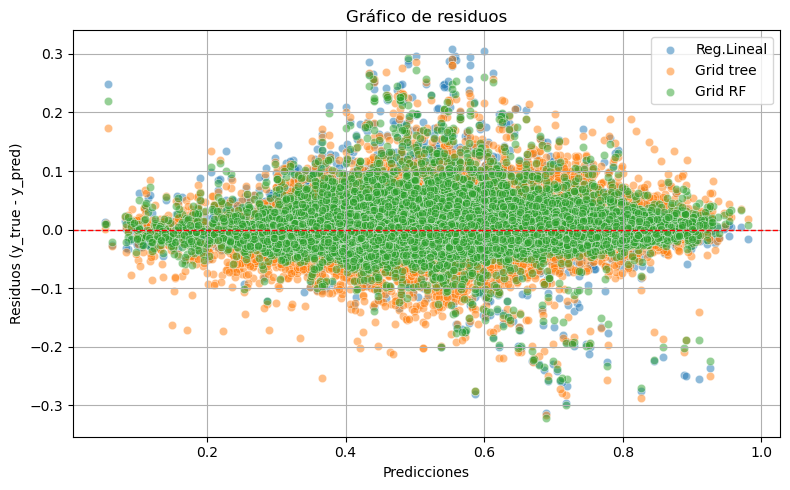

In [506]:
residuo_lr = y_test_reg - predicted
residuo_dt = y_test_reg - y_pred_tree
residuo_rf = y_test_reg - y_pred_rf

plt.figure(figsize=(8, 5))
sns.scatterplot(x=predicted, y=residuo_lr, alpha=0.5, label='Reg.Lineal')
sns.scatterplot(x=predicted, y=residuo_dt, alpha=0.5, label='Grid tree')
sns.scatterplot(x=predicted, y=residuo_rf, alpha=0.5, label='Grid RF')
plt.axhline(y=0, color='r', linestyle='--', linewidth=1)
plt.title(f"Gráfico de residuos")
plt.xlabel("Predicciones")
plt.ylabel("Residuos (y_true - y_pred)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [508]:
guardar_modelo(best_rf, "random_forest_regressor")

Modelo guardado exitosamente en: ../models_ML\random_forest_regressor.pkl


### KNN de regresión con GridSearchCV

El KNN de regresión (K-Nearest Neighbors) es un modelo de aprendizaje supervisado que predice un valor numérico basándose en los valores promedio de los "K" vecinos más cercanos al punto que se desea predecir. La cercanía se calcula mediante una medida de distancia, como la euclidiana, considerando las características del conjunto de datos.

Para mejorar su rendimiento, se aplica GridSearchCV, una técnica que permite encontrar la mejor combinación de hiperparámetros, como el número óptimo de vecinos (K) o el tipo de distancia. GridSearchCV evalúa cada combinación usando validación cruzada, seleccionando la que minimiza el error de predicción. Esto ayuda a construir un modelo más preciso y generalizable.

Importamos el modelo de KNN de regresión.

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

Ajustamos los hiperparámetros a usar con GridSearchCV.

In [ ]:
# Hiperparámetros a probar
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]  # p=1: Manhattan, p=2: Euclidean
}

Entrenamos el modelo con 3 iteraciones de validación cruzada

In [ ]:
# Modelo
knn_regressor = KNeighborsRegressor()

In [ ]:
# GridSearch con 3 folds de cross validation
grid_knn = GridSearchCV(
    estimator=knn_regressor,
    param_grid=param_grid_knn,
    cv=3,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=True
)

# Entrenamos
grid_knn.fit(X_train_reg, y_train_reg)

- Mejores parámetros: El modelo óptimo utiliza el algoritmo kd_tree, con 11 vecinos (n_neighbors=11), una distancia basada en la norma Manhattan (p=1), y un esquema de ponderación por distancia (weights='distance').
- Mejor score (neg MSE): El valor -0.0007818 representa el error cuadrático medio negativo obtenido en la validación cruzada. Un valor más cercano a cero indica un modelo con menor error en sus predicciones.
- Mejor RMSE (CV): Se calcula la raíz del MSE negativo, resultando en un RMSE de 0.02796, lo que representa el error promedio en la escala original de los datos. Un RMSE bajo indica que el modelo tiene una buena capacidad predictiva.
Estos resultados sugieren que la configuración encontrada logra una alta precisión y baja variabilidad en la regresión KNN


In [ ]:
# Resultados de GridSearch Knn Regressor
print("Mejores parámetros:", grid_knn.best_params_)
print("Mejor score (neg MSE):", grid_knn.best_score_)
print("Mejor RMSE (CV):", np.sqrt(-grid_knn.best_score_))

Guardamos el mejor modelo obtenido de GridSearchCV

In [ ]:
# Modelo con los mejores parámetros
best_knn = grid_knn.best_estimator_
best_knn

In [ ]:
import joblib

# Ruta donde guardar el modelo
ruta_modelo = '/content/drive/MyDrive/modelo_knn_regresor.pkl'

# Guardar el modelo
joblib.dump(best_knn, ruta_modelo)

In [ ]:
import joblib

best_knn = joblib.load('/content/drive/MyDrive/modelo_knn_regresor.pkl')

Predecimos con el mejor modelo de KNN Regressor

In [ ]:
# Predecimos con el modelo de mejor rendimiento
y_pred_knn = best_knn.predict(X_test_reg)

Imprimimos los resultados obtenidos de la predicción

El Test Score de 0.9580 indica que el modelo tiene una alta capacidad predictiva sobre datos no vistos, mientras que el Train Score de 1.0000 sugiere que el modelo se ajusta perfectamente a los datos de entrenamiento. Sin embargo, una discrepancia tan grande podría indicar cierto riesgo de sobreajuste, donde el modelo memoriza los datos en lugar de generalizar correctamente.

El R² de 0.9580 confirma que el modelo explica el 95.8% de la variabilidad de los datos, lo que representa una excelente precisión. Además, el MAE (0.0183) y el MSE (0.0007) reflejan errores pequeños en las predicciones, siendo el RMSE (0.0272) la métrica más intuitiva para interpretar el margen de error promedio.


In [ ]:
# Imprimimos los resultados obtenidos
metricas_regresion(
    X_test_reg,
    y_test_reg,
    X_train_reg,
    y_train_reg,
    y_pred_knn,
    best_knn,
    "Knn Regressor GridSearchCV"
)

Podemos ver en el grafico de residuos que sigue habiendo una dispersión mayor en el centro del gráfico (aproximadamente entre 0.4 y 0.7 en predicciones), pero es menor que en el modelo de arbol de decisión.

In [ ]:
plot_residuos(y_test_reg, y_pred_knn, "Knn Regressor GridSearchCV")

Graficamos la regresión del modelo de KNN Regressor

In [ ]:
plot_regresion(y_test_reg, y_pred_knn)

### Tabla resumen del rendimiento de los modelos

Vemos una tabla resumen con las métricas obtenidos por cada modelo de regresión.

In [510]:
metricas_por_modelo = pd.DataFrame(
    metricas_por_modelo,
    columns=[
        "Modelo",
        "Test Score",
        "Train Score",
        "R2",
        "MAE",
        "MSE",
        "RMSE"
    ]
)

metricas_por_modelo

,Modelo,Test Score,Train Score,R2,MAE,MSE,RMSE
0,Regresión Lineal,0.964447,0.963458,0.964447,0.015317,0.000625,0.025004
1,Árbol de decisión GridSearchCV,0.948163,0.964448,0.948163,0.019916,0.000912,0.030192
2,Random Forest GridSearchCV,0.968142,0.987422,0.968142,0.014561,0.000560,0.023669


Guardamos la tabla en un csv y lo exportamos

In [512]:
metricas_por_modelo.to_csv('../metrics/regression/metricas_modelos_regresion.csv', index=False)

### Interpretación general

1. Regresión Lineal y Ridge

  - Prácticamente idénticos (como era de esperar dado que Ridge ≈ Linear cuando la regularización es baja).

  - Muy buen rendimiento y generalización.

  - R2 > 0.96, lo que indica que capturan muy bien la variabilidad de la variable MaxTemp.

2. Árbol de decisión

  - R2 más bajo y mayor RMSE que los lineales.

  - Potencial leve overfitting, ya que Train Score > Test Score.

3. KNN Regressor

  - Muy buen resultado, cercano a los lineales.

  - Sin embargo, Train Score ≈ 1.0 puede indicar overfitting, y es típico de KNN.

  - Aunque generaliza razonablemente bien, es más costoso computacionalmente y menos interpretable.

## Aprendizaje Supervisado - Clasificación



El aprendizaje supervisado en clasificación es una técnica de machine learning donde el modelo aprende a predecir una etiqueta o categoría a partir de datos previamente etiquetados. Durante el entrenamiento, el algoritmo recibe ejemplos con sus respectivas clases correctas y busca encontrar patrones que le permitan clasificar correctamente nuevos datos.

Importamos nuestro dataset balanceado

In [ ]:
ds_clas = pd.read_csv('/content/drive/MyDrive/dataset_balanceado.csv')
ds_clas.head()

Revisamos la cantidad de datos y columnas

In [ ]:
ds_clas.shape

Separamos nuestras columnas en variables predictoras y la variable objetivo RainTomorrow. Asignamos un random state de 123.

In [ ]:
# Random state
rs = 123

# Variables predictoras
feature_cols = [col for col in ds_clas.columns if col != 'RainTomorrow']

# Variable objetivo
target = 'RainTomorrow'

Cargamos nuestra variable X con las variables predictoras y nuestra variable y con la variable objetivo

In [ ]:
X = ds_clas[feature_cols]
y = ds_clas[target]

In [ ]:
print("X: ", X.shape)
print("y: ", y.shape)
print("Cantidad de datos para la clase 0 y 1: ", y.value_counts())

### Selección de las mejores variables para clasificar

Este código utiliza el método SelectKBest con la función estadística f_classif para seleccionar las variables más relevantes para un problema de clasificación. Lo que hace es calcular una puntuación F para cada variable, que mide qué tan bien cada una distingue entre las clases de la variable objetivo y. Luego, se ordenan las variables por su puntaje de mayor a menor y se seleccionan las 5 mejores más la variable Location y Estacion del año. Esta selección es importante porque permite reducir la dimensionalidad del conjunto de datos, eliminando variables poco útiles, lo que puede mejorar el rendimiento del modelo, reducir el riesgo de overfitting y acelerar el entrenamiento.

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif

selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X, y)

scores = selector.scores_

scores

Creamos un dataframe con la variable y su respectiva F_Score.

In [ ]:
feature_scores = pd.DataFrame({
    'Feature': X.columns,
    'F_Score': selector.scores_
})

feature_scores

Los ordemos de mayor a menor F_Score

In [ ]:
# Ordenamos de mayor a menor
feature_scores = feature_scores.sort_values(by='F_Score', ascending=False)

### Variables predictoras seleccionadas

Elegimos las 5 variables más importantes

In [ ]:
# Elegimos los 5 mejores variables
top_features = feature_scores.head(5)['Feature'].tolist()

X_top = X[top_features]

In [ ]:
X_top

Agregamos las columnas de Location y Estacion

In [ ]:
X_top = pd.concat([X_top, X['Location_le'], X['Estacion_le']], axis=1)
X_top

Revisamos las correlaciones entre las variables predictoras.

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(X_top.corr(), annot=True)
plt.show()

### Split de datos estratificado

Creamos nuestras variables X e y de train y de test de manera estratificada. Este código utiliza la técnica StratifiedShuffleSplit de scikit-learn para dividir un conjunto de datos en entrenamiento y prueba, asegurando que la proporción de clases en la variable objetivo (y) se mantenga equilibrada en ambos subconjuntos. Esto es especialmente importante en problemas de clasificación con clases desbalanceadas, ya que garantiza que todas las clases estén representadas de forma proporcional.

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

sss = StratifiedShuffleSplit(n_splits=3, test_size=0.3, random_state=rs)

In [ ]:
# Get the index values from the generator
train_idx, test_idx = next(sss.split(X, y))

# Create the data sets
X_train = ds_clas.loc[train_idx, X_top.columns.to_list()]
y_train = ds_clas.loc[train_idx, target]

X_test = ds_clas.loc[test_idx, X_top.columns.to_list()]
y_test = ds_clas.loc[test_idx, target]

Revisamos nuestros dataset de train y de test estratificado

In [ ]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

In [ ]:
print(y_train.value_counts(),"\n")
print(y_train.value_counts(normalize=True),"\n")
print(y_test.value_counts(),"\n")
print(y_test.value_counts(normalize=True),"\n")

### Funciones auxiliares

Creamos funciones para graficar la matriz de confusión y el reporte de las clasificaciones de los modelos y para almacenar los resultados obtenidos.

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Diccionario global para almacenar los reportes de clasificación
reportes_guardados = {}

def guardar_reporte_clasificacion(nombre_modelo, y_true, y_pred, etiquetas=None, y_score=None):
    """
    Almacena el classification_report en un diccionario global.

    Parámetros:
    - nombre_modelo: clave para identificar el reporte (str)
    - y_true: etiquetas verdaderas
    - y_pred: etiquetas predichas por el modelo
    - etiquetas: lista opcional de nombres de clase
    """
    reporte = classification_report(
        y_true, y_pred, target_names=etiquetas if etiquetas else None, output_dict=True
    )

    # Agregar ROC AUC si es binario y se proporcionó y_score
    if y_score is not None and len(set(y_true)) == 2:
        auc = roc_auc_score(y_true, y_score)
        reporte['roc_auc'] = auc

    reportes_guardados[nombre_modelo] = reporte

def evaluar_modelo_clasificacion(y_true, y_pred, etiquetas=None, nombre_modelo='modelo', y_score=None):
    """
    Imprime la matriz de confusión y el classification report de un modelo de clasificación.

    Parámetros:
    - y_true: etiquetas verdaderas
    - y_pred: etiquetas predichas por el modelo
    - etiquetas: lista opcional de etiquetas para la matriz y el reporte
    - nombre_modelo: nombre identificador del modelo (str)
    - y_score: probabilidades de clase positiva (opcional, para calcular ROC AUC)
    """

    # Usar etiquetas numéricas (únicas de y_true/y_pred) para la matriz
    clases = sorted(list(set(y_true) | set(y_pred)))  # Asegura orden y cobertura

    # Matriz de confusión
    cm = confusion_matrix(y_true, y_pred, labels=clases)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=etiquetas if etiquetas else clases,
                yticklabels=etiquetas if etiquetas else clases)
    plt.xlabel('Etiqueta Predicha')
    plt.ylabel('Etiqueta Verdadera')
    plt.title(f"Matriz de confusión - {nombre_modelo}")
    plt.tight_layout()
    plt.show()

    # Reporte de clasificación
    print("Reporte de Clasificación:\n")
    print(classification_report(y_true, y_pred, target_names=etiquetas if etiquetas else None))

    # ROC AUC
    if y_score is not None and len(set(y_true)) == 2:
        auc = roc_auc_score(y_true, y_score)
        print(f"ROC AUC Score para {nombre_modelo}: {auc:.4f}")

    # Guardar reporte
    guardar_reporte_clasificacion(nombre_modelo, y_true, y_pred, etiquetas, y_score)


Función para ver la curva de ROC y AUC

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt


def get_curva_roc(y_test, y_proba, nombre_modelo):
  fpr, tpr, thresholds = roc_curve(y_test, y_proba)

  roc_auc = roc_auc_score(y_test, y_proba)
  print(f"ROC AUC para {nombre_modelo}: {roc_auc:.4f}")

  plt.figure(figsize=(8, 6))
  plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
  plt.plot([0, 1], [0, 1], 'k--', label='Random')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title(f'Curva ROC - {nombre_modelo}')
  plt.legend()
  plt.grid(True)
  plt.show()

Función para almacenar el reporte de cada modelo

In [ ]:
import pandas as pd

def exportar_reporte_clasificacion(nombre_modelo, nombre_archivo='reporte_clasificacion.csv'):
    """
    Exporta el reporte de clasificación guardado en el diccionario global a un archivo CSV.

    Parámetros:
    - nombre_modelo: nombre del modelo usado como clave en reportes_guardados
    - nombre_archivo: nombre del archivo CSV de salida
    """
    if nombre_modelo not in reportes_guardados:
        print(f"No se encontró el reporte para el modelo '{nombre_modelo}'.")
        return

    reporte = reportes_guardados[nombre_modelo]

    # Convertir el dict a DataFrame
    df_reporte = pd.DataFrame(reporte).T  # Transponer para que las clases sean filas

    # Exportar csv
    path = "/content/drive/MyDrive/reportes/"
    df_reporte.to_csv(path + nombre_archivo, index=True)
    print(f"Reporte exportado correctamente a: {path + nombre_archivo}")


### Regresión Logística con Cross Validation

La regresión logística es un algoritmo de aprendizaje supervisado utilizado para resolver problemas de clasificación binaria o multiclase. A diferencia de la regresión lineal, su objetivo no es predecir un valor continuo, sino la probabilidad de que una observación pertenezca a una clase específica. Utiliza una función sigmoide para transformar la salida en un valor entre 0 y 1, que luego se interpreta como una probabilidad.

Importamos el modelo de regresión logística con validación cruzada

In [ ]:
from sklearn.linear_model import LogisticRegressionCV

Entrenamos el modelo con 5 iteraciones de validación cruzada

In [ ]:
# Entrenar modelo con validación cruzada
model = LogisticRegressionCV(
    Cs=10,
    cv=5,
    penalty='l2',
    solver='lbfgs',     # Cambiar si usas otra penalización
    scoring='accuracy',
    max_iter=1000,
    random_state=rs,
    n_jobs=-1
)

In [ ]:
model.fit(X_train, y_train)

Guardamos el modelo entrenado

In [ ]:
guardar_modelo(model, 'modelo_logistica')

Usamos el modelo con los mejores parámetros para predecir.

In [ ]:
y_pred = model.predict(X_test)
y_proba_log = model.predict_proba(X_test)[:, 1]

Gráficamos y almacenamos los resultados obtenidos de la predicción.

In [ ]:
evaluar_modelo_clasificacion(
    y_true=y_test,
    y_pred=y_pred,
    etiquetas=['No llueve', 'Llueve'],
    nombre_modelo='Regresión Logística',
    y_score=y_proba_log
)

In [ ]:
get_curva_roc(y_test, y_proba_log, 'Regresión Logística')

Guardamos el reporte del modelo

In [ ]:
exportar_reporte_clasificacion('Regresión Logística', 'reporte_logistica.csv')

### Árbol de Decisión de clasificación con GridSeachCV

El Árbol de Decisión de clasificación es un modelo supervisado que organiza los datos en una estructura jerárquica de decisiones basadas en reglas. Para optimizar su rendimiento, se usa GridSearchCV, que busca automáticamente la mejor combinación de hiperparámetros como la profundidad del árbol, el criterio de división y el número mínimo de muestras por nodo. Este enfoque mejora la precisión del modelo al encontrar la configuración óptima, evitando sobreajuste y asegurando una mejor generalización en datos no vistos.


importamos el modelo de arbol de decision

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Definir el clasificador base
dt = DecisionTreeClassifier(random_state=rs)

Definimos la grilla de hiperparámetros

In [ ]:
# Definir la grilla de hiperparámetros
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}

Entrenamos el modelo de arbol de decision con 5 iteraciones de validación cruzada.

In [ ]:
# Crear el GridSearchCV
grid_search = GridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    verbose=1
)

In [ ]:
# Entrenar
grid_search.fit(X_train, y_train)

Vemos los mejores parametros obtenidos y el mejor score obtenido

In [ ]:
print("Mejores parámetros:", grid_search.best_params_)
print("Mejor score (CV):", grid_search.best_score_)

In [ ]:
# Obtener el mejor modelo
best_dt = grid_search.best_estimator_

Exportamos el modelo ya entrenado

In [ ]:
import joblib

# Ruta donde guardar el modelo
ruta_modelo = '/content/drive/MyDrive/modelos/modelo_arbol_decision.pkl'

# Guardar el modelo
joblib.dump(best_dt, ruta_modelo)

In [ ]:
dt_model = joblib.load('/content/drive/MyDrive/modelos/modelo_arbol_decision.pkl')

Predecimos con el mejor modelo obtenido

In [ ]:
# Predecir con el mejor modelo
y_pred_dt = dt_model.predict(X_test)
y_proba_dt = dt_model.predict_proba(X_test)[:, 1]

Graficamos y mostramos los resultados obtenidos de la predicción del modelo

In [ ]:
evaluar_modelo_clasificacion(
    y_test,
    y_pred_dt,
    etiquetas=['No llueve', 'Llueve'],
    nombre_modelo='Árbol de Decisión',
    y_score=y_proba_dt
)

Vemos la curva de ROC AUC

In [ ]:
get_curva_roc(y_test, y_proba_dt, 'Árbol de Decisión')

Exportamos el reporte de clasificación del modelo

In [ ]:
exportar_reporte_clasificacion('Árbol de Decisión', 'reporte_arbol_decision.csv')

### KNN  de clasificación con GridSearchCV

El KNN de clasificación es un algoritmo supervisado que asigna etiquetas a nuevas observaciones en función de la similitud con sus vecinos más cercanos. Para optimizar su desempeño, se usa GridSearchCV, que ajusta automáticamente parámetros como el número de vecinos (n_neighbors), la métrica de distancia (p) y la estrategia de ponderación (weights). Este proceso garantiza que el modelo encuentre la mejor configuración posible, mejorando su precisión y capacidad de generalización en datos no vistos.


Importamos el modelo de KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
# Modelo base
knn = KNeighborsClassifier()

Definimos la grilla de hiperparámetros a ajustar

In [ ]:
# Definir la grilla de hiperparámetros
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

Entrenamos el modelo de KNN con 5 iteraciones de validación cruzada

In [ ]:
# GridSearchCV
grid_search_knn = GridSearchCV(
    estimator=knn,
    param_grid=param_grid,
    scoring='accuracy',
    cv=5,
    n_jobs=-1,
    verbose=1
)

In [ ]:
# Entrenar
grid_search_knn.fit(X_train, y_train)

Vamos los mejoras parámetros obtenidos y el mejor Score

In [ ]:
print("Mejores parámetros:", grid_search_knn.best_params_)
print("Mejor score (CV):", grid_search_knn.best_score_)

In [ ]:
# Mejor modelo
best_knn = grid_search_knn.best_estimator_

Guardamos el modelo para futuras predicciones

In [ ]:
import joblib

# Ruta donde guardar el modelo
ruta_modelo = '/content/drive/MyDrive/modelos/modelo_knn_classifier.pkl'

# Guardar el modelo
joblib.dump(best_knn, ruta_modelo)

In [ ]:
import joblib

knn_model = joblib.load('/content/drive/MyDrive/modelos/modelo_knn_classifier.pkl')

Hacemos predicciones y evaluamos el rendimiento del modelo

In [ ]:
# Predecir con el mejor modelo
y_pred_knn = knn_model.predict(X_test)
y_proba_knn = knn_model.predict_proba(X_test)[:, 1]

In [ ]:
evaluar_modelo_clasificacion(
    y_test,
    y_pred_knn,
    etiquetas=['No llueve', 'Llueve'],
    nombre_modelo='KNN',
    y_score=y_proba_knn
)

Graficamos la curva de ROC AUC

In [ ]:
get_curva_roc(y_test, y_proba_knn, 'KNN')

Exportamos el reporte de clasificación

In [ ]:
exportar_reporte_clasificacion('KNN', 'reporte_knn.csv')

### Interpretación general

Se evaluaron tres modelos de clasificación —Regresión Logística, Árbol de Decisión y K-Nearest Neighbors (KNN)— para predecir si lloverá al día siguiente. A continuación, se interpretan sus resultados:

- Árbol de Decisión fue el modelo con mejor desempeño general. Alcanzó el mayor accuracy (86%) y presentó un F1-score equilibrado y alto en ambas clases, reflejando un buen balance entre precisión y recall. Además, logró el mayor valor de ROC AUC (0.9092), indicando una excelente capacidad para discriminar entre días lluviosos y no lluviosos.

- K-Nearest Neighbors (KNN) también tuvo un rendimiento competitivo, con 83% de accuracy y un ROC AUC de 0.8904, apenas por debajo del árbol. Mantuvo un buen equilibrio entre las métricas, aunque su recall para la clase "Llueve" (0.79) fue menor que su precisión (0.86), lo que sugiere que predice mejor los días lluviosos cuando ocurren, pero deja pasar algunos.

- Regresión Logística fue el modelo con el desempeño más bajo de los tres. Aunque alcanzó un ROC AUC de 0.8360, su recall para la clase "Llueve" fue de solo 0.69, lo que implica una mayor cantidad de falsos negativos (días lluviosos que el modelo no detectó). Esto podría ser crítico en aplicaciones donde predecir la lluvia correctamente es prioritario.

## Aprendizaje No Supervisado - Clustering

El Aprendizaje No Supervisado es una rama del aprendizaje automático que se enfoca en descubrir patrones ocultos en los datos sin la necesidad de etiquetas o respuestas predefinidas. Dentro de este enfoque, el Clustering es una técnica fundamental que agrupa datos en conjuntos según su similitud. Este método permite identificar estructuras subyacentes en grandes volúmenes de información, clasificando elementos que comparten características comunes.


Importamos el dataset ya listo para usar

In [ ]:
ds_clas = pd.read_csv('/content/drive/MyDrive/data_lista_para_modelos.csv')

Definimos un random state de 123

In [ ]:
# Random state
rs = 123

Verificamos las columnas del dataset

In [ ]:
ds_clas.columns

Para llevar a cabo el proceso de clustering, es fundamental seleccionar cuidadosamente las variables que representen de manera significativa el comportamiento de los datos. En este caso, se han definido las siguientes columnas para utilizarlas como base del análisis de agrupamiento.

Estas variables corresponden a mediciones meteorológicas clave tomadas a las 9 de la mañana y a las 3 de la tarde, lo que permite capturar tanto las condiciones atmosféricas matutinas como las de la tarde.

Al usar estas variables para el clustering, se busca agrupar las observaciones en función de similitudes en sus condiciones meteorológicas. Esto podría permitir, por ejemplo, identificar distintos tipos de días típicos (secos, húmedos, calurosos, templados, etc.)

In [ ]:
columnas = ['Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

Creamos el dataset a usar para clusterizar filtrando por las columnas a usar.

In [ ]:
ds_cluster = ds_clas[columnas]

In [ ]:
ds_cluster.head()

In [ ]:
ds_cluster.shape

Revisamos el mapa de calor de la correlación entre las columnas

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(ds_cluster.corr(), annot=True)

### Método de Elbow y Silhouette

Seleccionamos una muestra representativa equivalente al 20% del total de los datos con el propósito de aplicar el método del codo. Esta técnica nos permite determinar el valor óptimo de k, identificando el punto en el que agregar más grupos no aporta una mejora significativa.

Además, evaluamos la calidad de la segmentación mediante el silhouette score, asegurándonos de que la distribución de los clusters sea adecuada y maximice la separación entre ellos. Así, optimizamos la configuración del modelo para obtener grupos bien definidos y con la mejor coherencia posible.


In [ ]:
sample_size = int(ds_cluster.shape[0] * 0.2)
sample_size

In [ ]:
sample = ds_cluster.sample(sample_size, random_state=rs)

Definimos un rango de k que va desde 2 clusters hasta 20 clusters

In [ ]:
rango_k = range(2, 21)

Aplicamos Kmeans por cada valor de k y almacenamos la inercia obtenida y el valor de Silhouette

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Encontrar el mejor número de clusters con Elbow Method
inertias = []
results =[]

for k in rango_k:
    kmeans = KMeans(n_clusters=k, random_state=rs, n_init=10)
    clusters = kmeans.fit_predict(sample)
    inertia = kmeans.inertia_
    inertias.append(inertia)
    print("For n_clusters =", k,  "\nThe inertia is :", inertia)
    silhouette_avg = silhouette_score(sample, clusters)
    print("For n_clusters =", k,  "\nThe average silhouette_score is :", silhouette_avg)
    results.append([k, silhouette_avg, inertia])

Creamos un dataframe con cada valor de k, el valor de Silhouette y la inercia.

In [ ]:
result = pd.DataFrame(results, columns=["n_clusters","silhouette_score", "inertia"])

In [ ]:
result

In [ ]:
result.to_csv('/content/drive/MyDrive/metricas_por_clusters.csv', index=False)

Graficamos la inercia obtenida para cada valor de k

Podemos observar en el gráfico que despues de un k=5 la disminución de la inercia es más paulatina.

In [ ]:
# Crear gráfico
plt.figure(figsize=(10, 6))
sns.lineplot(data=result, x="n_clusters", y="inertia", marker="o", color="royalblue")

# Títulos y ejes
plt.title("Inertia vs. Número de Clusters Método de Elbow", fontsize=14)
plt.xlabel("Número de Clusters (k)", fontsize=12)
plt.ylabel("Inertia", fontsize=12)
plt.xticks(result["n_clusters"])
plt.tight_layout()
plt.show()

Graficamos el valor de Silhouette obtenido para cada valor de k

In [ ]:
# Crear gráfico
plt.figure(figsize=(10, 6))
sns.lineplot(data=result, x="n_clusters", y="silhouette_score", marker="o", color="royalblue")

# Títulos y ejes
plt.title("Silhouette Score vs. Número de Clusters", fontsize=14)
plt.xlabel("Número de Clusters (k)", fontsize=12)
plt.ylabel("Silhouette Score", fontsize=12)
plt.xticks(result["n_clusters"])
plt.tight_layout()
plt.show()


In [ ]:
# Crear figura y ejes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Eje primario: Silhouette Score
color1 = 'tab:blue'
ax1.set_xlabel("Número de Clusters (k)", fontsize=12)
ax1.set_ylabel("Silhouette Score", color=color1, fontsize=12)
ax1.plot(result["n_clusters"], result["silhouette_score"], color=color1, marker='o', label='Silhouette Score')
ax1.tick_params(axis='y', labelcolor=color1)

# Eje secundario: Inercia
ax2 = ax1.twinx()
color2 = 'tab:orange'
ax2.set_ylabel("Inercia", color=color2, fontsize=12)
ax2.plot(result["n_clusters"], result["inertia"], color=color2, marker='s', label='Inercia')
ax2.tick_params(axis='y', labelcolor=color2)

# Título y ajustes
plt.title("Evaluación de KMeans: Silhouette Score vs Inercia", fontsize=14)
fig.tight_layout()
plt.show()

**Análisis del Silhouette Score**

El Silhouette Score mide qué tan similares son los puntos dentro de un cluster comparado con otros clusters. Su valor va de -1 a 1, y cuanto más alto, mejor.

- En este caso, el valor más alto se obtiene con 2 clusters (0.28), y disminuye progresivamente a medida que se incrementa el número de clusters. Este comportamiento sugiere que con solo 2 grupos los datos están bien separados, mientras que añadir más clusters genera solapamientos o fronteras menos claras entre ellos.

**Análisis de la Inertia**

La inertia mide la suma de distancias cuadradas de cada punto al centro de su cluster. Cuanto más baja, mejor (menor dispersión interna).

- A medida que aumenta n_clusters, la inercia disminuye, lo que es esperado porque con más clusters, los puntos están más cerca del centroide.

- Sin embargo, la reducción de la inercia es significativa entre 2 y 5 clusters, pero a partir de ahí la ganancia marginal es cada vez menor.

**Conclusión y Recomendación**

- Si se prioriza la separación clara entre grupos, el valor de 2 clusters es el más indicado, ya que maximiza el Silhouette Score. No obstante, esta segmentación puede ser demasiado general.

- Considerando también la compacidad (inercia) y el equilibrio entre ambos indicadores, una configuración de 4 o 5 clusters parece más adecuada. En estos casos, el Silhouette Score sigue siendo aceptable (~0.18-0.22) y la inercia muestra una mejora considerable respecto a k = 2 o 3.

### KMEANS

Definimos que el mejor valor de k a usar es de 5.

In [ ]:
# Valor de k
k = 5

Entrenamos el modelo Kmeans con un numero de clusters a obtener igual a 5

In [ ]:
from sklearn.cluster import KMeans

# Instanciamos KMEANS
kmeans = KMeans(n_clusters=k, random_state=rs, n_init=10)

# Entrenamos Kmeans y almacenamos la etiqueta obtenida
labels = kmeans.fit_predict(ds_cluster)

In [ ]:
labels

Agregamos al dataset la etiqueta de la clusterizacion obtenida

In [ ]:
clustered_ds = ds_cluster.assign(Cluster=labels)

Visualizamos el dataset ya clusterizado

In [ ]:
clustered_ds

sacamos una muestra de 1000 registros para poder graficar los clusters obtenidos con KMEANS

In [ ]:
clustered_ds_sample = clustered_ds.sample(1000, random_state=rs)

In [ ]:
import plotly.express as px

# Gráfico 2D: Temp3pm vs Humidity3pm coloreado por clúster
fig_2d = px.scatter(
    clustered_ds_sample,  # tu dataset con 'Cluster' y 'Rainfall_cat_le'
    x="Temp3pm",
    y="Humidity3pm",
    color="Cluster",
    title="Clusters en 2D: Temp3pm vs Humidity3pm",
    labels={"Cluster": "Cluster", "Rainfall_cat_le": "Categoría de lluvia"},
    template="plotly_white"
)
fig_2d.show()


In [ ]:
# Gráfico 3D: Temp3pm, WindGustSpeed y Rainfall_cat_le
fig_3d = px.scatter_3d(
    clustered_ds_sample,
    x="Temp3pm",
    y="Pressure3pm",
    z="Humidity3pm",
    color="Cluster",
    title="Clusters en 3D: Temp3pm, Pressure3pm y Humidity3pm",
    template="plotly_white"
)
fig_3d.show()


Agrupamos por cada cluster y vemos el promedio de cada columna

In [ ]:
grouped_km = clustered_ds.groupby(['Cluster']).mean().round(2)

In [ ]:
grouped_km

Para visualizar los datos reales que la tabla debemos desnormalizar nuestros datos, para que vuelvan a su valor real.

Ahora obtenemos el dataset sin normalizar para poder almacenar los valores minimos y maximos de cada columna, con el fin de poder desnormalizar los valores promedio de cada columna para analizarlos en base a los valores reales

In [ ]:
df_esc = pd.read_csv('/content/drive/MyDrive/df_cat_encoded.csv')
df_esc = df_esc[columnas]

In [ ]:
min_original = df_esc.min()
max_original = df_esc.max()

Aplicamos la desnormalización

In [ ]:
# Aplicamos transformación inversa de minmaxscaler
grouped_desnormalizado = grouped_km.copy()
for col in grouped_km.columns:
    grouped_desnormalizado[col] = grouped_km[col] * (max_original[col] - min_original[col]) + min_original[col]

Vemos los promedios con los valores reales de cada columna para cada cluster

In [ ]:
# Visualizamos la tabla agrupada por cluster con el promedio por cada columna
grouped_desnormalizado = grouped_desnormalizado.round(2)
grouped_desnormalizado

###Perfiles de Clusters K-Means (sin PCA)

Cluster 0:

Frío y muy húmedo

- Humedad muy alta (87% AM, 74% PM)

- Temperaturas bajas (13°C AM, 15°C PM)

- Presión atmosférica media (≈1014 hPa)

Este grupo representa condiciones frías y húmedas, típicas de días lluviosos o nublados en otoño o invierno. La alta humedad sugiere saturación del aire, lo cual puede relacionarse con niebla o llovizna.

---

Cluster 1:

Templado y seco

- Humedad moderada-baja (62% AM, 40% PM)

- Temperaturas moderadas (15°C AM, 21°C PM)

- Presión relativamente alta (≈1019–1017 hPa)

Representa días agradables, templados y más secos, posiblemente típicos de primavera o inicios de otoño. Buena visibilidad y escasa probabilidad de lluvia.

---

Cluster 2:

Frío y estable

- Humedad alta (83% AM, 58% PM)

- Temperaturas frías (11°C AM, 16°C PM)

- Presión muy alta (≈1025 hPa)

Se asocia a días fríos y tranquilos con sistemas de alta presión, posiblemente despejados pero frescos. Poca variación térmica y condiciones estables.

---

Cluster 3:

Muy cálido y seco

- Humedad muy baja (42% AM, 22% PM)

- Temperaturas muy altas (23°C AM, 31°C PM)

- Presión baja (≈1011 hPa)

Este es el cluster más cálido y seco, característico de días de pleno verano o de climas semiáridos. Podría estar asociado a olas de calor o baja humedad relativa peligrosa.

---
Cluster 4:

Cálido y húmedo

- Humedad moderada-alta (71% AM, 59% PM)

- Temperaturas altas (23°C AM, 26°C PM)

- Presión baja (≈1013 hPa)

Agrupa días cálidos con niveles importantes de humedad, típicos de climas subtropicales o días de verano con sensación térmica elevada.



### Uso de PCA

El Análisis de Componentes Principales (PCA, por sus siglas en inglés) es una técnica de reducción de dimensionalidad utilizada en el procesamiento de datos y el aprendizaje automático. Su objetivo es transformar un conjunto de variables posiblemente correlacionadas en un nuevo grupo de variables llamadas componentes principales, que son ortogonales entre sí y capturan la mayor cantidad de variabilidad posible en los datos. Al reducir la cantidad de dimensiones, PCA facilita la visualización, el análisis y el entrenamiento de modelos, eliminando redundancias y destacando las características más relevantes.


Usaremos PCA para reducir a 3 componentes principales de nuestro dataset.

In [ ]:
from sklearn.decomposition import PCA

Definimos pca para obtener los 3 componentes principales

In [ ]:
pca = PCA(n_components=3)

Aplicamos el Análisis de Componentes Principales (PCA) a los datos contenidos en ds_cluster. Primero, el modelo pca es ajustado (fit) utilizando la estructura del conjunto de datos, identificando las direcciones de máxima variabilidad. Luego, transforma (transform) los datos originales en un nuevo espacio de menor dimensión donde los componentes principales capturan la mayor cantidad de información posible. Como resultado, X_pca contiene la representación transformada de ds_cluster, permitiendo una reducción de dimensionalidad que facilita el análisis, mejora la eficiencia de los algoritmos y ayuda a eliminar redundancias en los datos.


In [ ]:
X_pca = pca.fit_transform(ds_cluster)

El atributo pca.explained_variance_ratio_ proporciona información clave sobre el grado de varianza capturado por cada componente principal en el modelo PCA.

El primer componente principal explica aproximadamente 54.26% de la varianza total en los datos, el segundo 23.98% y el tercero 11.16%. Estos valores reflejan qué tan significativa es cada dimensión en la representación reducida de los datos.

In [ ]:
pca.explained_variance_ratio_

 Los loadings representan la relación entre las variables originales y los nuevos componentes principales, indicando cuánto influye cada variable en cada componente.


In [ ]:
# Crear un DataFrame con los "loadings"
loadings = pd.DataFrame(
    pca.components_.T,  # transponer para que filas sean variables, columnas componentes
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=ds_cluster.columns  # nombres de las variables originales
)

loadings.round(3)  # Redondeamos para facilitar lectura


Mostramos las 3 variables más influyentes para cada componente principal

In [ ]:
# Mostrar top 4 variables por componente
for i in range(pca.n_components_):
    print(f"\nTop variables en PC{i+1}:")
    print(loadings.iloc[:, i].abs().sort_values(ascending=False).head(3))


- PC1: Influenciado por los niveles de humedad tanto en la mañana como en la tarde, y en menor medida por la temperatura vespertina. Esto sugiere que este componente representa una especie de "eje de humedad ambiental", posiblemente asociado a la presencia de nubes, lluvia, o sensación térmica.

- PC2: Este componente combina medidas de presión atmosférica (mañana y tarde) con la humedad vespertina. Parece capturar condiciones de estabilidad atmosférica relacionadas con sistemas de alta o baja presión, pero también reflejando el grado de saturación del aire por la tarde.

- PC3: Este componente está dominado por la temperatura en la mañana, junto con valores de presión. Refleja condiciones térmicas y de presión en las primeras horas del día, lo que podría influir en cómo se desarrollará el clima durante el resto del día.


Graficamos las variables más influyentes para cada componente principal en un mapa de calor.

In [ ]:
# Visualización con heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(loadings, annot=True, cmap='coolwarm', center=0, fmt=".2f")

plt.title("Carga de las variables en cada Componente Principal (PCA)")
plt.ylabel("Variables originales")
plt.xlabel("Componentes principales")
plt.tight_layout()
plt.show()

A continuación vemos la suma acumulada de la varianza explicada por los componentes principales. En este caso, el resultado es de 0.8940891 indica que los primeros tres componentes explican aproximadamente 89.41% de la variabilidad total de los datos.

Esto significa que, al usar solo los tres primeros componentes en lugar de todas las dimensiones originales, se conserva una parte significativa de la información, permitiendo una reducción de dimensionalidad eficiente sin perder demasiada representatividad en los datos.


In [ ]:
print(np.cumsum(pca.explained_variance_ratio_))

In [ ]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Explained variance by number of components')
plt.grid(True)
plt.show()

### Kmeans + PCA

Después de reducir la dimensionalidad del conjunto de datos utilizando Análisis de Componentes Principales (PCA), aplicaremos el algoritmo de KMeans sobre esta nueva representación simplificada. Esta etapa tiene como objetivo agrupar las observaciones en clusters con características similares, pero ahora en un espacio transformado donde las variables están decorrelacionadas y ordenadas por importancia.

El uso de PCA antes de KMeans presenta varias ventajas:

1. Reducción de ruido y redundancia: PCA elimina la multicolinealidad entre variables originales, facilitando la formación de grupos más definidos.

2. Mejor visualización: Al proyectar los datos en 2 o 3 componentes principales, es posible visualizar los clusters de forma clara y comprensible.

3. Mayor eficiencia: Trabajar con menos dimensiones acelera los cálculos de KMeans y mejora su rendimiento en términos computacionales.

En resumen, al aplicar KMeans sobre los datos transformados por PCA, buscamos identificar patrones de comportamiento meteorológico de forma más robusta y visualmente interpretable, manteniendo al mismo tiempo la mayor cantidad posible de información relevante del conjunto original.

Definimos un k igual a 5

In [ ]:
k=5

Entrenamos Kmeans con el dataset obtenido desde PCA

In [ ]:
kmeans_pca = KMeans(n_clusters=k, random_state=rs, n_init=10)

labels = kmeans_pca.fit_predict(X_pca)

Creamos un nuevo DataFrame con los tres primeros componentes y su respectivas etiquetas

In [ ]:
# Crea un DataFrame con los cuatro primeros componentes y etiquetas
df_pca_kmeans = pd.DataFrame(X_pca, columns=[f"PC{i+1}" for i in range(pca.n_components_)])
df_pca_kmeans['Cluster'] = labels

Vemos los resultados de la clusterizacion

In [ ]:
df_pca_kmeans

Sacamos una muestra de 1000 registros para poder graficar la clusterizacion obtenida

In [ ]:
df_pca_kmeans_sample = df_pca_kmeans.sample(1000, random_state=rs)

In [ ]:
# Visualiza los clusters en PC1 vs PC2
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df_pca_kmeans_sample,
    x='PC1', y='PC2',
    hue='Cluster',
    palette='tab10',
    alpha=0.8,
    s=50
)
plt.title(f"KMeans con {k} clusters sobre PCA (PC1 vs PC2)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title='Cluster')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Crear figura
fig = go.Figure()

# Agregar un scatter3d por cada cluster (leyenda separada por color)
for cluster_id in sorted(df_pca_kmeans_sample['Cluster'].unique()):
    cluster_data = df_pca_kmeans_sample[df_pca_kmeans_sample['Cluster'] == cluster_id]

    fig.add_trace(go.Scatter3d(
        x=cluster_data['PC1'],
        y=cluster_data['PC2'],
        z=cluster_data['PC3'],
        mode='markers',
        marker=dict(
            size=4,
            opacity=0.7
        ),
        name=f'Cluster {cluster_id}'
    ))


# Layout
fig.update_layout(
    title=f"KMeans con {k} clusters sobre PCA",
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    legend=dict(
        title='Clusters',
        itemsizing='constant'
    )
)

fig.show()


Añadimos este nuevo resultado de clusterización a nuestro dataset original.

In [ ]:
# Crear una copia del dataset original con la columna Cluster añadida
ds_cluster_clustered = ds_cluster.copy()
ds_cluster_clustered['Cluster'] = df_pca_kmeans['Cluster'].values

# Verificar
ds_cluster_clustered.head()

In [ ]:
ds_cluster_clustered

Registros agrupados por cada cluster

In [ ]:
ds_cluster_clustered['Cluster'].value_counts()

Desnormalizamos los datos para poder analizar los cluster y sus caracteristicas

In [ ]:
grouped = ds_cluster_clustered.groupby('Cluster').mean().round(2)

Aplicamos la desnormalización

In [ ]:
# Aplicamos transformación inversa de minmaxscaler
grouped_desnormalizado = grouped.copy()
for col in grouped.columns:
    grouped_desnormalizado[col] = grouped[col] * (max_original[col] - min_original[col]) + min_original[col]

Visualizamos los promedios de cada columna por cada cluster y procedemos a analizar y generar una descripción de cada uno de ellos.

In [ ]:
# Visualizamos la tabla agrupada por cluster con el promedio por cada columna
grouped_desnormalizado = grouped_desnormalizado.round(2)
grouped_desnormalizado

### Prefiles de Clusters K-Means + PCA

Cluster 0:

Cálido y húmedo

- Humedad: 70% AM, 59% PM (moderadamente alta)

- Presión: Baja (≈1013 hPa)

- Temperatura: Alta (23°C AM, 26°C PM)

Representa días calurosos con humedad considerable, típicos de climas subtropicales.

---
Cluster 1:

Muy caluroso y seco

- Humedad: Muy baja (42% AM, 22% PM)

- Presión: Baja (≈1011 hPa)

- Temperatura: Muy alta (23°C AM, 31°C PM)

Este es el grupo más extremo en términos de calor y sequedad. Representa condiciones similares a las de olas de calor o zonas áridas en verano.

---
Cluster 2:

Frío y muy húmedo

- Humedad: Muy alta (87% AM, 72% PM)

- Presión: Media (≈1014 hPa)

- Temperatura: Muy baja (13°C AM, 15.7°C PM)

Días fríos y saturados de humedad, posiblemente asociados a lluvias persistentes, niebla o cielos muy cubiertos. Común en invierno u otoño húmedo.

---
Cluster 3:

Frío y estable

- Humedad: Alta (82% AM, 59% PM)

- Presión: Muy alta (≈1026–1024 hPa)

- Temperatura: Baja (11°C AM, 16°C PM)

Corresponde a días fríos pero estables, dominados por sistemas de alta presión. Podrían ser días despejados, secos y con aire frío, típicos de invierno.

---

Cluster 4:

Templado y seco

- Humedad: Moderada-baja (63% AM, 40% PM)

- Presión: Alta (≈1019–1017 hPa)

- Temperatura: Moderada (15°C AM, 21°C PM)

Días agradables y secos, probablemente comunes en primavera u otoño. Condiciones confortables con buen tiempo.



---

**Conclusión sobre la implementación de PCA en K-Means**

La aplicación de PCA con 3 componentes principales mejoró significativamente la calidad de los clusters al reducir el ruido y acentuar las diferencias clave entre grupos. Tras la transformación, los perfiles climáticos se volvieron más nítidos y interpretables, resolviendo superposiciones presentes en el modelo sin PCA.

Además, PCA potenció la identificación de extremos y optimizó la distribución de características, evidenciado en la mayor pureza de atributos por cluster.

---



Exportamos nuestro dataset completo ya clusterizado

In [ ]:
ds_clas['Cluster'] = df_pca_kmeans['Cluster'].values
ds_clas

In [ ]:
ds_clas.to_csv('/content/drive/MyDrive/dataset_clusterizado.csv', index=False)

# Fase 5: Evaluation

A continuación procederemos a evaluar y comparar los modelos de regresión y de clasificación, con el fin de elegir el mejor modelo para cada tarea según el rendimiento obtenido por cada uno de estos

## Aprendizaje Supervisado - Regresión

Primero analizaremos los modelos de regresión para poder seleccionar el mejor. Para realizaremos un análisis detallado de su desempeño utilizando diversas métricas de evaluación.

Nos enfocaremos en el coeficiente de determinación (R²), que mide qué tan bien el modelo explica la variabilidad de los datos, asegurándonos de que tenga una capacidad predictiva sólida.

Además, consideraremos el error absoluto medio (MAE), que nos da una idea del margen de error promedio de las predicciones, y el error cuadrático medio (MSE), que penaliza los errores grandes con más severidad.

Finalmente, evaluaremos el raíz del error cuadrático medio (RMSE), una métrica intuitiva que facilita la interpretación de la magnitud del error en la misma escala de los datos originales.

Este análisis nos permitirá comparar objetivamente los modelos y seleccionar el que ofrezca la mejor precisión y generalización para los datos disponibles.


In [ ]:
metricas_regresion = pd.read_csv('/content/drive/MyDrive/metricas_por_modelo_regresion.csv')

In [ ]:
df_metricas = metricas_regresion.drop(columns=['Test Score', 'Train Score'])

In [ ]:
df_metricas

In [ ]:
import plotly.graph_objects as go

# Datos
modelos = ["Regresión Lineal", "Ridge GridSearchCV", "Árbol de decisión GridSearchCV", "Knn Regressor GridSearchCV"]

mae =   [ 0.015327, 0.015327, 0.019607, 0.018262]
mse =   [ 0.000627, 0.000627, 0.000910, 0.000739]
rmse =  [ 0.025042, 0.025042, 0.030166, 0.027179]

# Crear figura
fig = go.Figure()

fig.add_trace(go.Bar(name="RMSE", x=modelos, y=rmse, text=[f"{v:.4f}" for v in rmse], textposition="auto"))
fig.add_trace(go.Bar(name="MAE", x=modelos, y=mae, text=[f"{v:.4f}" for v in mae], textposition="auto"))
fig.add_trace(go.Bar(name="MSE", x=modelos, y=mse, text=[f"{v:.6f}" for v in mse], textposition="auto"))


# Layout
fig.update_layout(
    barmode='group',
    title="Comparación de métricas por modelo de regresión",
    xaxis_title="Modelo",
    yaxis_title="Valor de la métrica",
    legend_title="Métrica",
    height=500
)

fig.show()


In [ ]:
import plotly.graph_objects as go

# Datos
modelos = ["Regresión Lineal", "Ridge GridSearchCV", "Árbol de decisión GridSearchCV", "Knn Regressor GridSearchCV"]

r2 =    [0.964342, 0.964342, 0.948259, 0.957998]

# Crear figura
fig = go.Figure()

fig.add_trace(go.Bar(name="R²", x=modelos, y=r2, text=[f"{v:.4f}" for v in r2], textposition="auto"))

# Layout
fig.update_layout(
    #barmode='group',
    title="Comparación R2 por modelo de regresión",
    xaxis_title="Modelo",
    yaxis_title="Valor de la métrica",
    legend_title="Métrica",
    height=500
)

fig.show()


### COMPARACION FINAL Regresión

- Regresión Lineal y Ridge muestran idéntico rendimiento, con el mayor R² (0.9643), el menor MAE (0.0153), MSE (0.000627) y RMSE (0.0250). Esto indica una excelente capacidad predictiva y muy bajo error medio, tanto absoluto como cuadrático. Ridge no mejora respecto a la Regresión Lineal, lo que sugiere que la regularización no es crítica para este caso.

- Árbol de Decisión, aunque tiene un rendimiento aceptable (R² = 0.9483), presenta los mayores errores absolutos y cuadráticos (MAE = 0.0196, RMSE = 0.0302), lo que indica menor precisión que los modelos lineales.

- KNN Regressor obtiene un rendimiento intermedio, con R² = 0.9580 y errores algo mayores que los modelos lineales, pero menores que el Árbol de decisión.


**Conclusión aprendizaje supervisado Regresión:**

El mejor modelo de regresión es la Regresión Lineal (o su equivalente Ridge), ya que:

- Tiene el mayor poder explicativo (R² = 0.9643).

- Presenta los menores errores de predicción (MAE, MSE y RMSE).

- Es simple, eficiente y fácil de interpretar, lo cual es un aspecto valioso para aplicaciones prácticas.

Por tanto, se recomienda utilizar la Regresión Lineal como modelo final de regresión para predecir la temperatura máxima.

## Aprendizaje Supervisado - Clasificacion



Para la etapa final del análisis, realizaremos una evaluación exhaustiva de los modelos de clasificación, determinando cuál ofrece el mejor rendimiento. Para ello, utilizaremos métricas clave que nos ayudarán a medir diferentes aspectos de su desempeño:
- Precision: Indica la proporción de predicciones positivas que realmente son correctas, evitando falsos positivos.
- Recall: Mide la capacidad del modelo para identificar correctamente todas las instancias positivas, reduciendo falsos negativos.
- F1-score: Es una métrica equilibrada que combina precision y recall, útil cuando hay un compromiso entre ambos.
- Accuracy: Refleja el porcentaje total de predicciones correctas, considerando todas las clases.
- ROC AUC: Evalúa la calidad del modelo en la clasificación binaria, analizando su capacidad para distinguir entre clases positivas y negativas.

Al analizar estas métricas en conjunto, podremos seleccionar el modelo que mejor se adapte a nuestros objetivos y garantice una clasificación eficiente y confiable.


Cargamos el reporte de clasificación obtenido desde el modelo de regresión logística

In [ ]:
reporte_log = pd.read_csv('/content/drive/MyDrive/reportes/reporte_logistica.csv')
reporte_log

Cargamos el reporte de clasificación obtenido desde el modelo de árbol de decisión

In [ ]:
reporte_dt = pd.read_csv('/content/drive/MyDrive/reportes/reporte_arbol_decision.csv')
reporte_dt

Cargamos el reporte de clasificación obtenido desde el modelo de KNN regressor

In [ ]:
reporte_knn = pd.read_csv('/content/drive/MyDrive/reportes/reporte_knn.csv')
reporte_knn

Usaremos el promedio macro (macro avg) para precision, recall y f1-score, y roc_auc directo.

In [ ]:
# Datos de los modelos
metricas = ['precision', 'recall', 'f1-score', 'accuracy', 'roc_auc']

resultados_modelos = {
    'Regresión Logística': [0.752014, 0.748140, 0.747168, 0.748140, 0.835958],
    'Árbol de Decisión': [0.865269, 0.863391, 0.863216, 0.863391, 0.909221],
    'KNN': [0.829347, 0.827319, 0.827052, 0.827319, 0.890447]
}

Graficamos un gráfico de radar para cada modelo.

In [ ]:
import plotly.graph_objects as go

# Creamos las trazas para cada modelo
fig = go.Figure()

# Colores para cada modelo
colores = ['#ff7f0e', '#2ca02c', '#d62728']

for i, (modelo, valores) in enumerate(resultados_modelos.items()):
    fig.add_trace(go.Scatterpolar(
        r=valores,
        theta=metricas,
        fill='toself',
        name=modelo,
        text=[f"{v:.3f}" for v in valores],
        textposition='top center',
        mode='lines+text',
        visible=True if i == 0 else False,  # Solo muestra el primero por defecto
        line=dict(color=colores[i])
    ))

# Slider steps
steps = []
for i, modelo in enumerate(resultados_modelos):
    step = dict(
        method="update",
        args=[{"visible": [j == i for j in range(len(resultados_modelos))]},
              {"title": f"Métricas del modelo: {modelo}"}],
        label=modelo
    )
    steps.append(step)

# Añadir slider
fig.update_layout(
    title="Métricas de clasificación por modelo",
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, 1]
        )
    ),
    sliders=[dict(
        active=0,
        currentvalue={"prefix": "Modelo: "},
        steps=steps
    )]
)

fig.show()

Ahora compararemos el valor de ROC AUC para cada modelo

In [ ]:
# Datos de ROC AUC por modelo
roc_auc_modelos = {
    'Regresión Logística': 0.835958,
    'Árbol de Decisión': 0.909221,
    'KNN': 0.890447
}

In [ ]:
# Crear gráfico de barras
fig = go.Figure(data=[
    go.Bar(
        x=list(roc_auc_modelos.keys()),
        y=list(roc_auc_modelos.values()),
        text=[f"{v:.3f}" for v in roc_auc_modelos.values()],
        textposition='auto',
        marker_color=['#636EFA', '#EF553B', '#00CC96']
    )
])

# Configurar layout
fig.update_layout(
    title="Comparación de ROC AUC por Modelo",
    yaxis=dict(title="ROC AUC", range=[0, 1]),
    xaxis=dict(title="Modelo"),
    bargap=0.4
)

fig.show()

### COMPARACION FINAL Clasificación

**Regresión Logística**

- ROC AUC: 0.835

- Accuracy: 0.748

- F1-Score (macro): 0.747

Observación: Este modelo mostró un rendimiento aceptable, pero con menor precisión en la clase "Llueve" (recall de 0.686), lo que indica dificultad para identificar correctamente los días con lluvia.

---

**Árbol de Decisión**

- ROC AUC: 0.909

- Accuracy: 0.863

- F1-Score (macro): 0.863

Observación: Es el modelo con mejor desempeño general. Destaca por su alto recall para "No llueve" (0.899) y buena precisión para "Llueve" (0.891), logrando un excelente equilibrio entre ambas clases.

---

**KNN**

- ROC AUC: 0.890

- Accuracy: 0.827

- F1-Score (macro): 0.827

Observación: Aunque mejora considerablemente respecto a la Regresión Logística, tiene un rendimiento inferior al Árbol de Decisión en todas las métricas clave.






---
**Conclusión Aprendizaje Supervisado Clasificación:**

El Árbol de Decisión es claramente el mejor modelo de clasificación entre los tres evaluados. Supera a los demás en todas las métricas: tiene el mayor ROC AUC (0.909), la mejor exactitud (0.863) y el mayor F1-score (0.863). Además, logra un equilibrio sólido entre las clases.

Por tanto, se recomienda utilizar el Árbol de Decisión como modelo final para predecir si lloverá o no, basándose en su rendimiento superior en la evaluación.

## Conclusiones Fase 5

Durante la etapa de evaluación se analizaron distintos modelos de regresión y clasificación con el objetivo de seleccionar las mejores alternativas predictivas para el problema abordado.

En regresión, tanto Regresión Lineal como Ridge demostraron un rendimiento sobresaliente, alcanzando el mayor poder explicativo (R² = 0.9643) y los menores errores de predicción (MAE, MSE, RMSE). Su simplicidad y  precisión los convierten en las opciones más adecuadas para predecir la Temperatura Máxima. Se recomienda utilizar Regresión Lineal como modelo final de regresión.

En clasificación, el modelo de Árbol de Decisión superó claramente al resto, obteniendo el mayor ROC AUC (0.909), la mayor exactitud (0.863) y el mejor equilibrio entre precisión y recall en ambas clases. Gracias a su capacidad para capturar relaciones no lineales y su excelente desempeño global, se recomienda seleccionar el Árbol de Decisión como modelo final de clasificación para predecir eventos de lluvia.

En resumen, los modelos seleccionados —Regresión Lineal para regresión y Árbol de Decisión para clasificación— ofrecen una combinación sólida de precisión, interpretabilidad y robustez.




# Fase 6: Deployment